<a href="https://colab.research.google.com/github/machiwao/CCADMACL_PROJECT_COM222/blob/judiciary/CCADMACL_Project_Implementation_extracted%20outliers.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Multidimensinal Poverty Measures
Dataset Reference: https://www.kaggle.com/datasets/grosvenpaul/family-income-and-expenditure/data

1.   How do income and spending patterns vary across different regions in the Philippines?
2.   Can we identify clusters of regions with similar economic characteristics?
3. What are the distinguishing characteristics of each cluster in terms of spending habits?


In [1645]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.preprocessing import StandardScaler, LabelEncoder, MinMaxScaler, normalize
from imblearn.under_sampling import TomekLinks
from sklearn.model_selection import train_test_split

# Data Loading

In [1646]:
df = pd.read_csv('https://raw.githubusercontent.com/machiwao/CCADMACL_PROJECT_COM222/refs/heads/main/Family%20Income%20and%20Expenditure.csv')
df.head()

,Total Household Income,Region,Total Food Expenditure,Main Source of Income,Agricultural Household indicator,Bread and Cereals Expenditure,Total Rice Expenditure,Meat Expenditure,Total Fish and marine products Expenditure,Fruit Expenditure,...,Number of Refrigerator/Freezer,Number of Washing Machine,Number of Airconditioner,"Number of Car, Jeep, Van",Number of Landline/wireless telephones,Number of Cellular phone,Number of Personal Computer,Number of Stove with Oven/Gas Range,Number of Motorized Banca,Number of Motorcycle/Tricycle
0,480332,CAR,117848,Wage/Salaries,0,42140,38300,24676,16806,3325,...,1,1,0,0,0,2,1,0,0,1
1,198235,CAR,67766,Wage/Salaries,0,17329,13008,17434,11073,2035,...,0,1,0,0,0,3,1,0,0,2
2,82785,CAR,61609,Wage/Salaries,1,34182,32001,7783,2590,1730,...,0,0,0,0,0,0,0,0,0,0
3,107589,CAR,78189,Wage/Salaries,0,34030,28659,10914,10812,690,...,0,0,0,0,0,1,0,0,0,0
4,189322,CAR,94625,Wage/Salaries,0,34820,30167,18391,11309,1395,...,1,0,0,0,0,3,0,0,0,1


In [1647]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41544 entries, 0 to 41543
Data columns (total 60 columns):
 #   Column                                         Non-Null Count  Dtype 
---  ------                                         --------------  ----- 
 0   Total Household Income                         41544 non-null  int64 
 1   Region                                         41544 non-null  object
 2   Total Food Expenditure                         41544 non-null  int64 
 3   Main Source of Income                          41544 non-null  object
 4   Agricultural Household indicator               41544 non-null  int64 
 5   Bread and Cereals Expenditure                  41544 non-null  int64 
 6   Total Rice Expenditure                         41544 non-null  int64 
 7   Meat Expenditure                               41544 non-null  int64 
 8   Total Fish and  marine products Expenditure    41544 non-null  int64 
 9   Fruit Expenditure                              41544 non-null

In [1648]:
# Return array of columns of df
df.columns

Index(['Total Household Income', 'Region', 'Total Food Expenditure',
       'Main Source of Income', 'Agricultural Household indicator',
       'Bread and Cereals Expenditure', 'Total Rice Expenditure',
       'Meat Expenditure', 'Total Fish and  marine products Expenditure',
       'Fruit Expenditure', 'Vegetables Expenditure',
       'Restaurant and hotels Expenditure', 'Alcoholic Beverages Expenditure',
       'Tobacco Expenditure', 'Clothing, Footwear and Other Wear Expenditure',
       'Housing and water Expenditure', 'Imputed House Rental Value',
       'Medical Care Expenditure', 'Transportation Expenditure',
       'Communication Expenditure', 'Education Expenditure',
       'Miscellaneous Goods and Services Expenditure',
       'Special Occasions Expenditure', 'Crop Farming and Gardening expenses',
       'Total Income from Entrepreneurial Acitivites', 'Household Head Sex',
       'Household Head Age', 'Household Head Marital Status',
       'Household Head Highest Grade Compl

In [1649]:
df.isna().sum()

,0
Total Household Income,0
Region,0
Total Food Expenditure,0
Main Source of Income,0
Agricultural Household indicator,0
Bread and Cereals Expenditure,0
Total Rice Expenditure,0
Meat Expenditure,0
Total Fish and marine products Expenditure,0
Fruit Expenditure,0


In [1650]:
df.duplicated().sum()

0

# Exploratory Data Analysis

In [1651]:
df['Region'].value_counts()

,count
Region,
IVA - CALABARZON,4162
NCR,4130
III - Central Luzon,3237
VI - Western Visayas,2851
VII - Central Visayas,2541
V - Bicol Region,2472
XI - Davao Region,2446
I - Ilocos Region,2348
VIII - Eastern Visayas,2337


In [1652]:
# Extract Numerical and Categorical Columns
numerical_columns = df.select_dtypes(include=[np.number]).columns
categorical_columns = df.select_dtypes(include=['object']).columns

expenditure_columns = df.filter(like='Expenditure').columns
income_columns = df.filter(like='Income').columns

In [1653]:
# Remove Agricultural Household indicator from numerical_columns
numerical_columns = np.delete(numerical_columns, np.where(numerical_columns == 'Agricultural Household indicator'))

In [1654]:
# Include Crop Farming and Gardening expenses in expenditure_columns
expenditure_columns = np.append(expenditure_columns, 'Crop Farming and Gardening expenses')
expenditure_columns = np.append(expenditure_columns, 'Imputed House Rental Value')

In [1655]:
# Remove 'Main Source of Income' from income_columns
income_columns = np.delete(income_columns, np.where(income_columns == 'Main Source of Income'))

In [1656]:
# Count number of columns for both numerical and categorical
num_cols = len(numerical_columns)
cat_cols = len(categorical_columns)

print(f"Number of numerical columns: {num_cols}")
print(f"Number of categorical columns: {cat_cols}")

Number of numerical columns: 44
Number of categorical columns: 15


In [1657]:
# Count Expenditure Columns and Income Columns
exp_cols = len(expenditure_columns)
inc_cols = len(income_columns)

print(f"Number of expenditure columns: {exp_cols}")
print(f"Number of income columns: {inc_cols}")

Number of expenditure columns: 20
Number of income columns: 2


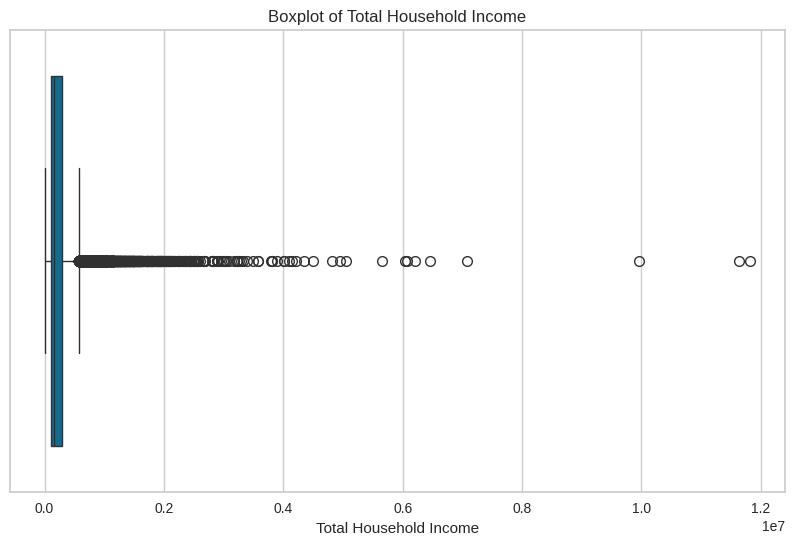

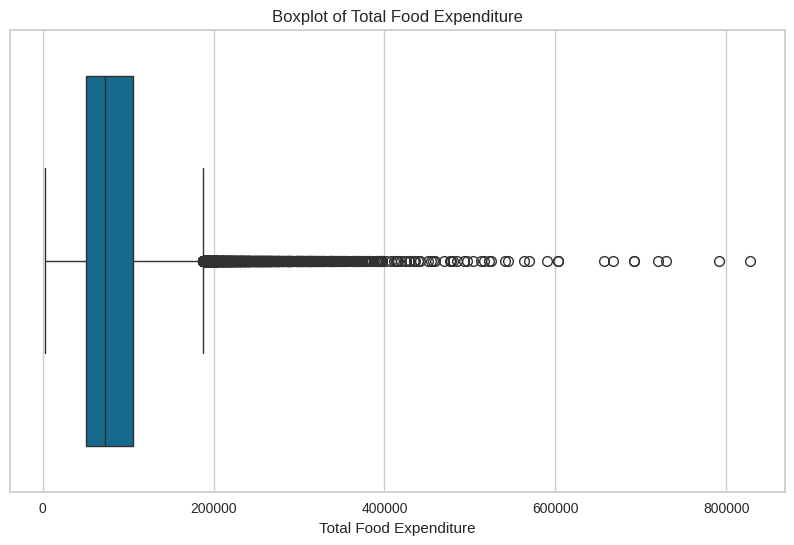

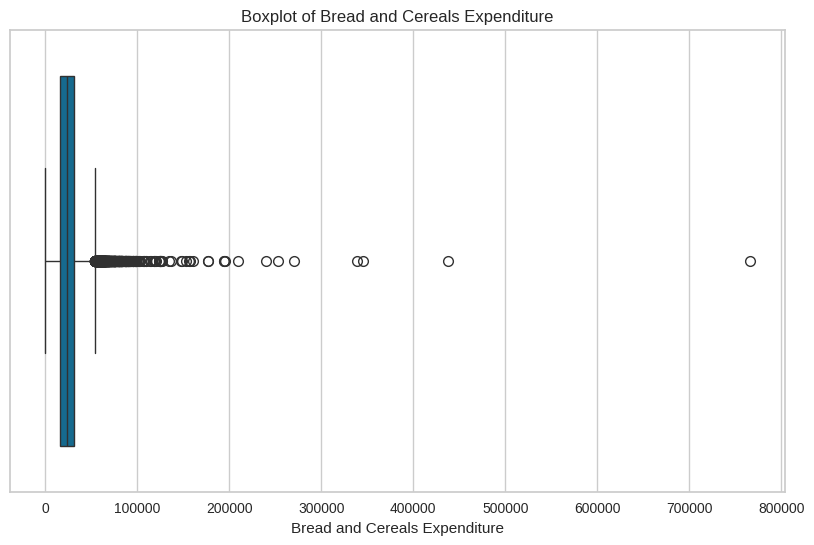

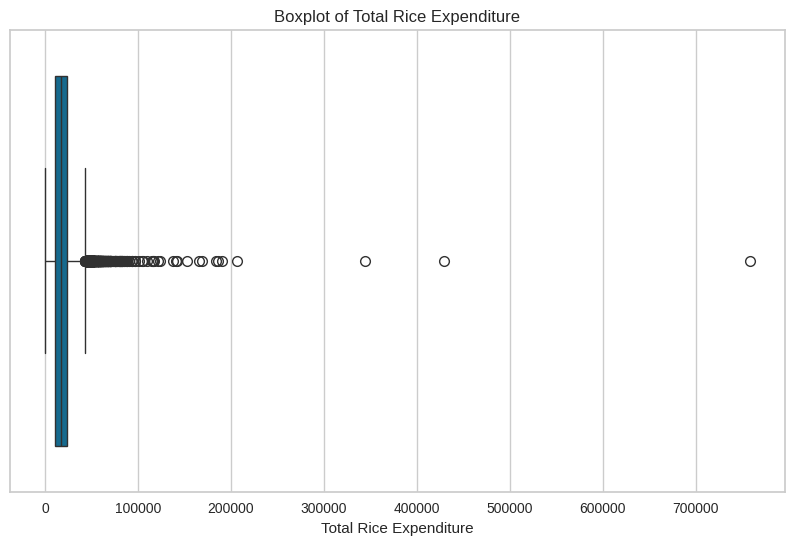

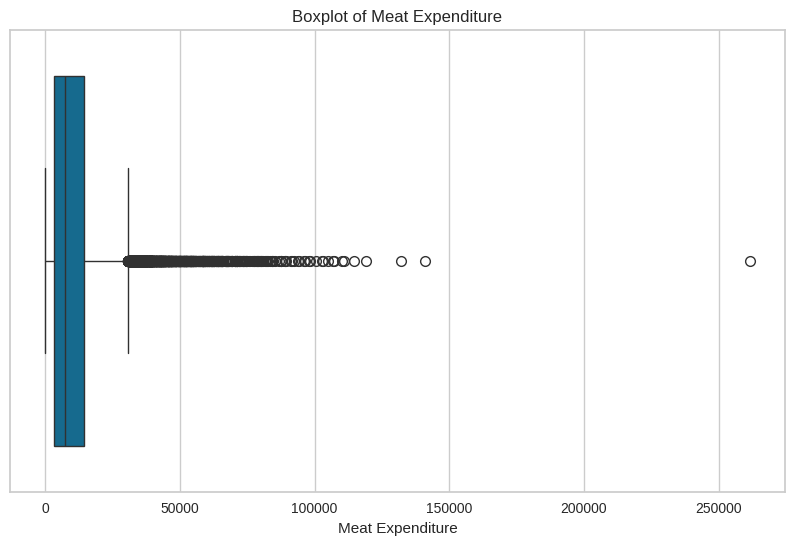

...

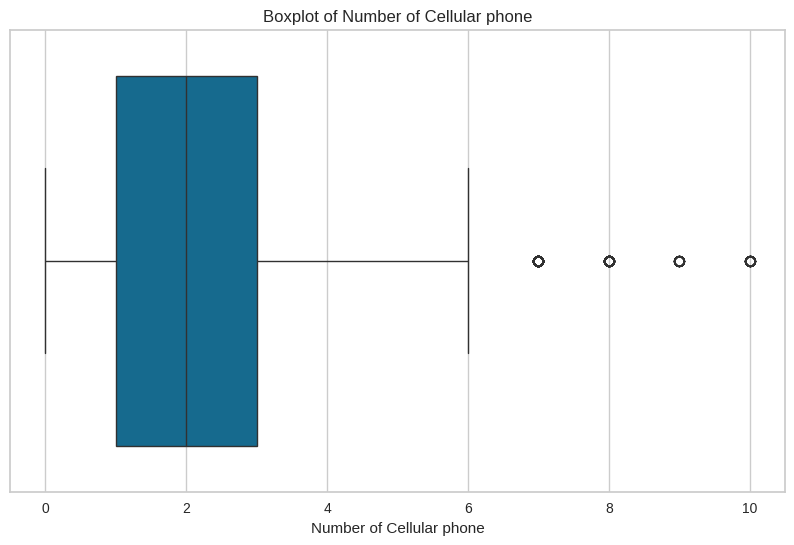

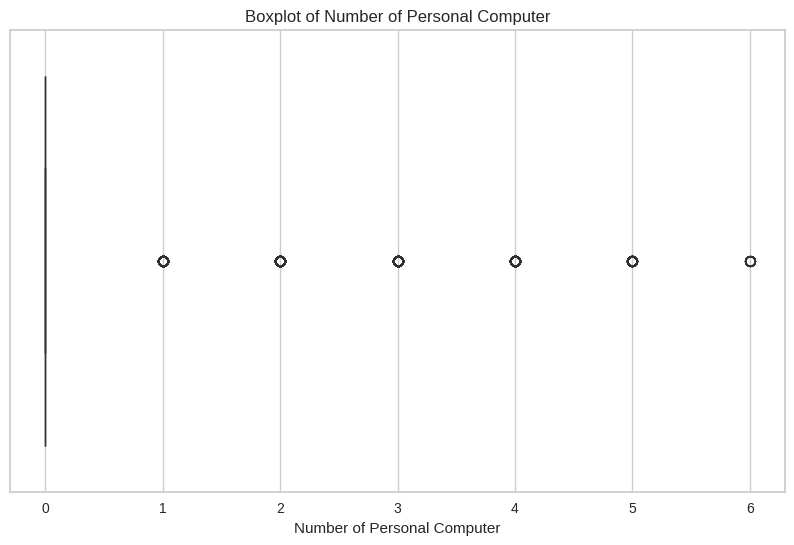

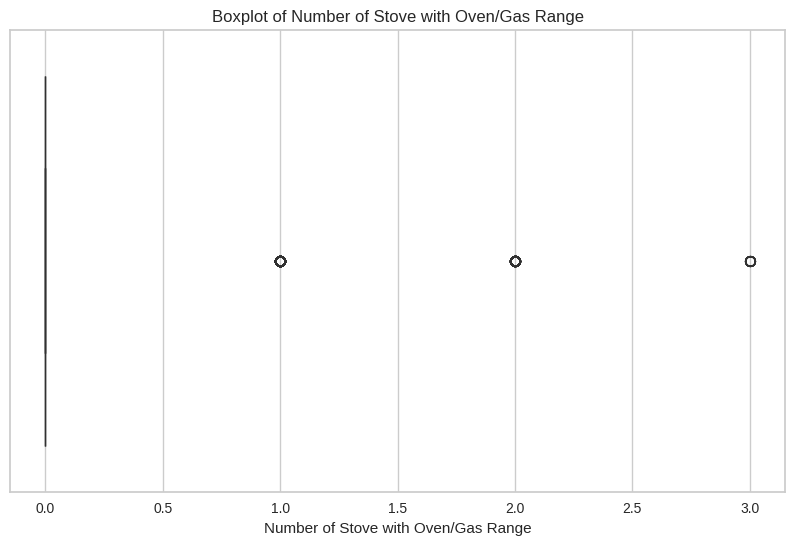

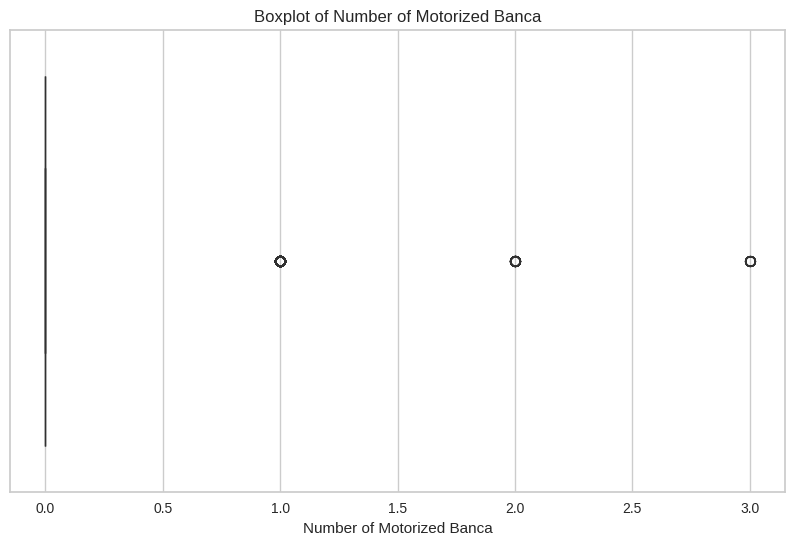

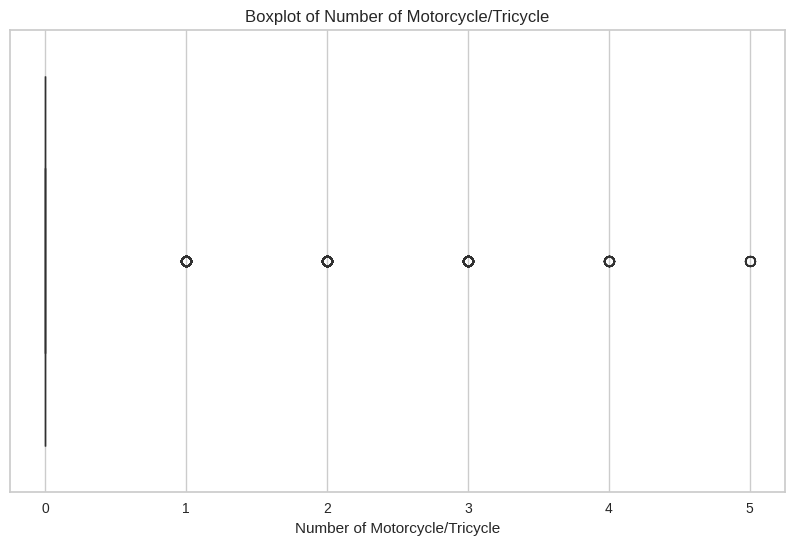

In [1658]:
# Boxplot for Numerical Columns
for col in numerical_columns:
    plt.figure(figsize=(10, 6))
    sns.boxplot(data=df, x=col)
    plt.title(f'Boxplot of {col}')
    plt.show()

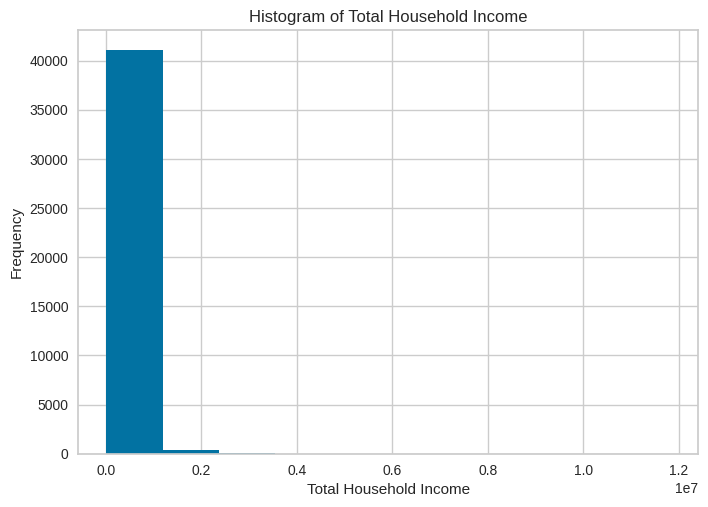

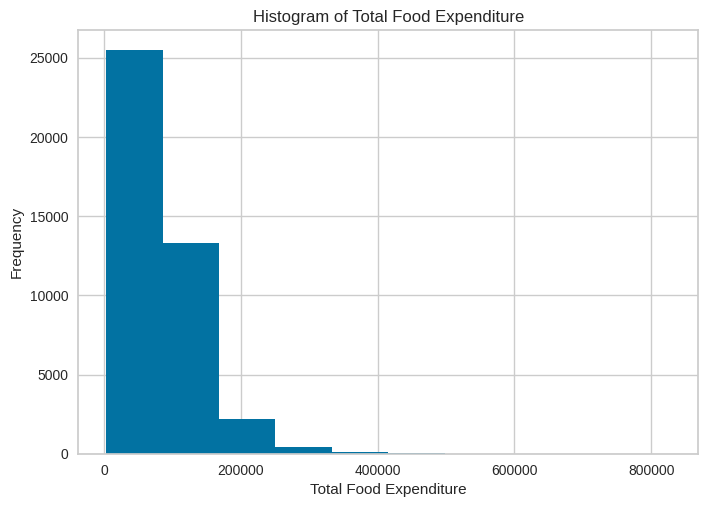

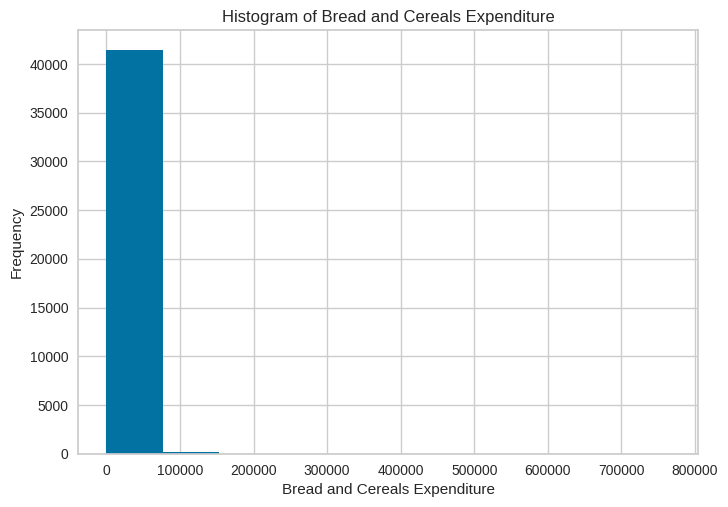

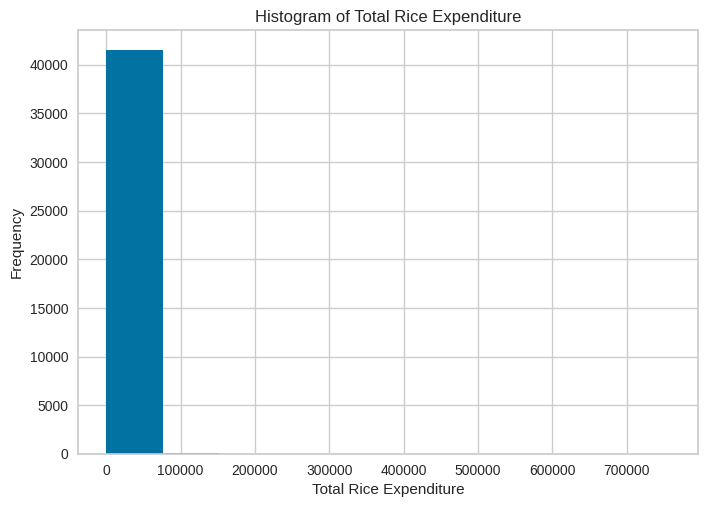

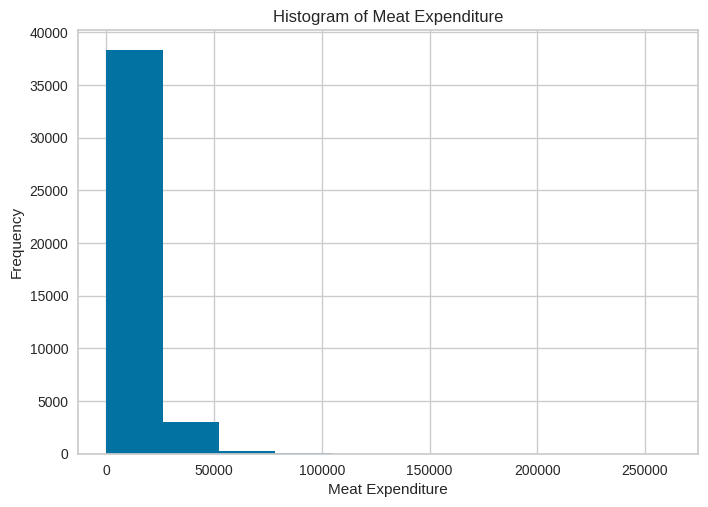

...

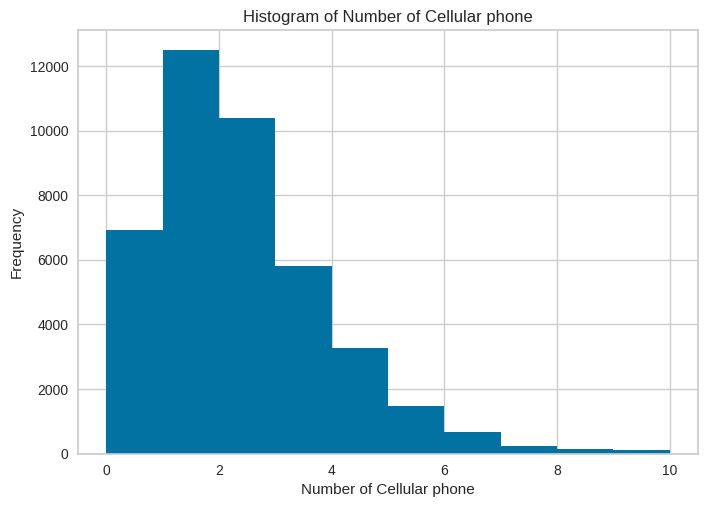

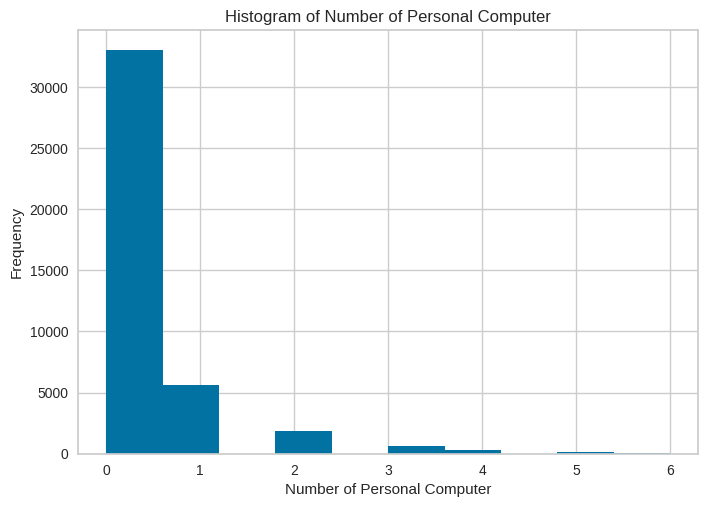

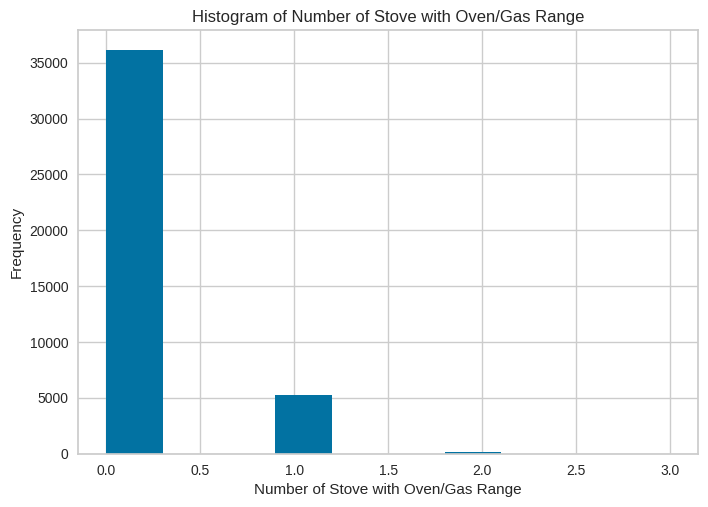

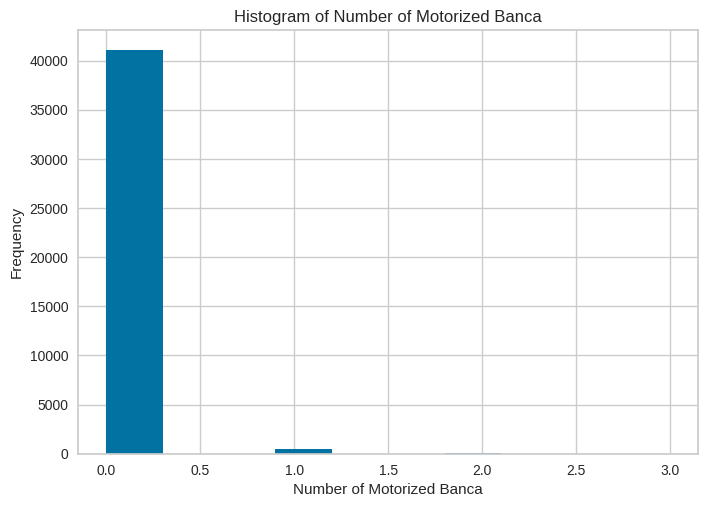

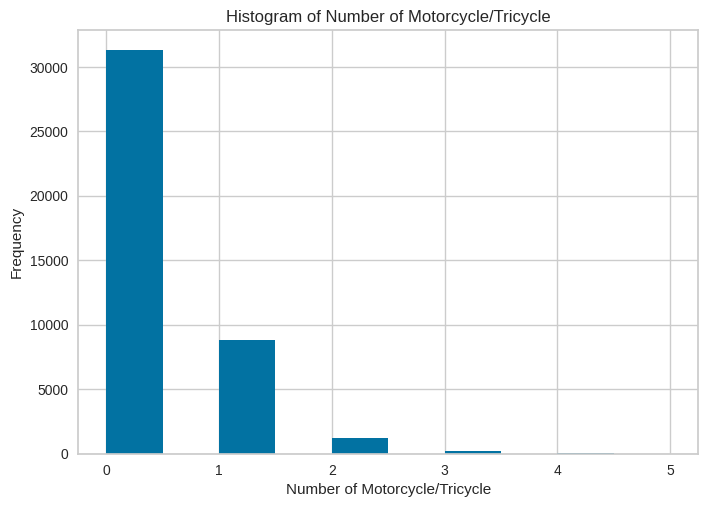

In [1659]:
# Histogram for all Numerical Columns, individually
for col in numerical_columns:
    plt.hist(df[col])
    plt.title(f'Histogram of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

In [1660]:
# Average Total Household Income per Region
average_income_per_region = df.groupby('Region')['Total Household Income'].mean().sort_values(ascending=False)
average_income_per_region

,Total Household Income
Region,
NCR,420861.861501
IVA - CALABARZON,303360.536040
III - Central Luzon,292965.181650
CAR,269540.484638
XI - Davao Region,238115.891251
I - Ilocos Region,238110.084327
II - Cagayan Valley,236778.221721
VII - Central Visayas,234909.314050
VI - Western Visayas,220481.260260


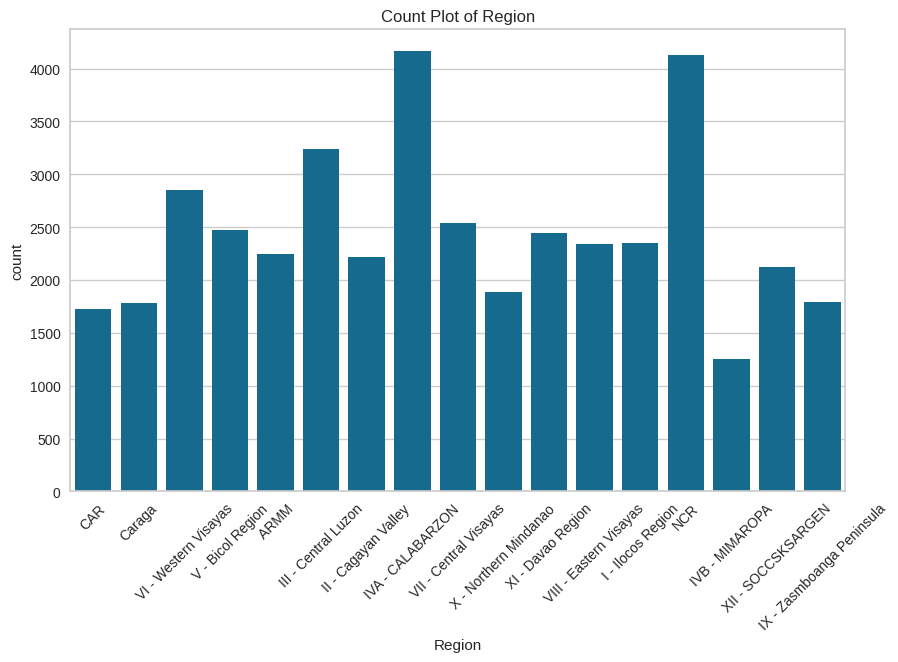

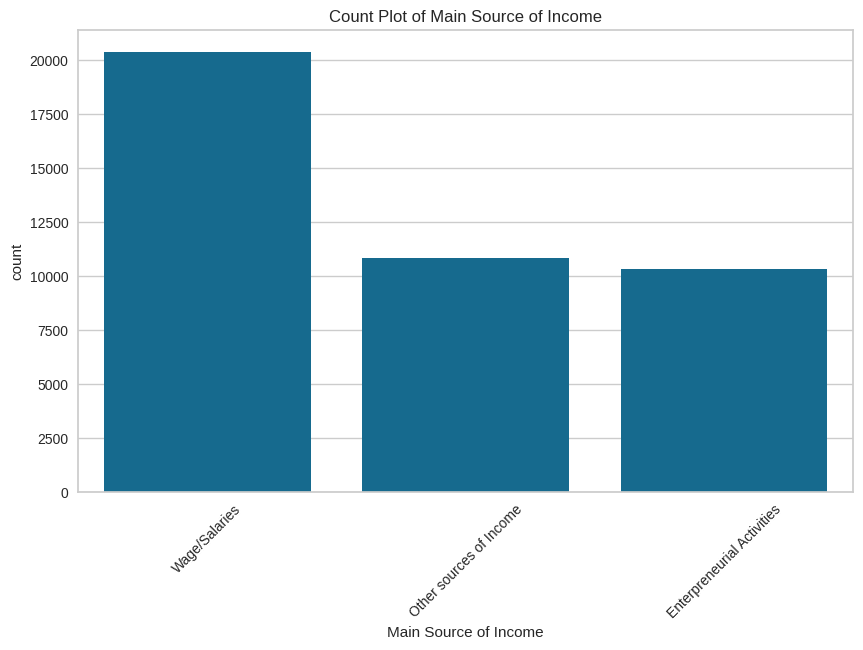

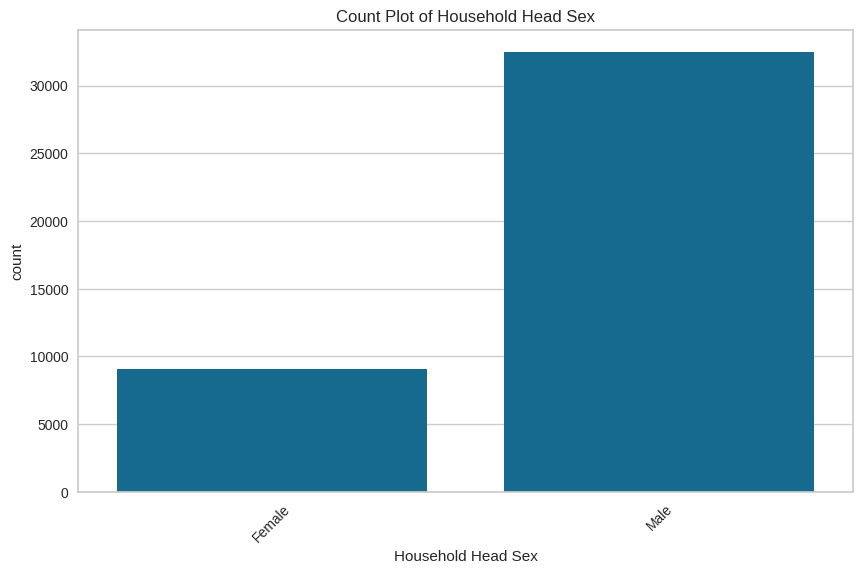

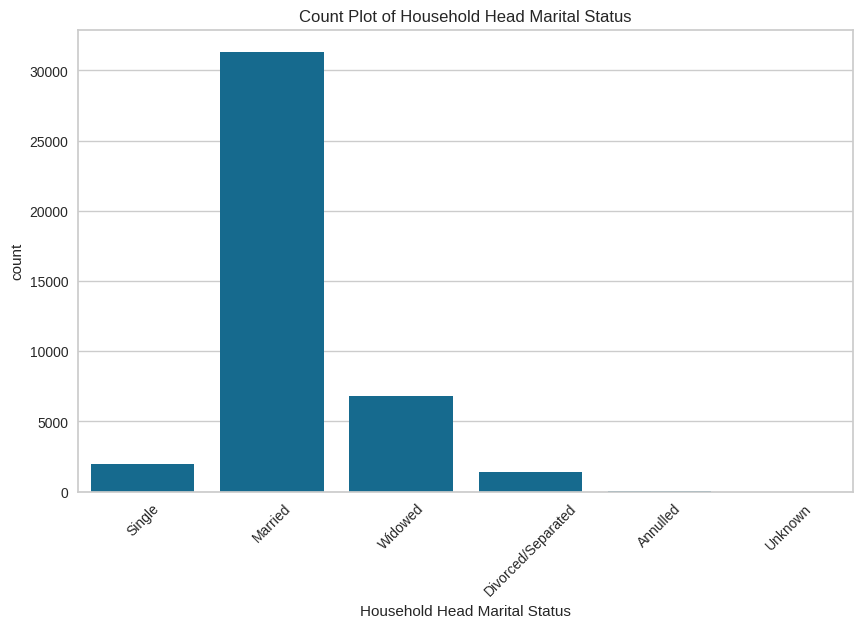

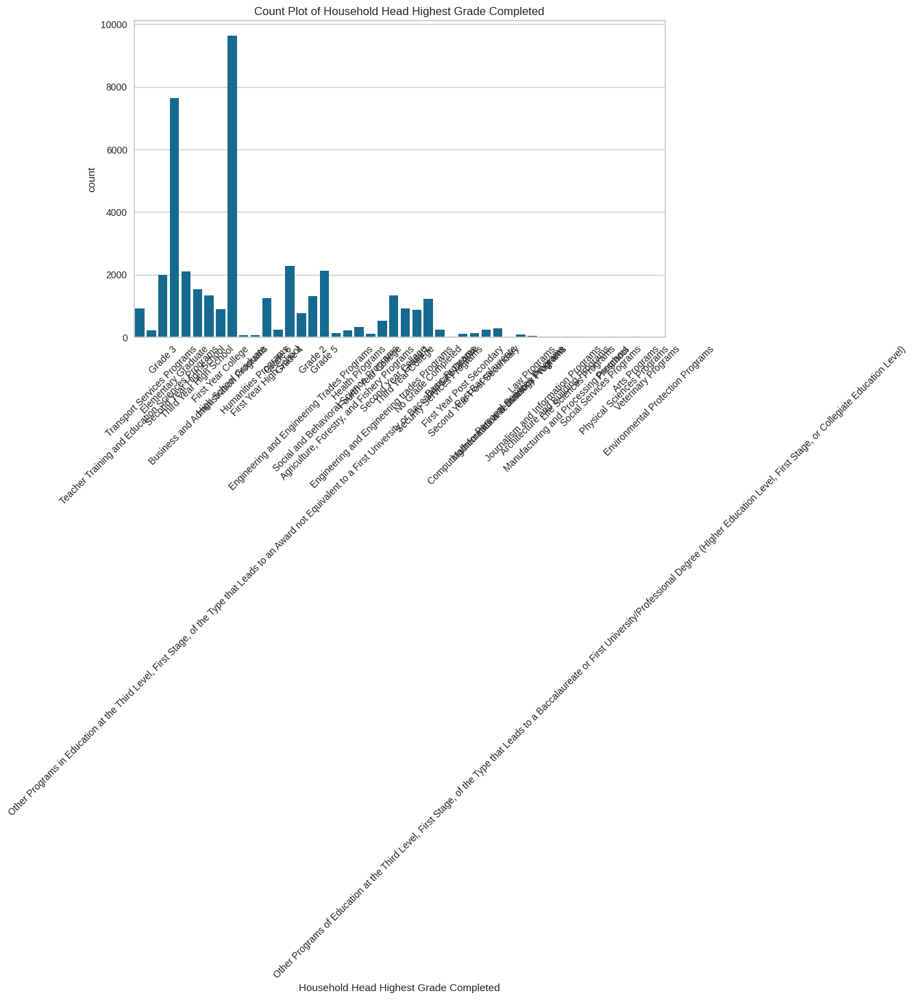

...

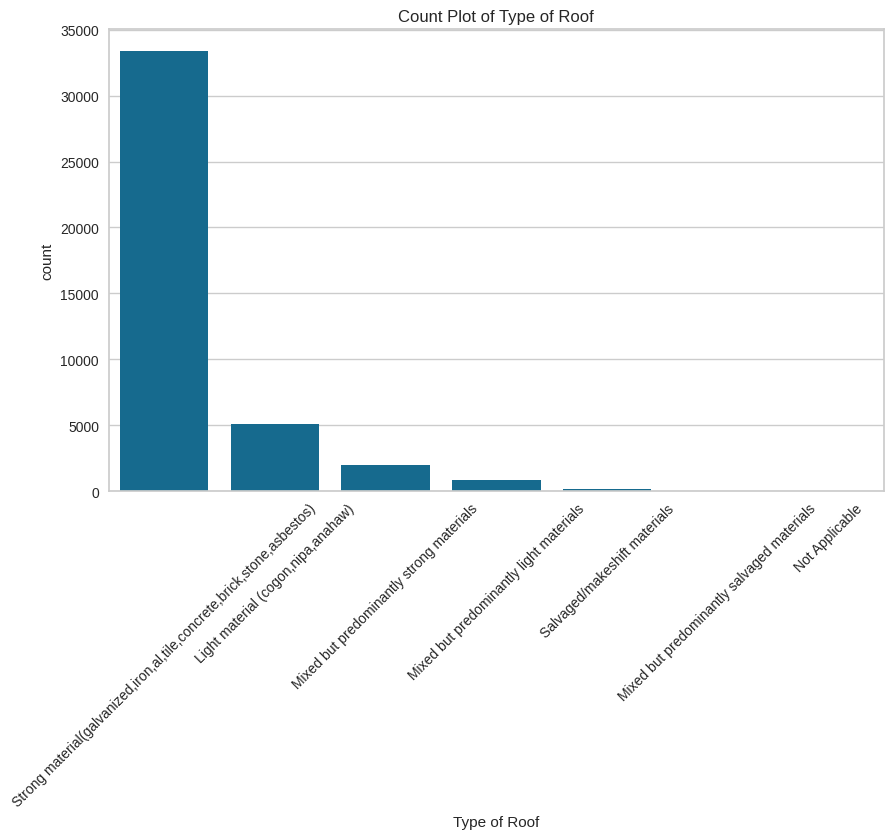

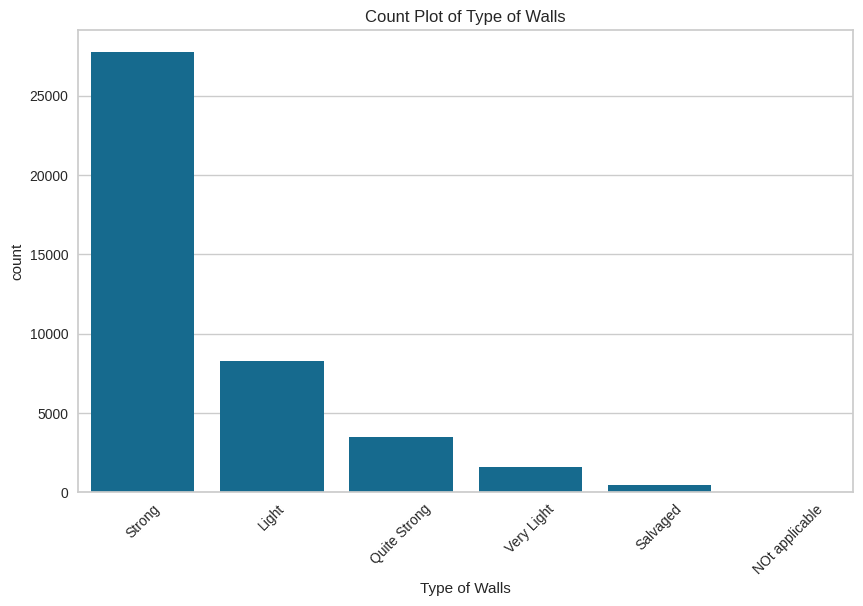

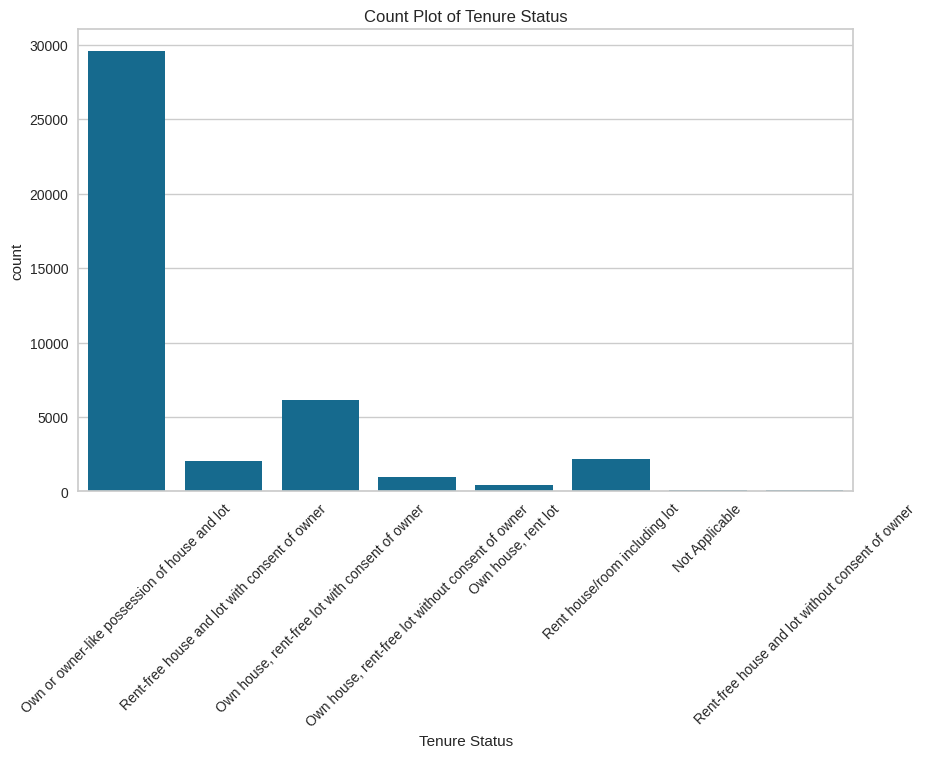

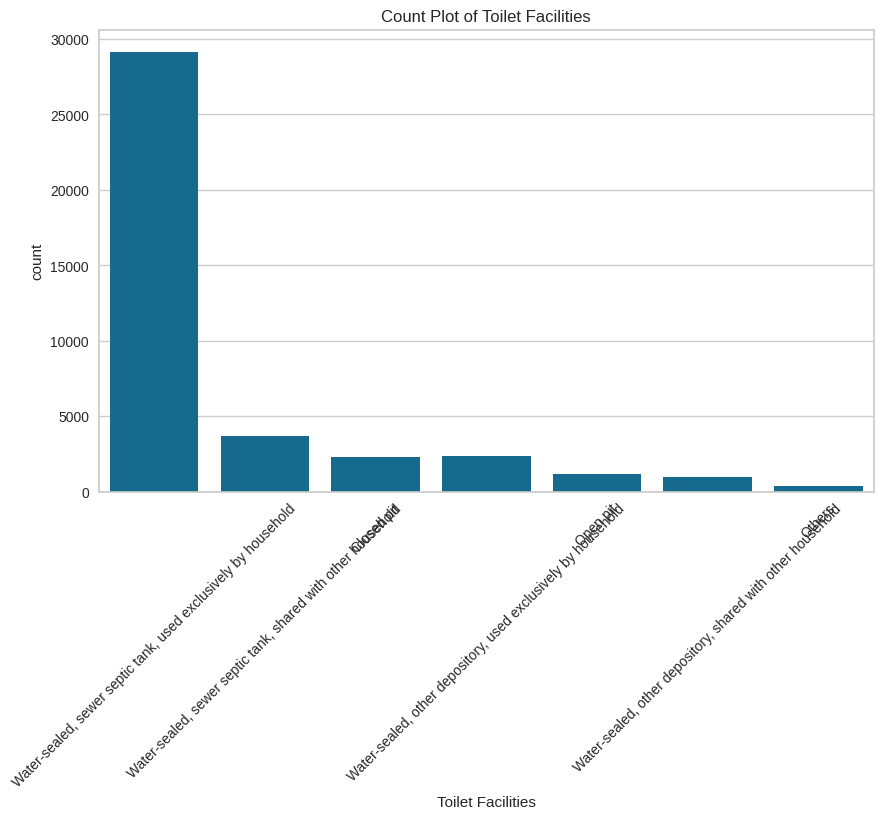

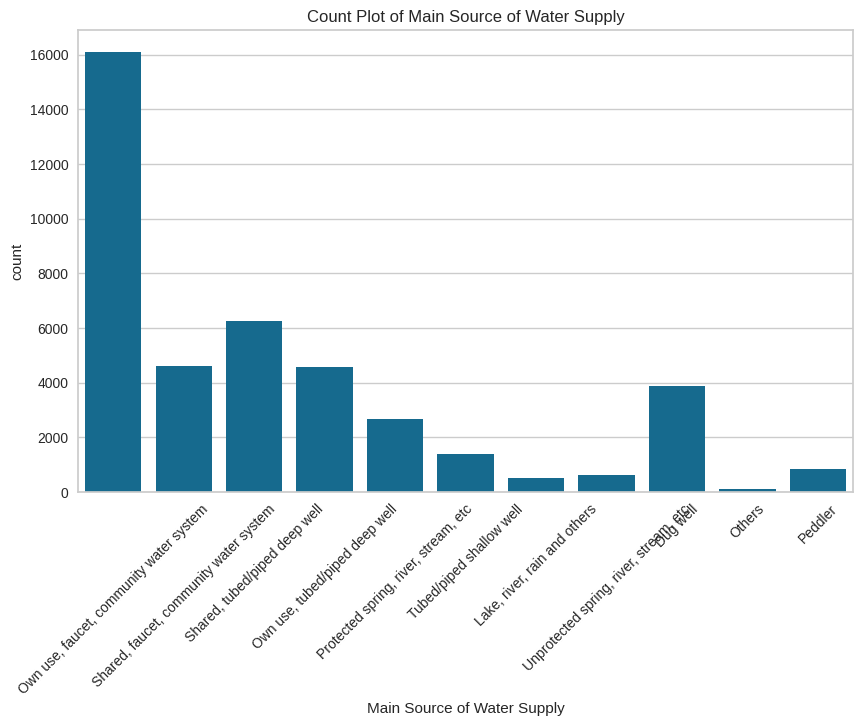

In [1661]:
# Plot categorical columns. Tilt x values
for col in categorical_columns:
    plt.figure(figsize=(10, 6))
    sns.countplot(data=df, x=col)
    plt.xticks(rotation=45)
    plt.title(f'Count Plot of {col}')

In [1662]:
# Unique Values of Null Columns : Household Head Occupation, Household Head Class of Worker, Toilet Facilities
null_columns = df.columns[df.isna().any()]
null_columns

Index(['Household Head Occupation', 'Household Head Class of Worker',
       'Toilet Facilities'],
      dtype='object')

In [1663]:
# Print unique values for each null column
for column in null_columns:
    unique_values = df[column].unique()
    print(f"Unique values for {column}: {unique_values}")

Unique values for Household Head Occupation: ['General elementary education teaching professionals'
 'Transport conductors' 'Farmhands and laborers' 'Rice farmers'
 'General managers/managing proprietors in transportation, storage and communications'
 'Heavy truck and lorry drivers' nan 'Hog raising farmers'
 'Vegetable farmers'
 'General managers/managing proprietors in wholesale and retail trade'
 'Stocks clerks' 'Justices' 'Other social science professionals'
 'Protective services workers n. e. c.' 'Secretaries'
 'Electronics mechanics and servicers' 'Foresters and related scientists'
 'Shop salespersons and demonstrators'
 'College, university and higher education teaching professionals'
 'General managers/managing proprietors of restaurants and hotels'
 'Welders and flamecutters' 'Car, taxi and van drivers'
 'Motor vehicle mechanics and related trades workers'
 'Traditional chiefs and heads of villages' 'Motorcycle drivers'
 'Statistical, mathematical and related associate profess

In [1664]:
df['Household Head Occupation'].value_counts()

,count
Household Head Occupation,
Farmhands and laborers,3478
Rice farmers,2849
General managers/managing proprietors in wholesale and retail trade,2028
"General managers/managing proprietors in transportation, storage and communications",1932
Corn farmers,1724
...,...
Petroleum and natural gas refining plant operators,1
Builders (traditional materials),1
"Personal care and related workers, n. e. c.",1


In [1665]:
df['Household Head Highest Grade Completed'].value_counts()

,count
Household Head Highest Grade Completed,
High School Graduate,9628
Elementary Graduate,7640
Grade 4,2282
Grade 5,2123
Second Year High School,2104
Grade 3,1994
Third Year High School,1545
Business and Administration Programs,1344
Second Year College,1343


In [1666]:
df['Household Head Class of Worker'].value_counts()

,count
Household Head Class of Worker,
Self-employed wihout any employee,13766
Worked for private establishment,13731
Worked for government/government corporation,2820
Employer in own family-operated farm or business,2581
Worked for private household,811
Worked without pay in own family-operated farm or business,285
Worked with pay in own family-operated farm or business,14


In [1667]:
# Regions of Rows with Null Columns
df[df['Household Head Occupation'].isna()]['Region'].value_counts() # 7536 Null Values

,count
Region,
NCR,1021
IVA - CALABARZON,924
III - Central Luzon,804
I - Ilocos Region,553
VI - Western Visayas,548
VII - Central Visayas,449
V - Bicol Region,411
VIII - Eastern Visayas,370
XI - Davao Region,366


In [1668]:
df[df['Household Head Class of Worker'].isna()]['Region'].value_counts() #7536 Null Values

,count
Region,
NCR,1021
IVA - CALABARZON,924
III - Central Luzon,804
I - Ilocos Region,553
VI - Western Visayas,548
VII - Central Visayas,449
V - Bicol Region,411
VIII - Eastern Visayas,370
XI - Davao Region,366


In [1669]:
# Regions of Rows with Null 'Household Head Occupation' and 'Household Head Class of Worker'
df[(df['Household Head Occupation'].isna()) & (df['Household Head Class of Worker'].isna())]['Region'].value_counts() # 7536 Null Values

,count
Region,
NCR,1021
IVA - CALABARZON,924
III - Central Luzon,804
I - Ilocos Region,553
VI - Western Visayas,548
VII - Central Visayas,449
V - Bicol Region,411
VIII - Eastern Visayas,370
XI - Davao Region,366


In [1670]:
df[df['Toilet Facilities'].isna()]['Region'].value_counts() # 1580 Null Values

,count
Region,
V - Bicol Region,277
VI - Western Visayas,224
VIII - Eastern Visayas,210
VII - Central Visayas,193
ARMM,144
IVA - CALABARZON,112
XII - SOCCSKSARGEN,86
IVB - MIMAROPA,76
Caraga,74


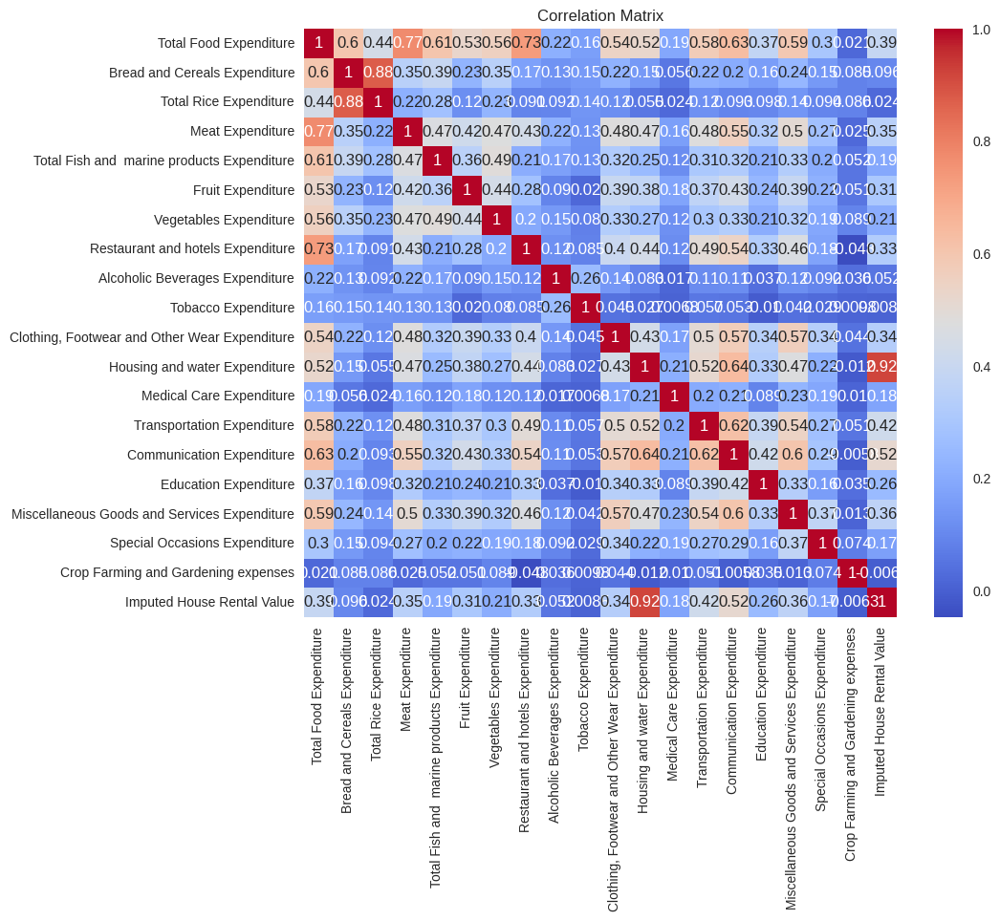

In [1671]:
# Plot Correlation Matrix for Numerical Values
plt.figure(figsize=(10, 8))
sns.heatmap(df[expenditure_columns].corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

# Feature Engineering

In [1672]:
# Get Unaccounted Bread and Cereals Expenditure by Subtracting Total Rice Expenditure from Bread and Cereals Expenditure
df['Other Bread and Cereals Expenditure'] = df['Bread and Cereals Expenditure'] - df['Total Rice Expenditure']

In [1673]:
# Get Unaccounted Housing and water Expenditure
df['Unaccounted Housing and water Expenditure'] = df['Housing and water Expenditure'] - df['Imputed House Rental Value']

In [1674]:
# Include Other Bread and Cereals Expenditure
expenditure_columns = np.append(expenditure_columns, 'Other Bread and Cereals Expenditure')

In [1675]:
# Include Unaccounted Housing and water Expenditure
expenditure_columns = np.append(expenditure_columns, 'Unaccounted Housing and water Expenditure')

In [1676]:
expenditure_columns

array(['Total Food Expenditure', 'Bread and Cereals Expenditure',
       'Total Rice Expenditure', 'Meat Expenditure',
       'Total Fish and  marine products Expenditure', 'Fruit Expenditure',
       'Vegetables Expenditure', 'Restaurant and hotels Expenditure',
       'Alcoholic Beverages Expenditure', 'Tobacco Expenditure',
       'Clothing, Footwear and Other Wear Expenditure',
       'Housing and water Expenditure', 'Medical Care Expenditure',
       'Transportation Expenditure', 'Communication Expenditure',
       'Education Expenditure',
       'Miscellaneous Goods and Services Expenditure',
       'Special Occasions Expenditure',
       'Crop Farming and Gardening expenses',
       'Imputed House Rental Value',
       'Other Bread and Cereals Expenditure',
       'Unaccounted Housing and water Expenditure'], dtype=object)

In [1677]:
# Aggregate Essential Spending
essential_cols = ['Total Food Expenditure', 'Housing and water Expenditure',
                  'Medical Care Expenditure', 'Education Expenditure',
                  'Communication Expenditure', 'Transportation Expenditure', 'Crop Farming and Gardening expenses']

df['Total_Essential_Spending'] = df[essential_cols].sum(axis=1)

In [1678]:
# Aggregate Non-Essential Spending
non_essential_cols = [
    'Restaurant and hotels Expenditure', 'Alcoholic Beverages Expenditure',
    'Tobacco Expenditure', 'Clothing, Footwear and Other Wear Expenditure',
    'Miscellaneous Goods and Services Expenditure', 'Special Occasions Expenditure'
]

df['Total_NonEssential_Spending'] = df[non_essential_cols].sum(axis=1)

In [1679]:
df['Total Expenditure'] = df['Total_Essential_Spending'] + df['Total_NonEssential_Spending']

In [1680]:
# Aggregate Non-Food Spending
non_food_expenditure_cols = ['Housing and water Expenditure', 'Alcoholic Beverages Expenditure',
                             'Tobacco Expenditure', 'Clothing, Footwear and Other Wear Expenditure',
                             'Miscellaneous Goods and Services Expenditure', 'Special Occasions Expenditure',
                             'Restaurant and hotels Expenditure', 'Crop Farming and Gardening expenses',
                             'Medical Care Expenditure', 'Education Expenditure',
                             'Communication Expenditure', 'Transportation Expenditure']

df['Total_NonFood_Spending'] = df[non_food_expenditure_cols].sum(axis=1)

In [1681]:
specific_food_expenditure_cols = ['Bread and Cereals Expenditure', 'Other Bread and Cereals Expenditure', 'Total Rice Expenditure', 'Meat Expenditure',
                                  'Total Fish and  marine products Expenditure', 'Fruit Expenditure', 'Vegetables Expenditure']

In [1682]:
# Income minus Expenditure
df['Diff_Income_Expenditure'] = df['Total Household Income'] - df['Total Expenditure']

In [1683]:
# Count rows where Diff_Income Expenditures > 0
df[df['Diff_Income_Expenditure'] > 0].shape

(24952, 67)

In [1684]:
# Create Remaining_Income column where Diff_Income_Expenditure is greater than 0, else 0
df['Remaining_Income'] = np.where(df['Diff_Income_Expenditure'] > 0, df['Diff_Income_Expenditure'], 0)

In [1685]:
# Create Amount_Outside_Income where Diff_Income_Expenditure is less than 0, else 0
df['Amount_Outside_Income'] = np.where(df['Diff_Income_Expenditure'] < 0, df['Diff_Income_Expenditure'], 0)

In [1686]:
# Convert to Positive Value 'Amount_Outside_Income'
df['Amount_Outside_Income'] = df['Amount_Outside_Income'].abs()

In [1687]:
# Drop Diff_Income_Expenditure
df.drop(columns=['Diff_Income_Expenditure'], inplace=True)

In [1688]:
# Add Essential and Non-Essential Spending to expenditure columns
expenditure_columns = np.append(expenditure_columns, 'Total_Essential_Spending')
expenditure_columns = np.append(expenditure_columns, 'Total_NonEssential_Spending')
expenditure_columns = np.append(expenditure_columns, 'Total_NonFood_Spending')
expenditure_columns = np.append(expenditure_columns, 'Total Expenditure')
expenditure_columns

array(['Total Food Expenditure', 'Bread and Cereals Expenditure',
       'Total Rice Expenditure', 'Meat Expenditure',
       'Total Fish and  marine products Expenditure', 'Fruit Expenditure',
       'Vegetables Expenditure', 'Restaurant and hotels Expenditure',
       'Alcoholic Beverages Expenditure', 'Tobacco Expenditure',
       'Clothing, Footwear and Other Wear Expenditure',
       'Housing and water Expenditure', 'Medical Care Expenditure',
       'Transportation Expenditure', 'Communication Expenditure',
       'Education Expenditure',
       'Miscellaneous Goods and Services Expenditure',
       'Special Occasions Expenditure',
       'Crop Farming and Gardening expenses',
       'Imputed House Rental Value',
       'Other Bread and Cereals Expenditure',
       'Unaccounted Housing and water Expenditure',
       'Total_Essential_Spending', 'Total_NonEssential_Spending',
       'Total_NonFood_Spending', 'Total Expenditure'], dtype=object)

In [1689]:
# Add Newly Created Income Columns to Income Columns
income_columns = np.append(income_columns, 'Remaining_Income')
income_columns = np.append(income_columns, 'Amount_Outside_Income')
income_columns

array(['Total Household Income',
       'Total Income from Entrepreneurial Acitivites', 'Remaining_Income',
       'Amount_Outside_Income'], dtype=object)

In [1690]:
income_columns

array(['Total Household Income',
       'Total Income from Entrepreneurial Acitivites', 'Remaining_Income',
       'Amount_Outside_Income'], dtype=object)

In [1691]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41544 entries, 0 to 41543
Data columns (total 68 columns):
 #   Column                                         Non-Null Count  Dtype 
---  ------                                         --------------  ----- 
 0   Total Household Income                         41544 non-null  int64 
 1   Region                                         41544 non-null  object
 2   Total Food Expenditure                         41544 non-null  int64 
 3   Main Source of Income                          41544 non-null  object
 4   Agricultural Household indicator               41544 non-null  int64 
 5   Bread and Cereals Expenditure                  41544 non-null  int64 
 6   Total Rice Expenditure                         41544 non-null  int64 
 7   Meat Expenditure                               41544 non-null  int64 
 8   Total Fish and  marine products Expenditure    41544 non-null  int64 
 9   Fruit Expenditure                              41544 non-null

In [1692]:
essential_household_assets = ['Number of Refrigerator/Freezer',
                'Number of Stove with Oven/Gas Range',
                'Number of Washing Machine']

communication_and_connectivity_assets = ['Number of Cellular phone',
                 'Number of Landline/wireless telephones', 'Number of Personal Computer']

transporation_assets = ['Number of Car, Jeep, Van', 'Number of Motorcycle/Tricycle', 'Number of Motorized Banca']

entertainment_and_leisure_assets = ['Number of Television', 'Number of CD/VCD/DVD', 'Number of Component/Stereo set']

In [1693]:
# Create Different Asset Counts columns based on the listed assets
df['Essential_Household_Assets'] = df[essential_household_assets].sum(axis=1)
df['Communication_and_Connectivity_Assets'] = df[communication_and_connectivity_assets].sum(axis=1)
df['Transporation_Assets'] = df[transporation_assets].sum(axis=1)
df['Entertainment_and_Leisure_Assets'] = df[entertainment_and_leisure_assets].sum(axis=1)

In [1694]:
# Create binary indicator if a household has an Air conditioner based on Number of Airconditioner
df['Has_Air_Conditioner'] = np.where(df['Number of Airconditioner'] > 0, 1, 0)

In [1695]:
# Compile in one List all created assets columns
household_assets = ['Essential_Household_Assets', 'Communication_and_Connectivity_Assets', 'Transporation_Assets', 'Entertainment_and_Leisure_Assets', 'Has_Air_Conditioner']

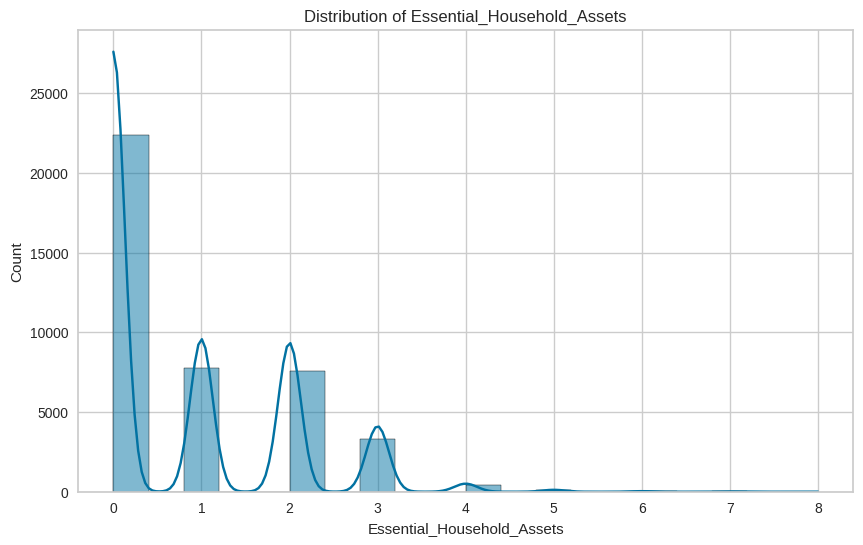

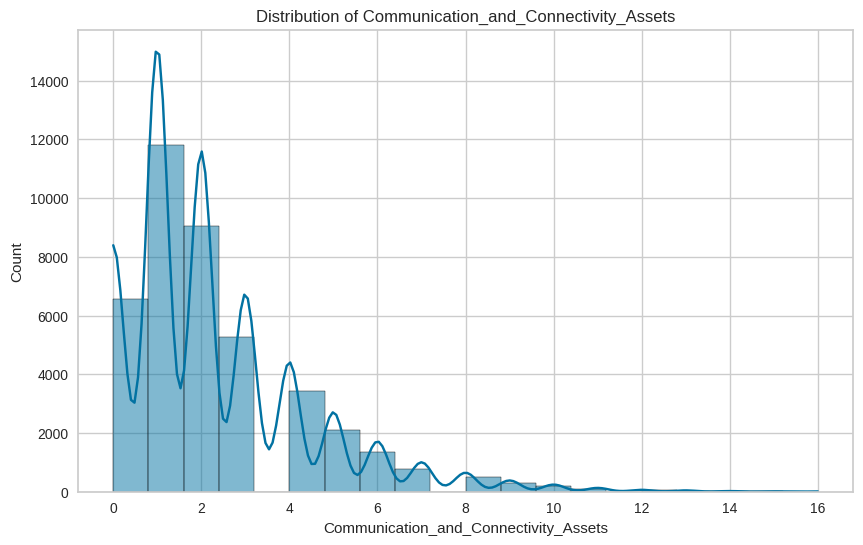

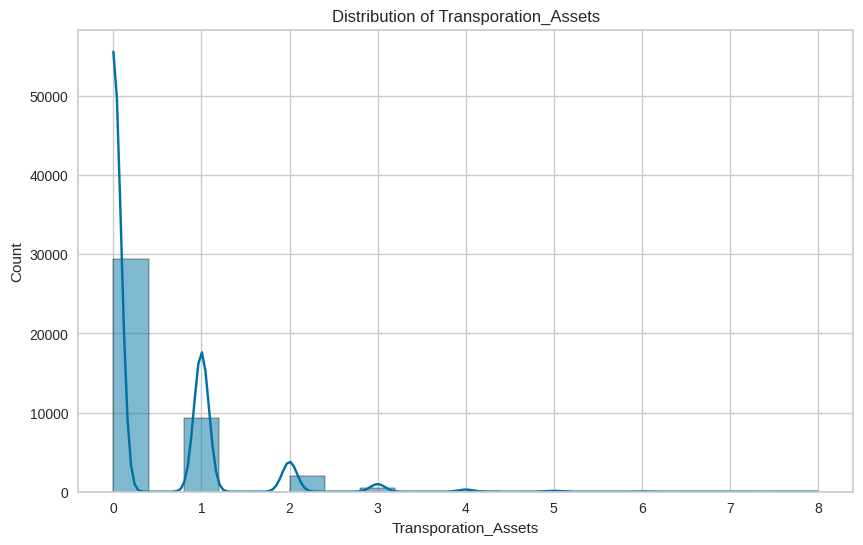

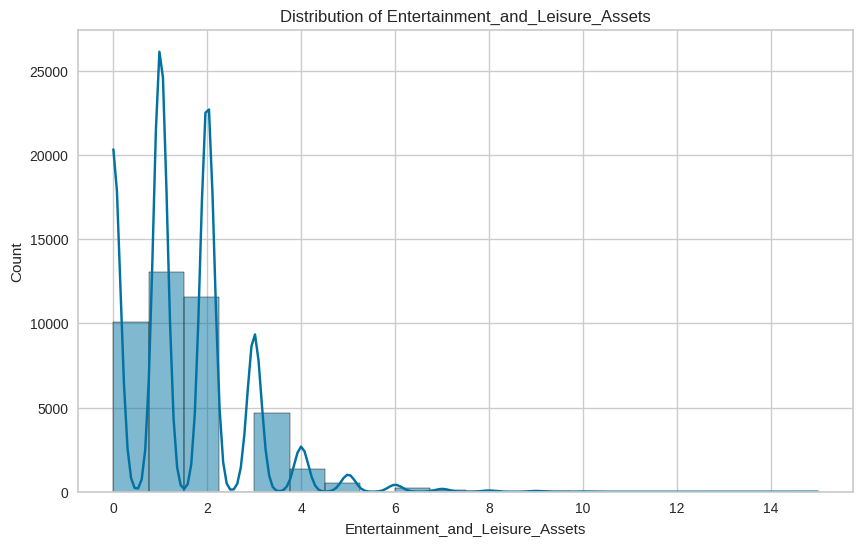

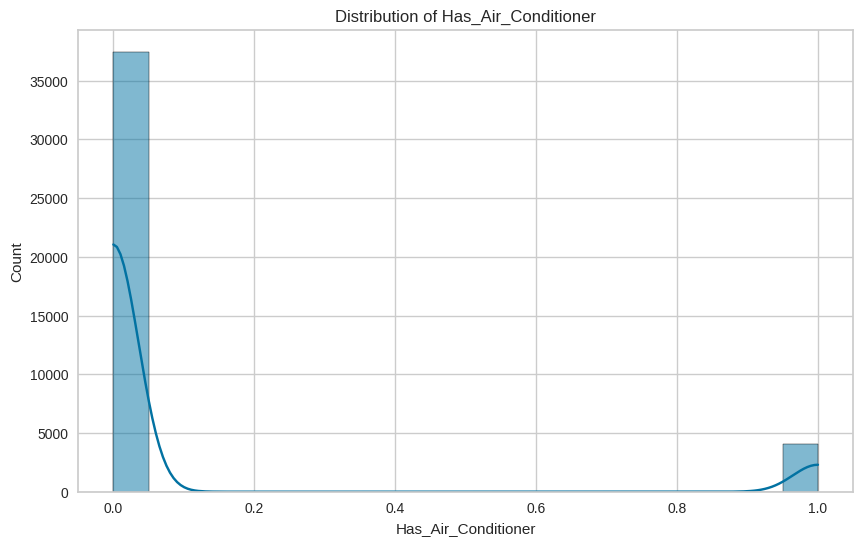

In [1696]:
# Plot all columns in household_assets, individually
for col in household_assets:
    plt.figure(figsize=(10, 6))
    sns.histplot(df[col], bins=20, kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)

In [1697]:
# Capture number of unemployed people
df['Number of Unemployed'] = df['Total Number of Family members'] - df['Total number of family members employed']

In [1698]:
# If Number of Unemployed is Negative, change it to 0
df['Number of Unemployed'] = df['Number of Unemployed'].apply(lambda x: 0 if x < 0 else x)

In [1699]:
# Capture number of Kids
df['Number of Kids'] = df['Members with age less than 5 year old'] + df['Members with age 5 - 17 years old']

In [1700]:
# Capture number of dependencies
df['Number of Dependencies'] = df['Number of Kids'] + df['Number of Unemployed']

In [1701]:
# Refresh numerical columns
numerical_columns = df.select_dtypes(include=[np.number]).columns
numerical_columns

Index(['Total Household Income', 'Total Food Expenditure',
       'Agricultural Household indicator', 'Bread and Cereals Expenditure',
       'Total Rice Expenditure', 'Meat Expenditure',
       'Total Fish and  marine products Expenditure', 'Fruit Expenditure',
       'Vegetables Expenditure', 'Restaurant and hotels Expenditure',
       'Alcoholic Beverages Expenditure', 'Tobacco Expenditure',
       'Clothing, Footwear and Other Wear Expenditure',
       'Housing and water Expenditure', 'Imputed House Rental Value',
       'Medical Care Expenditure', 'Transportation Expenditure',
       'Communication Expenditure', 'Education Expenditure',
       'Miscellaneous Goods and Services Expenditure',
       'Special Occasions Expenditure', 'Crop Farming and Gardening expenses',
       'Total Income from Entrepreneurial Acitivites', 'Household Head Age',
       'Total Number of Family members',
       'Members with age less than 5 year old',
       'Members with age 5 - 17 years old',
      

In [1702]:
# Remove Electricity and Agricultural Household Indicator
numerical_columns = np.delete(numerical_columns, np.where(numerical_columns == 'Electricity'))
numerical_columns = np.delete(numerical_columns, np.where(numerical_columns == 'Agricultural Household indicator'))

In [1703]:
# Fill Null Columns with 'Unknown'
df[null_columns] = df[null_columns].fillna('Unknown')

In [1704]:
# Dictionary to map occupations to industry sectors
industry_categories = {
    "Agriculture, forestry, and fishing": [
        'Farmhands and laborers', 'Rice farmers', 'Hog raising farmers', 'Vegetable farmers', 'Foresters and related scientists', 'Inland and coastal waters fishermen', 'Production and operations managers in agriculture, hunting, forestry and fishery', 'Corn farmers', 'Coconut farmers', 'Root crops farmers', 'Fruit tree farmers', 'Coffee and cacao farmers', 'Forestry laborers', 'Other orchard farmers', 'General managers/managing proprietors in agriculture, hunting, forestry and fishing', 'Motorized farm and forestry plant operators', 'Fishery laborers and helpers', 'Duck raisers', 'Cotton and fiber crops farmers', 'Forest tree planters', 'Concessionaires and loggers', 'Minor forest products gatherers', 'Chicken farmers', 'Fish-farm cultivators (excluding prawns)', 'Ornamental plant growers', 'Cattle and dairy farmers', 'Other livestock farmers', 'Deep-sea fishermen', 'Other field crop farmers', 'Sugarcane farmers', 'Other poultry farmers', 'Field legumes farmers', 'Farm technicians', 'Other plant growers', 'Seaweeds cultivators', 'Fishermen n. e. c.', 'Drivers of animal-drawn vehicles and machinery', 'Hunting and trapping laborers', 'Other animal raisers', 'Hunters and trappers', 'Other aqua products cultivators', 'Tree nut farmers'
    ],
    "Mining and quarrying": [
        'Mining and quarrying laborers', 'Earth-moving and related plant operators', 'Miners and quarry workers', 'Shotfirers and blasters', 'Mining-plant operators', 'Well drillers and borers and related workers', 'Mineral ore and stone-processing plant operators'
    ],
    "Manufacturing": [
        'Electronics mechanics and servicers', 'Welders and flamecutters', 'General managers/managing proprietors in manufacturing', 'Hand packers and other manufacturing laborers', 'Tailors, dressmakers and hatters', 'Wood and related products assemblers', 'Assembling laborers', 'Mechanical engineering technicians', 'Production supervisors and general foremen', 'Food preservers', 'Basketry weavers, brush makers and related workers', 'Wood products machine operators', 'Chemical processing plant operators n. e. c.', 'Cabinet/furniture makers and related workers', 'Blacksmiths, hammersmiths, and forging-press workers', 'Wood processing plant operators', 'Fruit, vegetable and nut processing machine operators', 'Rattan, bamboo and other wicker furniture makers', 'Rubber products machine operators', 'Sheet-metal workers', 'Handicraft workers in wood and related materials', 'Weavers, knitters and related workers', 'Cement and other mineral products machine operators', 'Silk-screen, block and textile printers', 'Grain and spice milling machine operators', 'Production and operations managers in manufacturing', 'Other machine operators and assemblers', 'Sewers, Embroiderers and related workers', 'Electronic equipment assemblers', 'Textile, leather and related patternmakers and cutters', 'Metal-wheel grinders, polishers and tool sharpeners', 'Metal finishing, plating and coating machine operators', 'Charcoal makers and related workers', 'Automated assembly-line operators', 'Sugar production machine operators', 'Glass makers, cutters, grinders and finishers', 'Tool-makers and related workers', 'Dairy products makers', 'Meat and fish processing machine operators', 'Metal melters, caster and rolling mill operators', 'Weaving and knitting machine operators', 'Mechanical machinery assemblers', 'Metal drawers and extruders', 'Precision instrument makers and repairers', 'Compositors, typesetters and related workers', 'Electrical equipment assemblers', 'Metal, rubber and plastic products assemblers', 'Baked goods and cereal and chocolate products machine operators', 'Metal molders and coremakers', 'Marine craft mechanics', 'Bookbinders and related workers', 'Jewelry and precious metal workers', 'Musical instrument makers and tuners', 'Machine-tool setters and setter operators', 'Stone splitters, cutters and carvers', 'Woodworking machine setters and setter-operators', 'Food and beverage tasters and graders', 'Pressman letterpresses and related workers', 'Shoemakers and related workers', 'Agricultural or industrial machinery mechanics and fitters', 'Upholsterers and related workers', 'Machine tool operators', 'Technician, skilled, semi-skilled workers', 'Tobacco preparers and tobacco products makers', 'Brewers and wine and other beverage machine operators', 'Papermaking plant operators', 'Pharmaceutical and toiletry products machine operators', 'Paperboard, textile and related products assemblers', 'Plastic products machine operators', 'Industrial robot operators', 'Dairy products machine operators', 'Petroleum and natural gas refining plant operators', 'Builders (traditional materials)', 'Fiber preparing, spinning and winding machine operators', 'Shoemaking and related machine operators', 'Potters and related clay and abrasive formers', 'Fiber preparers', 'Glass and ceramics kiln and related machine operators', 'Textile and leather products machine operators n. e. c.', 'Chemical products machine operators n. e. c.', 'Paper pulp plant operators', 'Sewing machine operators', 'Glass, ceramics and related plant operators n. e. c.'
    ],
    "Electricity, gas, steam and air conditioning supply": [
        'Lineman, line installers and cable splicers', 'Building and related electricians', 'Power production plant operators', 'Electrical mechanics and fitters', 'Riggers and cable splicers', 'Electronics fitters'
    ],
    "Water supply, sewerage, waste management and remediation activities": [
        'Garbage collectors', 'Incinerator, water treatment and related plant operators'
    ],
    "Construction": [
        'Carpenters and joiners', 'Building construction laborers', 'Masons and related concrete finishers', 'Painters and related workers', 'Construction and maintenance laborers: roads, dams and similar constructions', 'Plumbers, pipe fitters and other related workers', 'General managers/managing proprietors in construction', 'Varnishers and related painters', 'Structural-metal preparers, erectors and related workers', 'Roofers', 'Production and operations managers in construction', 'Building frame and related trades workers n. e. c.', 'Crane, hoist and related plant operators', 'Floor layers and tile setters', 'Insulation workers', 'Wood treaters'
    ],
    "Wholesale and retail trade; repair of motor vehicles and motorcycles": [
        'General managers/managing proprietors in wholesale and retail trade', 'Stocks clerks', 'Shop salespersons and demonstrators', 'Motor vehicle mechanics and related trades workers', 'Door-to-door and telephone salespersons', 'Street ambulant vendors', 'Butchers, fishmongers and related food preparers', 'Market and sidewalk stall vendors', 'Stall and market salespersons', 'Cashiers and ticket clerks', 'Sales and marketing managers', 'Production and operations managers in wholesale and retail trade', 'Sales supervisors in retail trade', 'Buyers', 'Sales supervisors in wholesale trade', 'Other sales supervisors', 'Supply and distribution managers'
    ],
    "Transportation and storage": [
        'Transport conductors', 'Heavy truck and lorry drivers','General managers/managing proprietors in transportation, storage and communications', 'Car, taxi and van drivers', 'Motorcycle drivers', "Ship's deck crews and related workers", "Ships' deck officers and pilots", 'Freight handlers', 'Transport clerks', 'Lifting truck operators', 'Production and operations managers in transport, storage and communications', 'Transport and communications service supervisors n. e. c.', 'Bus drivers', 'Mail carriers and sorting clerks', 'Hand or pedal vehicle drivers', 'Air transport service supervisors', 'Ship and aircraft controllers and technicians', 'Aircraft engine mechanics and fitters', 'Air traffic safety technicians', 'Maritime transport service supervisors', 'Locomotive engine drivers', 'Aircraft pilots, navigators and flight engineers'
    ],
    "Accommodation and food service activities": [
        'General managers/managing proprietors of restaurants and hotels', 'Cooks', 'Production and operations managers in restaurant and hotels', 'Waiters, waitresses and bartenders', 'Bakers, pastry cooks and confectionery makers', 'Housekeepers and related workers'
    ],
    "Information and communication": [
        'Broadcasting and telecommunications equipment operators', 'Data entry operators', 'Computer equipment operators', 'Other computer professionals', 'Computer programmers', 'Systems analysts and designers', 'Computer assistants', 'Telecommunication equipment installers and repairers', 'Postal service supervisors', 'Coding, proof-reading and related clerks', 'Telephone switchboard operators', 'Advertising and public relations managers'
    ],
    "Financial and insurance activities": [
        'Tellers and other counter clerks', 'Statistical and finance clerks', 'Accounting and bookkeeping clerks', 'Debt collectors and related workers', 'Pawnbrokers and money lenders', 'Accountants and auditors', 'Bookkeepers', 'Finance and administration managers', 'Insurance representatives', 'Trade brokers', 'Other finance and sales associate professionals', 'Other business services and trade brokers'
    ],
    "Real estate activities": [
        'Estate agents', 'Appraisers and valuers'
    ],
    "Professional, Scientific and Technical Activities": [
        'Other social science professionals', 'Statistical, mathematical and related associate professionals', 'Civil engineers', 'Mechanical engineers', 'Agronomists and related scientists', 'Research and development managers', 'Professional, technical and related officers', 'Technical and commercial sales representatives', 'Architects', 'Electrical Engineers', 'Mining and metallurgical engineering technicians', 'Draftsmen', 'Computer engineers and related professionals', 'Other life science technicians', 'Legal and related business associate professionals', 'Other business professionals', 'Economists', 'Chemists', 'Civil engineering technicians', 'Statisticians', 'Electronics and communications engineers', 'Personnel and human resource development professionals', 'Librarians, archivists and curators', 'Town planners and related professionals', 'Electronics and communications engineering technicians', 'Industrial engineers', 'Lawyers', 'Other physical science and engineering technicians', 'Chemical engineers', 'Geodetic engineers and related professionals', 'Business machines mechanics and repairers', 'Life science technicians', 'Other engineers and related professionals', 'Electrical engineering technicians'
    ],
    "Administrative and Support Service Activities": [
        'Secretaries', 'General managers/managing proprietors n. e. c.', 'Messengers, package and luggage porters and deliverers', 'Other office clerks', 'General managers/managing proprietors of business services', 'Other supervisors, n. e. c.', 'Building caretakers', 'Doorkeepers, watchpersons and related workers', 'Personnel and industrial relations managers', 'Library and filing clerks', 'Other administrative associate professionals', 'Safety, health and quality inspectors (vehicles, processes and products)', 'Labor contractors and employment agents', 'Other specialized managers', 'Receptionists and information clerks', 'Administrative secretaries and related associate professionals', 'Word processor and related operators', 'Production clerks', 'Travel consultants and organizers', 'Stenographers and typists', 'Production and operations managers in business services'
    ],
    "Education": [
        'General elementary education teaching professionals', 'College, university and higher education teaching professionals', 'School supervisors and principals', 'School principals', 'General secondary education teaching professionals', 'Vocational education teaching professionals', 'Teaching associate professionals', 'Education methods specialists', 'Pre-elementary education teaching professionals', 'Technical and vocational instructors/trainors', 'Nonformal education teaching professionals other than technical and vocational trainors/instructors', 'Science and mathematics teaching professionals', 'Science and mathematics elementary education teaching professionals', 'Other teaching professionals'
    ],
    "Human Health and Social Work Activities": [
        'Social work associate professionals', 'Medical technologists', 'Child care workers', 'Institution-based personal care workers', 'Traditional medicine practitioners', 'Midwifery associate professionals', 'Professional nurses', 'Veterinary assistants', 'Pharmacists', 'Nutritionists-dietitians', 'Professional midwives', 'Home-based personal care workers', 'Other health associate professionals (except nursing)', 'Medical assistants', 'Medical doctors', 'Faith healers', 'Dentists', 'Social work professionals', 'Other health professionals (except nursing)', 'Dental assistants', 'Pharmaceutical assistants', 'Medical equipment operators', 'Nursing associate professionals', 'Physiotherapists', 'Optometrists and opticians', 'Veterinarians'
    ],
    "Arts, Entertainment and Recreation": [
        'Bet bookmakers and croupiers', 'Choreographers and dancers', 'Athletes and related workers', 'Decorators and commercial designers', 'Street, nightclub and related musicians, singers and dancers', 'Composers, musicians and singers', 'Photographers and image and sound recording equipment operators', 'Fashion and other models', 'Sculptors, painters and related artists', 'Photographic and related workers', 'Radio, television and other announcers', 'Authors, journalists and other writers', 'Other creative or performing artists'
    ],
    "Other service activities": [
        'Helpers and cleaners in offices, hotels and other establishments', 'Hand launderers and pressers', 'Sweepers and related laborers', 'Non-ordained religious associate professionals', 'Religious professionals', 'Domestic helpers and cleaners', 'General managers/managing proprietors in personal care, cleaning and relative services', 'Photographic products machine operators', 'Undertakers and embalmers', 'Hairdressers, barbers, beauticians and related workers', 'Shoe cleaning and other street services elementary occupations', 'Personal care and related workers, n. e. c.', 'Production and operations managers in personal care, cleaning and relative services', 'Other personal services workers, n. e. c.', 'Companions and valets', 'Travel guides', 'Bleaching, dyeing and cleaning machine operators', 'Service and related workers', 'Vehicle, window and related cleaners', 'Tanners'
    ],
    "Government and Public Service": [
        'Justices', 'Protective services workers n. e. c.', 'Traditional chiefs and heads of villages', 'Legislative officials', 'Police inspectors and detectives', 'Prison guards', 'Government administrators (including career executive service officers)', 'Police officers', 'Enlisted personnel n. e. c.', 'Combat soldiers', 'Firefighters', 'Staff officers', 'Government tax and excise officials', 'Commanding officers', 'Customs and immigration inspectors', 'Government licensing officials', 'Senior officials of humanitarian and other special-interest organizations', 'Building and fire inspectors', 'Other government associate professionals', 'Government social benefits officials', 'Officers, n. e. c.'
    ],
    "Workers reporting occupations unidentifiable or inadequately defined":[
        'Workers reporting occupations unidentifiable or inadequately defined'
    ],
    "Directors and chief executives of corporations": [
        'Directors and chief executives of corporations'
    ]
}

In [1705]:
# Reverse mapping for faster lookup
occupation_to_industry = {}
for industry, occupations in industry_categories.items():
    for occupation in occupations:
        occupation_to_industry[occupation] = industry

In [1706]:
# Categorizing the jobs
categorized_jobs = {industry: [] for industry in industry_categories}
for job in df['Household Head Occupation']:
    category = occupation_to_industry.get(job, 'Uncategorized')
    if category in categorized_jobs:
        categorized_jobs[category].append(job)
    else:
        categorized_jobs['Uncategorized'] = [job]

In [1707]:
# Printing the categorized jobs before applying to DataFrame
for category, jobs in categorized_jobs.items():
    print(f"{category}:")
    print(jobs)
    print('-' * 40)

Agriculture, forestry, and fishing:
['Farmhands and laborers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Hog raising farmers', 'Farmhands and laborers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Vegetable farmers', 'Vegetable farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Vegetable farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Foresters and related scientists', 'Farmhands and laborers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Farmhands and laborers', 'Rice farmers', 'Rice farmers', 'Farmhands and laborers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Farmhands and laborers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers

In [1708]:
# Define function 'categorize_occupation'
def categorize_occupation(occupation):
    for industry, occupations in industry_categories.items():
        if occupation in occupations:
            return industry
    return 'Uncategorized'

In [1709]:
df['Household Head Occupation'] = df['Household Head Occupation'].apply(categorize_occupation)

In [1710]:
# Drop Occupation "Workers reporting occupations unidentifiable or inadequately defined"
df = df[df['Household Head Occupation'] != 'Workers reporting occupations unidentifiable or inadequately defined']

In [1711]:
df['Household Head Occupation'].value_counts()

,count
Household Head Occupation,
"Agriculture, forestry, and fishing",13543
Uncategorized,7536
Wholesale and retail trade; repair of motor vehicles and motorcycles,4188
Transportation and storage,4170
Construction,2962
Manufacturing,2010
Government and Public Service,1521
Administrative and Support Service Activities,1470
Other service activities,1227


In [1712]:
highest_educational_attainment = {
    0 : [
        'No Grade Completed'
    ],
    1 : [
        'Preschool'
    ],
    2 :[
        'Grade 4','Grade 5', 'Grade 3', 'Grade 2', 'Grade 1', 'Grade 6'
    ],
    3 :[
        'Elementary Graduate'
    ],
    4 :[
        'Second Year High School', 'Third Year High School', 'First Year High School'
    ],
    5 :[
        'High School Graduate'
    ],
    6 :[
        'Third Year College', 'First Year College', 'Second Year College', 'First Year Post Secondary',
        'Second Year Post Secondary', 'Fourth Year College',
        'Other Programs in Education at the Third Level, First Stage, of the Type that Leads to an Award not Equivalent to a First University or Baccalaureate Degree',
        'Other Programs of Education at the Third Level, First Stage, of the Type that Leads to a Baccalaureate or First University/Professional Degree (HIgher Education Level, First Stage, or Collegiate Education Level)'
    ],
    7 : [
        'Business and Administration Programs', 'Teacher Training and Education Sciences Programs',
        'Engineering and Engineering Trades Programs', 'Engineering and Engineering trades Programs',
        'Health Programs', 'Computing/Information Technology Programs', 'Security Services Programs',
        'Agriculture, Forestry, and Fishery Programs', 'Transport Services Programs',
        'Social and Behavioral Science Programs', 'Personal Services Programs', 'Humanities Programs',
        'Law Programs', 'Basic Programs', 'Architecture and Building Programs', 'Journalism and Information Programs',
        'Arts Programs', 'Life Sciences Programs', 'Manufacturing and Processing Programs', 'Mathematics and Statistics Programs',
        'Social Services Programs', 'Physical Sciences Programs', 'Veterinary Programs', 'Environmental Protection Programs'
    ],
    8 : [
        'Post Baccalaureate'
    ]
}

In [1713]:
print(type(highest_educational_attainment))  # Should be <class 'dict'>
print(highest_educational_attainment)        # Check its contents

<class 'dict'>
{0: ['No Grade Completed'], 1: ['Preschool'], 2: ['Grade 4', 'Grade 5', 'Grade 3', 'Grade 2', 'Grade 1', 'Grade 6'], 3: ['Elementary Graduate'], 4: ['Second Year High School', 'Third Year High School', 'First Year High School'], 5: ['High School Graduate'], 6: ['Third Year College', 'First Year College', 'Second Year College', 'First Year Post Secondary', 'Second Year Post Secondary', 'Fourth Year College', 'Other Programs in Education at the Third Level, First Stage, of the Type that Leads to an Award not Equivalent to a First University or Baccalaureate Degree', 'Other Programs of Education at the Third Level, First Stage, of the Type that Leads to a Baccalaureate or First University/Professional Degree (HIgher Education Level, First Stage, or Collegiate Education Level)'], 7: ['Business and Administration Programs', 'Teacher Training and Education Sciences Programs', 'Engineering and Engineering Trades Programs', 'Engineering and Engineering trades Programs', 'Health 

In [1714]:
def check_education_categorization(df, column_name, highest_educational_attainment):
    # Reverse mapping: Create a lookup dictionary for fast categorization
    education_to_category = {}
    for category, levels in highest_educational_attainment.items():
        for level in levels:
            education_to_category[level] = category

    # Dictionary to store categorized entries
    categorized_levels = {category: [] for category in highest_educational_attainment}
    categorized_levels["Uncategorized"] = []  # To capture unmatched entries

    # Categorize each entry in the DataFrame
    for edu in df[column_name]:
        category = education_to_category.get(edu, "Uncategorized")
        categorized_levels[category].append(edu)

    # Print categorized results for validation
    for category, levels in categorized_levels.items():
        print(f"{category} ({len(levels)} entries):")
        print(levels[:10])  # Show a sample of 10 for readability
        print('-' * 50)

    # Return categorized results (optional)
    return categorized_levels

In [1715]:
categorized_results = check_education_categorization(df, 'Household Head Highest Grade Completed', highest_educational_attainment)

0 (1226 entries):
['No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed']
--------------------------------------------------
1 (15 entries):
['Preschool', 'Preschool', 'Preschool', 'Preschool', 'Preschool', 'Preschool', 'Preschool', 'Preschool', 'Preschool', 'Preschool']
--------------------------------------------------
2 (8814 entries):
['Grade 3', 'Grade 6', 'Grade 4', 'Grade 3', 'Grade 2', 'Grade 5', 'Grade 3', 'Grade 4', 'Grade 4', 'Grade 4']
--------------------------------------------------
3 (7635 entries):
['Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate']
--------------------------------------------------
4 (4889 entries):
['Second Year 

In [1716]:
# Define function 'Household Highest Educational Attaintment'
def categorize_highest_educational_attainment(education):
    for category, educational_levels in highest_educational_attainment.items():
        if education in educational_levels:
            return category
    return 'Uncategorized'

In [1717]:
# Apply to 'Household Head Highest Grade Completed'
df['Household Head Highest Grade Completed'] = df['Household Head Highest Grade Completed'].apply(categorize_highest_educational_attainment)

<ipython-input-1717-87369e72ec63>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Household Head Highest Grade Completed'] = df['Household Head Highest Grade Completed'].apply(categorize_highest_educational_attainment)


In [1718]:
df['Household Head Highest Grade Completed'].value_counts()

,count
Household Head Highest Grade Completed,
5,9622
2,8814
3,7635
7,5440
4,4889
6,3627
0,1226
8,247
1,15


In [1719]:
type_of_roof_classification = {
    0 : [
        'Not Applicable'
    ],
    1 : [
        'Salvaged/makeshift materials', 'Mixed but predominantly salvaged materials'
    ],
    2 :[
        'Mixed but predominantly light materials', 'Light material (cogon,nipa,anahaw)'
    ],
    3 :[
        'Mixed but predominantly strong materials', 'Strong material(galvanized,iron,al,tile,concrete,brick,stone,asbestos)'
    ]
}

In [1720]:
# Function to categorize_roof_classification
def categorize_roof_classification(roof_classification):
    for category, roof_levels in type_of_roof_classification.items():
        if roof_classification in roof_levels:
            return category
    return 'Uncategorized'

In [1721]:
# Apply classification to type of roof
df['Type of Roof'] = df['Type of Roof'].apply(categorize_roof_classification)

In [1722]:
wall_mapping = {
    'Very Light': 2,
    'Light': 3,
    'Salvaged': 1,
    'Quite Strong': 4,
    'Strong': 5,
    'NOt applicable': 0
}

In [1723]:
# Map Type of Wall
df['Type of Walls'] = df['Type of Walls'].map(wall_mapping)

In [1724]:
toilet_mapping = {
    0 : [
        'Unknown'
    ],
    1 : [
        'Others'
    ],
    2 :[
        'Open pit'
    ],
    3 :[
        'Closed pit'
    ],
    4: [
        'Water-sealed, other depository, shared with other household', 'Water-sealed, other depository, used exclusively by household'
    ],
    5: [
        'Water-sealed, sewer septic tank, shared with other household', 'Water-sealed, sewer septic tank, used exclusively by household'
    ]
}

In [1725]:
# Function to categorize_toilet_classification
def categorize_toilet_classification(toilet_classification):
    for category, toilet_levels in toilet_mapping.items():
        if toilet_classification in toilet_levels:
            return category
    return 'Uncategorized'

In [1726]:
# Map Toilet Facilities
df['Toilet Facilities'] = df['Toilet Facilities'].apply(categorize_toilet_classification)

In [1727]:
df['Toilet Facilities'].value_counts()

,count
Toilet Facilities,
5,32833
4,3291
3,2273
0,1577
2,1189
1,352


In [1728]:
water_mapping = {
    0 : [
        'Peddler'
    ],
    1 : [
        'Others'
    ],
    2 :[
        'Lake, river, rain and others'
    ],
    3 :[
        'Unprotected spring, river, stream, etc'
    ],
    4: [
        'Dug well'
    ],
    5: [
        'Tubed/piped shallow well'
    ],
    6: [
      'Protected spring, river, stream, etc'
    ],
    7: [
        'Shared, tubed/piped deep well', 'Own use, tubed/piped deep well'
    ],
    8: [
        'Shared, faucet, community water system', 'Own use, faucet, community water system'
    ]
}

In [1729]:
# Function to categorize_water_classification
def categorize_water_classification(water_classification):
    for category, water_levels in water_mapping.items():
        if water_classification in water_levels:
            return category
    return 'Uncategorized'

In [1730]:
# Map Main Source of Water Supply
df['Main Source of Water Supply'] = df['Main Source of Water Supply'].apply(categorize_water_classification)

In [1731]:
df['Main Source of Water Supply'].value_counts()

,count
Main Source of Water Supply,
8,20689
7,10825
4,3874
6,2656
5,1394
0,849
3,607
2,495
1,126


In [1732]:
tenure_status_mapping = {
    0: [
        'Not Applicable'
    ],
    1: [
        'Own house, rent-free lot without consent of owner', 'Rent-free house and lot without consent of owner'
    ],
    2: [
        'Rent house/room including lot'
    ],
    3: [
        'Rent-free house and lot with consent of owner'
    ],
    4: [
        'Own house, rent lot'
    ],
    5: [
        'Own house, rent-free lot with consent of owner'
    ],
    6: [
        'Own or owner-like possession of house and lot'
    ]
}

In [1733]:
# Function to categorize_tenure_status_classification
def categorize_tenure_status_classification(tenure_status_classification):
    for category, tenure_status_levels in tenure_status_mapping.items():
        if tenure_status_classification in tenure_status_levels:
            return category
    return 'Uncategorized'

In [1734]:
# Map Tenure Status
df['Tenure Status'] = df['Tenure Status'].apply(categorize_tenure_status_classification)

In [1735]:
df['Tenure Status'].value_counts()

,count
Tenure Status,
6,29526
5,6158
2,2203
3,2010
1,1120
4,425
0,73


In [1736]:
df_copy = df.copy()

In [1737]:
# One Hot Selected Columns
df_copy = pd.get_dummies(df_copy, columns=['Main Source of Income',
                                           'Household Head Sex',
                                           'Household Head Job or Business Indicator',
                                           'Type of Household'], drop_first=True)

In [1738]:
''' Label Encode Selected Columns :'Region', 'Household Head Occupation ''Household Head Marital Status', 'Tenure Status', 'Type of Building/House',
                                           'Household Head Class of Worker' '''

" Label Encode Selected Columns :'Region', 'Household Head Occupation ''Household Head Marital Status', 'Tenure Status', 'Type of Building/House',\n                                           'Household Head Class of Worker' "

In [1739]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
df_copy['Region'] = label_encoder.fit_transform(df_copy['Region'])
df_copy['Household Head Marital Status'] = label_encoder.fit_transform(df_copy['Household Head Marital Status'])
df_copy['Type of Building/House'] = label_encoder.fit_transform(df_copy['Type of Building/House'])
df_copy['Household Head Class of Worker'] = label_encoder.fit_transform(df_copy['Household Head Class of Worker'])
df_copy['Household Head Occupation'] = label_encoder.fit_transform(df_copy['Household Head Occupation'])

# Dataset Treatments

*   df_orig = Original Dataset
*   df_orig_feature = Original Dataset with Feature Selection
*   df_orig_pca = Original Dataset with PCA
*   df_orig_feature_pca = Original Dataset with Feature Selection and PCA

*   df_non_outlier = Extract Non-Outliers before Clustering
*   df_non_outlier_feature = Extract Non-Outliers before Clustering with Feature Selection
*   df_non_outlier_pca = Extract Non-Outliers before Clustering with PCA
*   df_non_outlier_feature_pca = Extract Non-Outliers with Feature Selection and PCA


In [1740]:
df_orig = df_copy.copy()
df_orig_feature = df_copy.copy()
df_orig_pca = df_copy.copy()
df_orig_feature_pca = df_copy.copy()
df_non_outlier = df_copy.copy()
df_non_outlier_feature = df_copy.copy()
df_non_outlier_pca = df_copy.copy()
df_non_outlier_feature_pca = df_copy.copy()

In [1741]:
# import counter
from collections import Counter

def IQR_method(df, n, features):
    """
    Takes a dataframe and returns an index list corresponding to the observations
    containing more than n outliers according to the Tukey IQR method.
    """
    outlier_list = []

    for column in features:  # Iterate over numerical columns only

        # 1st quartile (25%)
        Q1 = np.percentile(df[column], 25)
        # 3rd quartile (75%)
        Q3 = np.percentile(df[column], 75)

        # Interquartile range (IQR)
        IQR = Q3 - Q1

        # outlier step
        outlier_step = 1.5 * IQR

        # Determining a list of indices of outliers
        outlier_list_column = df[(df[column] < Q1 - outlier_step) | (df[column] > Q3 + outlier_step)].index

        # appending the list of outliers
        outlier_list.extend(outlier_list_column)

    # selecting observations containing more than x outliers
    outlier_list = Counter(outlier_list)
    multiple_outliers = list(k for k, v in outlier_list.items() if v > n)

    # Calculate the number of records below and above lower and above bound value respectively
    df1 = df[df[column] < Q1 - outlier_step]
    df2 = df[df[column] > Q3 + outlier_step]

    print('Total number of outliers is:', df1.shape[0] + df2.shape[0])

    return multiple_outliers

In [1742]:
# Add Food Columns, Non-Food Columns, and aggregate columns into outlier detection columns
# aggregate_columns = ['Total Household Income', 'Total Food Expenditure', 'Total_Essential_Spending', 'Total_NonEssential_Spending', 'Total_NonFood_Spending', 'Total Expenditure']
aggregate_columns = ['Total Household Income']

In [1743]:
# outlier_detection_columns = np.append(specific_food_expenditure_cols, aggregate_columns)
outlier_detection_columns = np.append(specific_food_expenditure_cols, non_food_expenditure_cols)
outlier_detection_columns = np.append(outlier_detection_columns, aggregate_columns)

In [1744]:
Outliers_IQR = IQR_method(df_copy, 1, numerical_columns)

Total number of outliers is: 637


In [1745]:
df_orig.info()

<class 'pandas.core.frame.DataFrame'>
Index: 41515 entries, 0 to 41543
Data columns (total 78 columns):
 #   Column                                                      Non-Null Count  Dtype
---  ------                                                      --------------  -----
 0   Total Household Income                                      41515 non-null  int64
 1   Region                                                      41515 non-null  int64
 2   Total Food Expenditure                                      41515 non-null  int64
 3   Agricultural Household indicator                            41515 non-null  int64
 4   Bread and Cereals Expenditure                               41515 non-null  int64
 5   Total Rice Expenditure                                      41515 non-null  int64
 6   Meat Expenditure                                            41515 non-null  int64
 7   Total Fish and  marine products Expenditure                 41515 non-null  int64
 8   Fruit Expenditure    

In [1746]:
# Log Transform all Numerical Values, consider possible 0 values
df_orig[numerical_columns] = df_orig[numerical_columns].apply(np.log1p)

In [1747]:
# Scale numerical Features for clustering Analysis
# scaler = StandardScaler()
scaler = MinMaxScaler()
df_orig[numerical_columns] = scaler.fit_transform(df_orig[numerical_columns])

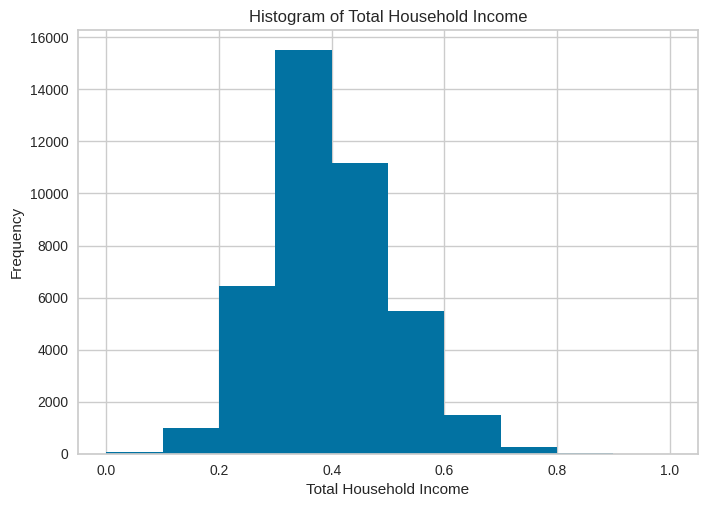

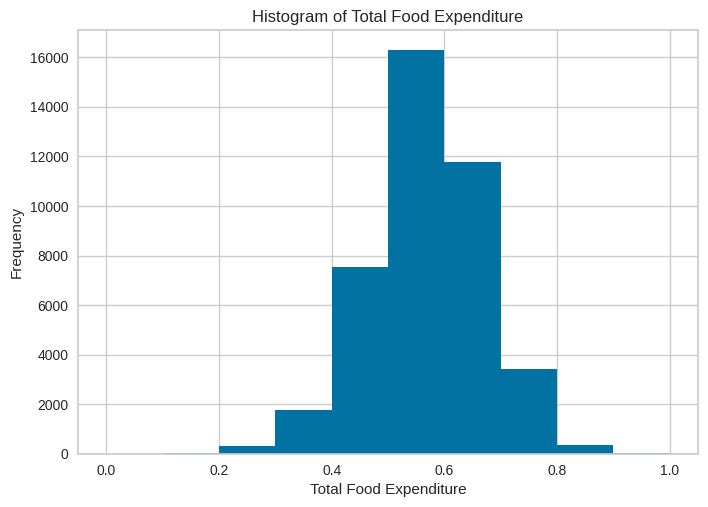

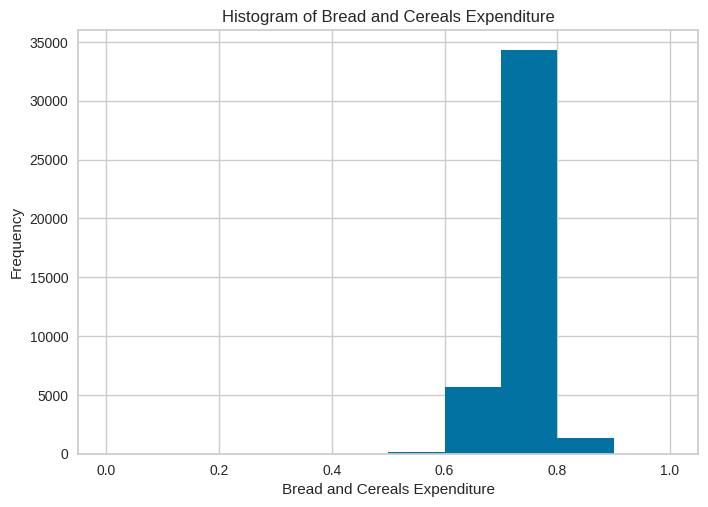

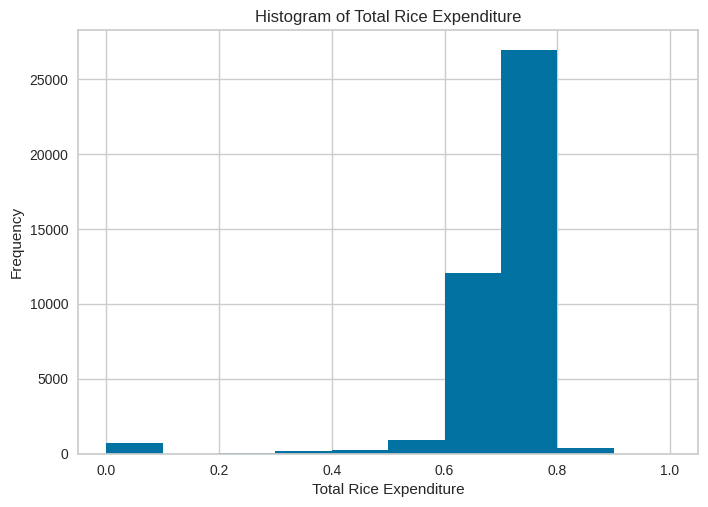

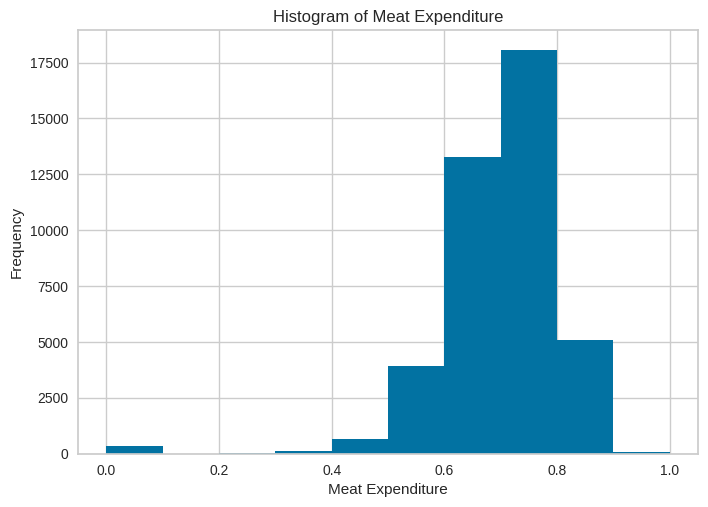

...

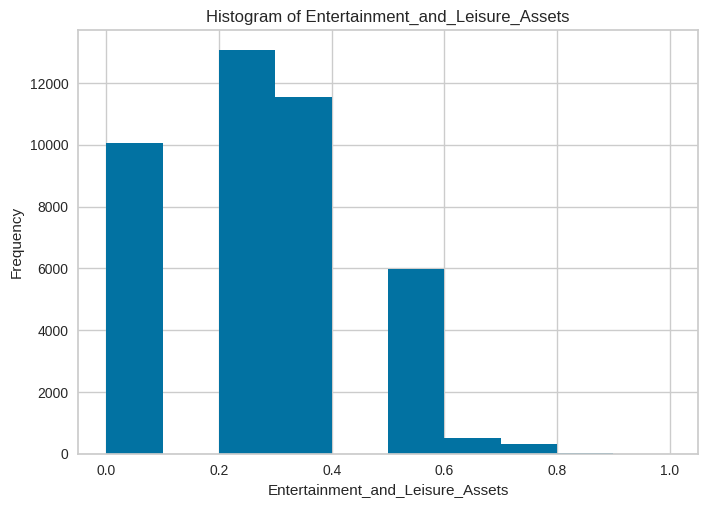

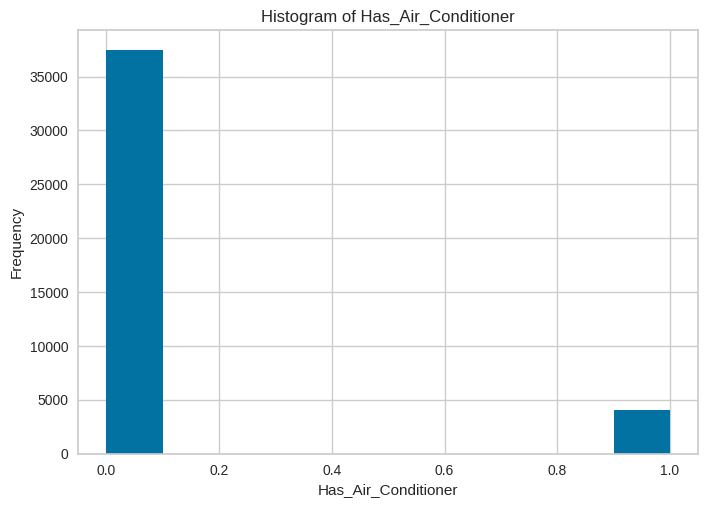

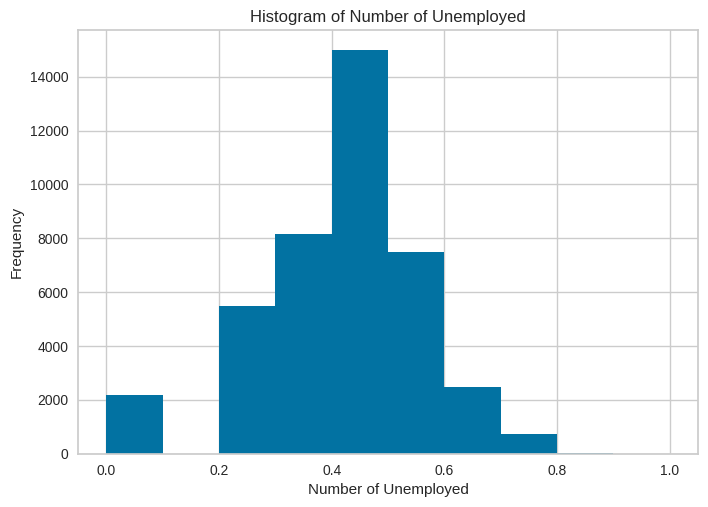

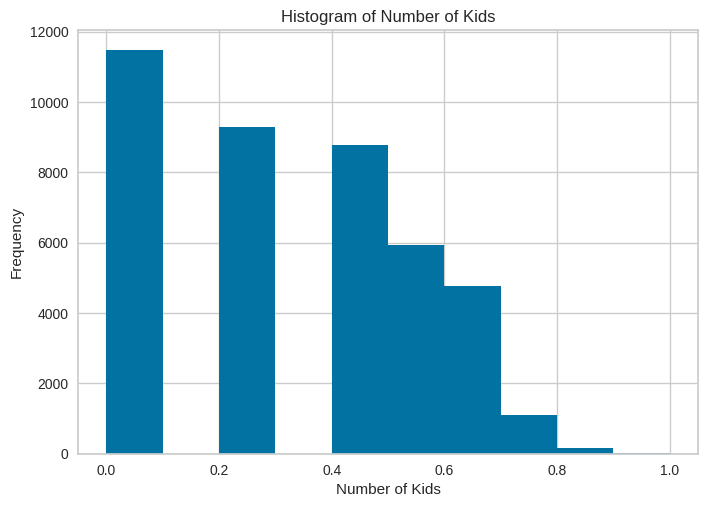

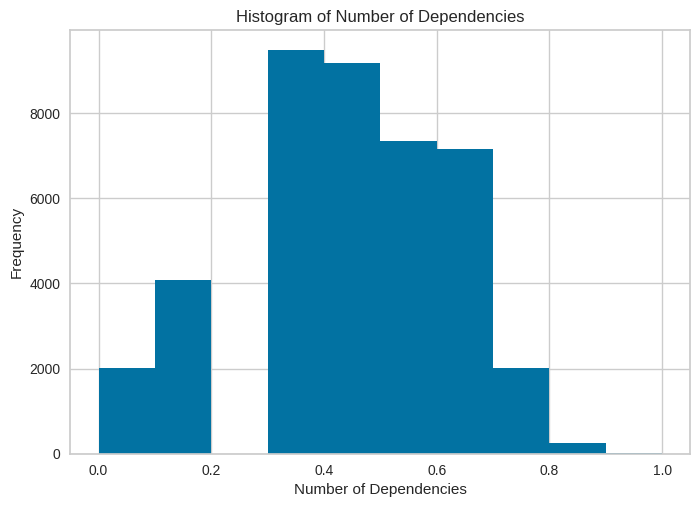

In [1748]:
# Histogram for all Numerical Columns, individually
for col in numerical_columns:
    plt.hist(df_orig[col])
    plt.title(f'Histogram of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

In [1749]:
df_orig.head()

,Total Household Income,Region,Total Food Expenditure,Agricultural Household indicator,Bread and Cereals Expenditure,Total Rice Expenditure,Meat Expenditure,Total Fish and marine products Expenditure,Fruit Expenditure,Vegetables Expenditure,...,Has_Air_Conditioner,Number of Unemployed,Number of Kids,Number of Dependencies,Main Source of Income_Other sources of Income,Main Source of Income_Wage/Salaries,Household Head Sex_Male,Household Head Job or Business Indicator_With Job/Business,Type of Household_Single Family,Type of Household_Two or More Nonrelated Persons/Members
0,0.539417,1,0.654256,0,0.785959,0.779477,0.810748,0.801095,0.647723,0.847180,...,0.0,0.425492,0.262650,0.445714,False,True,False,True,False,False
1,0.412143,1,0.556102,0,0.720375,0.699718,0.782899,0.766745,0.608524,0.798945,...,0.0,0.212746,0.262650,0.304247,False,True,True,True,True,False
2,0.286569,1,0.539206,1,0.770512,0.766205,0.718254,0.647147,0.595561,0.734385,...,0.0,0.425492,0.609853,0.575876,False,True,True,True,True,False
3,0.324256,1,0.581480,0,0.770183,0.758059,0.745355,0.764781,0.522214,0.799557,...,0.0,0.212746,0.525299,0.445714,False,True,True,True,True,False
4,0.405527,1,0.615324,0,0.771877,0.761846,0.787183,0.768481,0.578382,0.831279,...,0.0,0.337195,0.000000,0.304247,False,True,True,True,True,False


In [1750]:
df_orig.isna().sum()

,0
Total Household Income,0
Region,0
Total Food Expenditure,0
Agricultural Household indicator,0
Bread and Cereals Expenditure,0
...,...
Main Source of Income_Wage/Salaries,0
Household Head Sex_Male,0
Household Head Job or Business Indicator_With Job/Business,0
Type of Household_Single Family,0


In [1751]:
df_orig.duplicated().sum()

0

In [1752]:
df_orig.info()

<class 'pandas.core.frame.DataFrame'>
Index: 41515 entries, 0 to 41543
Data columns (total 78 columns):
 #   Column                                                      Non-Null Count  Dtype  
---  ------                                                      --------------  -----  
 0   Total Household Income                                      41515 non-null  float64
 1   Region                                                      41515 non-null  int64  
 2   Total Food Expenditure                                      41515 non-null  float64
 3   Agricultural Household indicator                            41515 non-null  int64  
 4   Bread and Cereals Expenditure                               41515 non-null  float64
 5   Total Rice Expenditure                                      41515 non-null  float64
 6   Meat Expenditure                                            41515 non-null  float64
 7   Total Fish and  marine products Expenditure                 41515 non-null  float64
 8   F

# Feature Selection

Original Expenditure Columns = 20

Original Income Columns = 2

In [1753]:
X = df_orig.drop('Total Expenditure', axis=1)
y = df_orig['Total Expenditure']

In [1754]:
# Use Regression Model for Feature Selection
from sklearn.linear_model import Ridge
from sklearn.feature_selection import RFECV
from sklearn.model_selection import KFold # Changed from StratifiedKFold to KFold

min_features_to_select = 37  # Minimum number of features to consider
clf = Ridge()
cv = KFold(5) # Changed to KFold which is suitable for regression

rfecv = RFECV(
    estimator=clf,
    step=1,
    cv=cv,
    scoring="neg_mean_squared_error", # Changed scoring metric to a suitable one for Regression
    min_features_to_select=min_features_to_select,
    n_jobs=2,
)
rfecv.fit(X, y)

print(f"Optimal number of features: {rfecv.n_features_}")

Optimal number of features: 37


In [1755]:
# Check which features were selected
selected_exp_features = X.columns[rfecv.support_]
print(selected_exp_features)

Index(['Total Household Income', 'Total Food Expenditure',
       'Bread and Cereals Expenditure', 'Meat Expenditure',
       'Fruit Expenditure', 'Vegetables Expenditure',
       'Restaurant and hotels Expenditure',
       'Clothing, Footwear and Other Wear Expenditure',
       'Housing and water Expenditure', 'Medical Care Expenditure',
       'Transportation Expenditure', 'Communication Expenditure',
       'Education Expenditure', 'Miscellaneous Goods and Services Expenditure',
       'Crop Farming and Gardening expenses', 'Total Number of Family members',
       'Members with age less than 5 year old',
       'Members with age 5 - 17 years old', 'Number of Television',
       'Number of CD/VCD/DVD', 'Number of Component/Stereo set',
       'Number of Refrigerator/Freezer', 'Number of Washing Machine',
       'Number of Airconditioner', 'Number of Car, Jeep, Van',
       'Number of Stove with Oven/Gas Range',
       'Other Bread and Cereals Expenditure',
       'Unaccounted Housing

In [1756]:
X = df_orig.drop('Total Household Income', axis=1)
y = df_orig['Total Household Income']

In [1757]:
# Use Regression Model for Feature Selection
from sklearn.linear_model import Ridge
from sklearn.feature_selection import RFECV
from sklearn.model_selection import KFold # Changed from StratifiedKFold to KFold

min_features_to_select = 22  # Minimum number of features to consider
clf = Ridge()
cv = KFold(5) # Changed to KFold which is suitable for regression

rfecv = RFECV(
    estimator=clf,
    step=1,
    cv=cv,
    scoring="neg_mean_squared_error", # Changed scoring metric to a suitable one for Regression
    min_features_to_select=min_features_to_select,
    n_jobs=2,
)
rfecv.fit(X, y)

print(f"Optimal number of features: {rfecv.n_features_}")

Optimal number of features: 65


In [1758]:
# Check which features were selected
selected_inc_features = X.columns[rfecv.support_]
print(selected_inc_features)

Index(['Total Food Expenditure', 'Agricultural Household indicator',
       'Bread and Cereals Expenditure', 'Total Rice Expenditure',
       'Meat Expenditure', 'Total Fish and  marine products Expenditure',
       'Fruit Expenditure', 'Vegetables Expenditure',
       'Restaurant and hotels Expenditure', 'Alcoholic Beverages Expenditure',
       'Tobacco Expenditure', 'Clothing, Footwear and Other Wear Expenditure',
       'Housing and water Expenditure', 'Imputed House Rental Value',
       'Medical Care Expenditure', 'Transportation Expenditure',
       'Communication Expenditure', 'Education Expenditure',
       'Miscellaneous Goods and Services Expenditure',
       'Special Occasions Expenditure', 'Crop Farming and Gardening expenses',
       'Total Income from Entrepreneurial Acitivites', 'Household Head Age',
       'Household Head Highest Grade Completed',
       'Total Number of Family members',
       'Members with age less than 5 year old',
       'Members with age 5 - 17 ye

In [1759]:
X = df_orig.drop('Region', axis=1)
y = df_orig['Region']

In [1760]:
from sklearn.feature_selection import RFECV
from sklearn.linear_model import RidgeClassifier
from sklearn.model_selection import StratifiedKFold

min_features_to_select = 5  # Minimum number of features to consider
clf = RidgeClassifier()
cv = StratifiedKFold(5)

rfecv = RFECV(
    estimator=clf,
    step=1,
    cv=cv,
    scoring="accuracy",
    min_features_to_select=min_features_to_select,
    n_jobs=2,
)
rfecv.fit(X, y)

print(f"Optimal number of features: {rfecv.n_features_}")

Optimal number of features: 77


In [1761]:
# Print number of optimal features
selected_region_features = X.columns[rfecv.support_]
print(selected_region_features)

Index(['Total Household Income', 'Total Food Expenditure',
       'Agricultural Household indicator', 'Bread and Cereals Expenditure',
       'Total Rice Expenditure', 'Meat Expenditure',
       'Total Fish and  marine products Expenditure', 'Fruit Expenditure',
       'Vegetables Expenditure', 'Restaurant and hotels Expenditure',
       'Alcoholic Beverages Expenditure', 'Tobacco Expenditure',
       'Clothing, Footwear and Other Wear Expenditure',
       'Housing and water Expenditure', 'Imputed House Rental Value',
       'Medical Care Expenditure', 'Transportation Expenditure',
       'Communication Expenditure', 'Education Expenditure',
       'Miscellaneous Goods and Services Expenditure',
       'Special Occasions Expenditure', 'Crop Farming and Gardening expenses',
       'Total Income from Entrepreneurial Acitivites', 'Household Head Age',
       'Household Head Marital Status',
       'Household Head Highest Grade Completed', 'Household Head Occupation',
       'Household Hea

In [1762]:
# Union all rfevc features
selected_features = np.union1d(selected_exp_features, selected_inc_features)
selected_features = np.union1d(selected_features, selected_region_features)
print(selected_features)

['Agricultural Household indicator' 'Alcoholic Beverages Expenditure'
 'Amount_Outside_Income' 'Bread and Cereals Expenditure'
 'Clothing, Footwear and Other Wear Expenditure'
 'Communication Expenditure' 'Communication_and_Connectivity_Assets'
 'Crop Farming and Gardening expenses' 'Education Expenditure'
 'Electricity' 'Entertainment_and_Leisure_Assets'
 'Essential_Household_Assets' 'Fruit Expenditure' 'Has_Air_Conditioner'
 'House Age' 'House Floor Area' 'Household Head Age'
 'Household Head Class of Worker' 'Household Head Highest Grade Completed'
 'Household Head Job or Business Indicator_With Job/Business'
 'Household Head Marital Status' 'Household Head Occupation'
 'Household Head Sex_Male' 'Housing and water Expenditure'
 'Imputed House Rental Value'
 'Main Source of Income_Other sources of Income'
 'Main Source of Income_Wage/Salaries' 'Main Source of Water Supply'
 'Meat Expenditure' 'Medical Care Expenditure'
 'Members with age 5 - 17 years old'
 'Members with age less than

In [1763]:
len(selected_features)

77

In [1796]:
# Set selected features to df_orig_feature
df_orig_feature = df_orig[selected_features]

In [1765]:
df_list = [df_orig, df_orig_feature, df_orig_pca, df_orig_feature_pca, df_non_outlier, df_non_outlier_feature, df_non_outlier_pca, df_non_outlier_feature_pca]

# Model Training

For cluster = 1, SSE/WCSS is 3985495.476567576
For cluster = 2, SSE/WCSS is 1877368.4010433194
For cluster = 3, SSE/WCSS is 1475084.2873984396
For cluster = 4, SSE/WCSS is 1207726.5591692624
For cluster = 5, SSE/WCSS is 1089221.1159596972
For cluster = 6, SSE/WCSS is 1027373.5033700537
For cluster = 7, SSE/WCSS is 970449.2588407515
For cluster = 8, SSE/WCSS is 924819.9653884138
For cluster = 9, SSE/WCSS is 889719.7861128537
For cluster = 10, SSE/WCSS is 863211.21436628


Text(0, 0.5, 'WCSS')

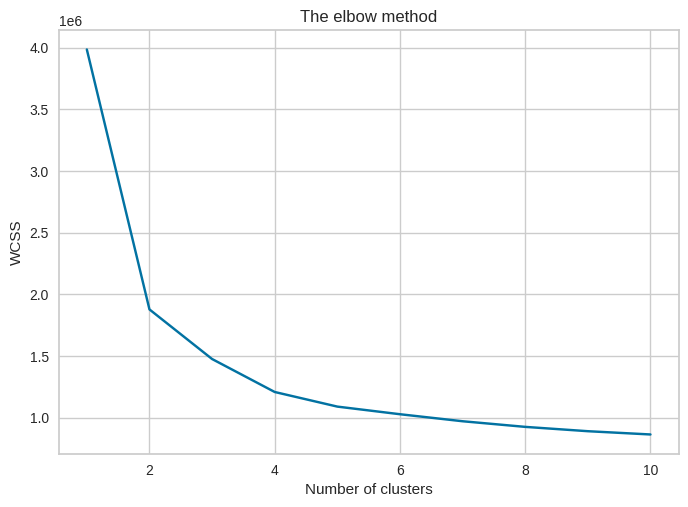

In [1274]:
# Use Elbow Method to find optimal KMeans
from sklearn.cluster import KMeans

wcss=[]
sse = {}
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300,
                    n_init = 10, random_state = 0)
    kmeans.fit(df_orig)
    wcss.append(kmeans.inertia_)
    sse[i] = kmeans.inertia_
    print("For cluster = {}, SSE/WCSS is {}".format(i, sse[i]))

plt.plot(range(1, 11), wcss)
plt.title('The elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')

For cluster = 1, SSE/WCSS is 3090336.033089352
For cluster = 2, SSE/WCSS is 982737.892908474
For cluster = 3, SSE/WCSS is 808376.9570153331
For cluster = 4, SSE/WCSS is 744906.746866974
For cluster = 5, SSE/WCSS is 698970.4325340376
For cluster = 6, SSE/WCSS is 656796.7142494126
For cluster = 7, SSE/WCSS is 624587.3219960048
For cluster = 8, SSE/WCSS is 600332.1919533743
For cluster = 9, SSE/WCSS is 573632.1724272673
For cluster = 10, SSE/WCSS is 558420.6388810656


Text(0, 0.5, 'WCSS')

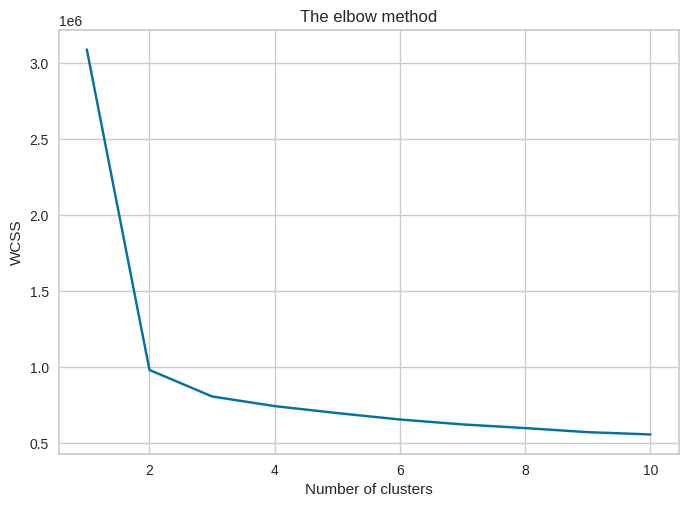

In [1766]:
# Use Elbow Method to find optimal KMeans
from sklearn.cluster import KMeans

wcss=[]
sse = {}
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300,
                    n_init = 10, random_state = 0)
    kmeans.fit(df_orig_feature)
    wcss.append(kmeans.inertia_)
    sse[i] = kmeans.inertia_
    print("For cluster = {}, SSE/WCSS is {}".format(i, sse[i]))

plt.plot(range(1, 11), wcss)
plt.title('The elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')

In [1277]:
from sklearn.metrics import silhouette_score
wcss = []

for k in range(2, 10):
  kmeans = KMeans(n_clusters= k,max_iter=100).fit(df_orig)
  label = kmeans.labels_
  sil_coeff = silhouette_score(df_orig,label,metric = 'euclidean')
  print('For cluster= {}, Silhouette Coefficient is {}'.format(k,sil_coeff))

For cluster= 2, Silhouette Coefficient is 0.45285427966906333
For cluster= 3, Silhouette Coefficient is 0.3754186633524503
For cluster= 4, Silhouette Coefficient is 0.2917856498217488
For cluster= 5, Silhouette Coefficient is 0.2950455297664551
For cluster= 6, Silhouette Coefficient is 0.2327529646216802
For cluster= 7, Silhouette Coefficient is 0.20846490819338112
For cluster= 8, Silhouette Coefficient is 0.1720160216690163
For cluster= 9, Silhouette Coefficient is 0.17047438422005215


In [1768]:
from sklearn.metrics import silhouette_score
wcss = []

for k in range(2, 10):
  kmeans = KMeans(n_clusters= k,max_iter=100).fit(df_orig_feature)
  label = kmeans.labels_
  sil_coeff = silhouette_score(df_orig_feature,label,metric = 'euclidean')
  print('For cluster= {}, Silhouette Coefficient is {}'.format(k,sil_coeff))

For cluster= 2, Silhouette Coefficient is 0.5601944136854075
For cluster= 3, Silhouette Coefficient is 0.38844447573549934
For cluster= 4, Silhouette Coefficient is 0.2920355339493995
For cluster= 5, Silhouette Coefficient is 0.17291646367355568
For cluster= 6, Silhouette Coefficient is 0.16358762340476837
For cluster= 7, Silhouette Coefficient is 0.17549347086588474
For cluster= 8, Silhouette Coefficient is 0.1657518907407741
For cluster= 9, Silhouette Coefficient is 0.15537943194215814


In [1769]:
from sklearn.metrics import silhouette_samples
import matplotlib.cm as cm

def visualize_silhouette(cluster_lists, X_features):

    n_cols = len(cluster_lists)
    fig, axs = plt.subplots(figsize=(4*n_cols, 4), nrows=1, ncols=n_cols)

    for ind, n_cluster in enumerate(cluster_lists):
        clusterer = KMeans(n_clusters = n_cluster, max_iter=500, random_state=0, init = 'k-means++')
        cluster_labels = clusterer.fit_predict(X_features)

        sil_avg = silhouette_score(X_features, cluster_labels)
        sil_values = silhouette_samples(X_features, cluster_labels)

        y_lower = 10
        axs[ind].set_title('Number of Cluster : '+ str(n_cluster)+'\n' \
                          'Silhouette Score :' + str(round(sil_avg,3)) )
        axs[ind].set_xlabel("The silhouette coefficient values")
        axs[ind].set_ylabel("Cluster label")
        axs[ind].set_xlim([-0.1, 1])
        axs[ind].set_ylim([0, len(X_features) + (n_cluster + 1) * 10])
        axs[ind].set_yticks([])  # Clear the yaxis labels / ticks
        axs[ind].set_xticks([0, 0.2, 0.4, 0.6, 0.8, 1])

        for i in range(n_cluster):
            ith_cluster_sil_values = sil_values[cluster_labels==i]
            ith_cluster_sil_values.sort()

            size_cluster_i = ith_cluster_sil_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_cluster)
            axs[ind].fill_betweenx(np.arange(y_lower, y_upper), 0, ith_cluster_sil_values, \
                                facecolor=color, edgecolor=color, alpha=0.7)
            axs[ind].text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
            y_lower = y_upper + 10

        axs[ind].axvline(x=sil_avg, color="red", linestyle="--")

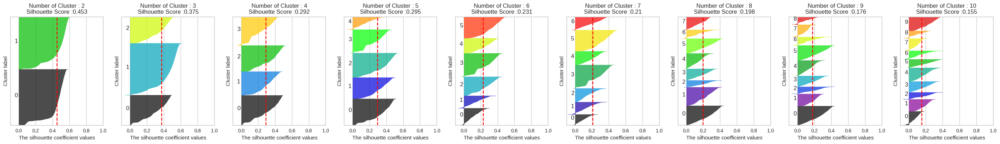

In [1279]:
visualize_silhouette([2, 3, 4, 5, 6, 7, 8, 9, 10], df_orig)

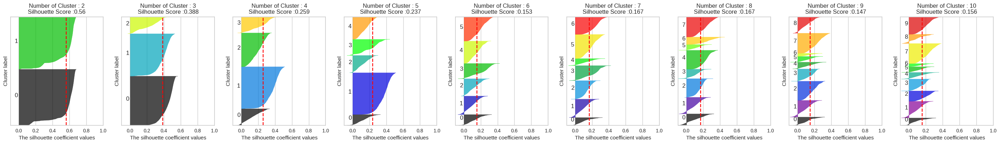

In [1770]:
visualize_silhouette([2, 3, 4, 5, 6, 7, 8, 9, 10], df_orig_feature)

In [1797]:
# Perform PCA
from sklearn.decomposition import PCA

pca = PCA(n_components=10)
df_orig_pca = pca.fit_transform(df_orig)

In [1798]:
cumsum = np.cumsum(pca.explained_variance_ratio_)
print(cumsum)
d = np.argmax(cumsum >= 0.90) + 1
print("dimension : ", d)

[0.58806212 0.81365427 0.85967249 0.88597838 0.91029118 0.92757474
 0.94115764 0.95343201 0.96156786 0.96715307]
dimension :  5


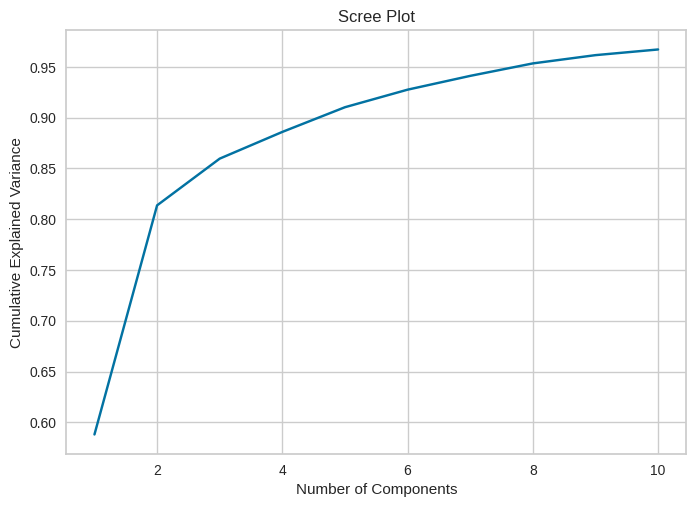

In [1799]:
# Display the Scree Plot and label where it hits 0.9 cumulative explained variance ratio
explained_variance = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance)
plt.plot(range(1, len(explained_variance) + 1), cumulative_variance)
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Scree Plot')
plt.show()

In [1800]:
# Analyze feature contributions to principal components
print("\nTop feature contributions to principal components:")
# Change component_names to reflect the number of components
component_names = [f"PC{i+1}" for i in range(pca.n_components_)]
# Now component_names will have 15 column names (PC1 to PC15)
loadings = pd.DataFrame(pca.components_.T, columns=component_names, index=df_orig.columns)


Top feature contributions to principal components:


In [1801]:
for i, pc in enumerate(component_names):
    sorted_loadings = loadings[pc].abs().sort_values(ascending=False)
    print(f"\n{pc} explains {pca.explained_variance_ratio_[i]:.2%} of variance")
    print(f"Top contributing features:")
    for j, (feature, loading) in enumerate(sorted_loadings.head(5).items()):
        sign = '+' if loadings.loc[feature, pc] > 0 else '-'
        print(f"  {j+1}. {feature}: {sign}{abs(loadings.loc[feature, pc]):.3f}")


PC1 explains 58.81% of variance
Top contributing features:
  1. Household Head Occupation: +0.995
  2. Household Head Highest Grade Completed: +0.055
  3. Main Source of Water Supply: +0.046
  4. Toilet Facilities: +0.033
  5. Household Head Marital Status: +0.031

PC2 explains 22.56% of variance
Top contributing features:
  1. Region: +0.997
  2. Main Source of Water Supply: +0.053
  3. Type of Walls: -0.031
  4. Household Head Class of Worker: +0.028
  5. Household Head Occupation: -0.023

PC3 explains 4.60% of variance
Top contributing features:
  1. Household Head Highest Grade Completed: +0.697
  2. Main Source of Water Supply: +0.547
  3. Toilet Facilities: +0.260
  4. Household Head Class of Worker: +0.194
  5. Type of Walls: +0.189

PC4 explains 2.63% of variance
Top contributing features:
  1. Main Source of Water Supply: +0.689
  2. Household Head Class of Worker: -0.468
  3. Household Head Highest Grade Completed: -0.400
  4. Tenure Status: +0.289
  5. Household Head Marita

In [1802]:
# Perform PCA
from sklearn.decomposition import PCA

pca = PCA(n_components=10)
df_orig_feature_pca = pca.fit_transform(df_orig_feature)

In [1803]:
cumsum = np.cumsum(pca.explained_variance_ratio_)
print(cumsum)
d = np.argmax(cumsum >= 0.90) + 1
print("dimension : ", d)

[0.75819902 0.81779887 0.8518339  0.88389808 0.90621588 0.92373615
 0.9395969  0.95034436 0.95755045 0.96328556]
dimension :  5


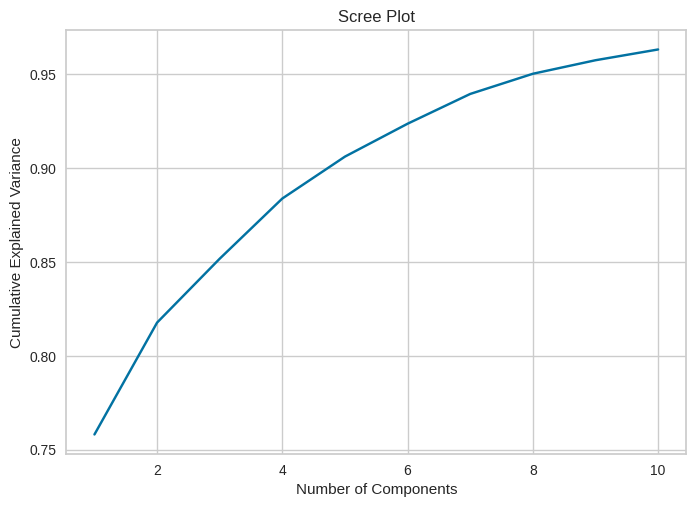

In [1804]:
# Display the Scree Plot and label where it hits 0.9 cumulative explained variance ratio
explained_variance = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance)
plt.plot(range(1, len(explained_variance) + 1), cumulative_variance)
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Scree Plot')
plt.show()

In [1805]:
# Analyze feature contributions to principal components
print("\nTop feature contributions to principal components:")
# Change component_names to reflect the number of components
component_names = [f"PC{i+1}" for i in range(pca.n_components_)]
# Now component_names will have 15 column names (PC1 to PC15)
loadings = pd.DataFrame(pca.components_.T, columns=component_names, index=df_orig_feature.columns)


Top feature contributions to principal components:


In [1806]:
for i, pc in enumerate(component_names):
    sorted_loadings = loadings[pc].abs().sort_values(ascending=False)
    print(f"\n{pc} explains {pca.explained_variance_ratio_[i]:.2%} of variance")
    print(f"Top contributing features:")
    for j, (feature, loading) in enumerate(sorted_loadings.head(5).items()):
        sign = '+' if loadings.loc[feature, pc] > 0 else '-'
        print(f"  {j+1}. {feature}: {sign}{abs(loadings.loc[feature, pc]):.3f}")


PC1 explains 75.82% of variance
Top contributing features:
  1. Household Head Occupation: +0.995
  2. Household Head Highest Grade Completed: +0.055
  3. Main Source of Water Supply: +0.046
  4. Toilet Facilities: +0.033
  5. Household Head Marital Status: +0.031

PC2 explains 5.96% of variance
Top contributing features:
  1. Household Head Highest Grade Completed: +0.689
  2. Main Source of Water Supply: +0.559
  3. Toilet Facilities: +0.261
  4. Household Head Class of Worker: +0.201
  5. Type of Walls: +0.182

PC3 explains 3.40% of variance
Top contributing features:
  1. Main Source of Water Supply: +0.729
  2. Household Head Highest Grade Completed: -0.457
  3. Household Head Class of Worker: -0.384
  4. Tenure Status: +0.241
  5. Household Head Marital Status: +0.171

PC4 explains 3.21% of variance
Top contributing features:
  1. Household Head Class of Worker: +0.722
  2. Household Head Highest Grade Completed: -0.415
  3. Tenure Status: -0.382
  4. Main Source of Water Supply

In [1808]:
pca = PCA(n_components=5)
df_orig_pca = pca.fit_transform(df_orig)

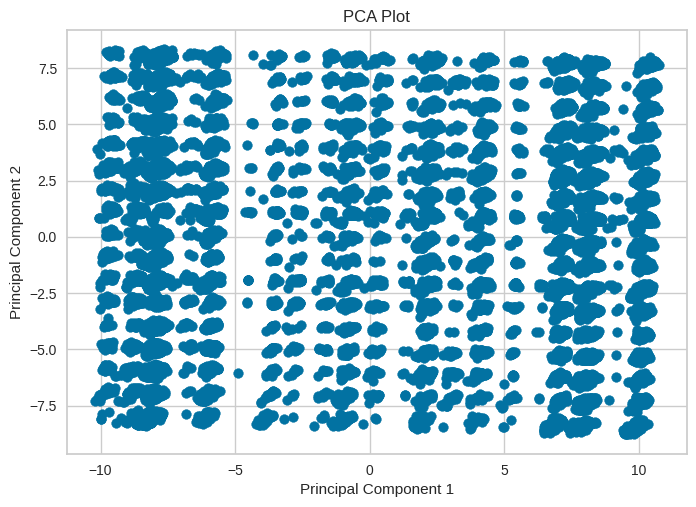

In [1809]:
# Plot PCA
plt.scatter(df_orig_pca[:, 0], df_orig_pca[:, 1])
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA Plot')
plt.show()

In [1810]:
# Print Loading Scores
print(pca.components_)

[[ 3.26903221e-03  2.08476811e-02  2.03070233e-03 -1.32807094e-02
  -2.26557977e-04  7.06101645e-04  2.00904784e-03  3.26573765e-05
   9.04201823e-04 -1.84801110e-04  5.40558405e-03 -4.08043854e-03
  -5.42413960e-03  1.17283706e-03  5.13070661e-03  1.28593567e-03
   3.82310493e-03  1.84782102e-03  5.68302096e-03 -6.22765417e-04
   2.05309302e-03  3.02904267e-03 -1.71258542e-02 -6.07154327e-03
   2.53610714e-03  3.09852156e-02  5.47444756e-02  9.94568092e-01
   3.16050723e-03 -1.96944387e-03 -1.74301115e-03 -4.42500553e-03
  -2.45370323e-03 -7.36163208e-03  7.57282714e-03  2.35656092e-02
   2.78267283e-03  2.97261571e-03  2.41974924e-03 -7.68033120e-03
   3.31586951e-02  8.23866709e-03  4.63342024e-02  5.30266933e-03
   3.43425428e-03  2.08546960e-03  6.01462951e-03  6.69746111e-03
   2.45327539e-03  1.31759809e-03  1.49961971e-03  4.98613841e-03
   4.19038632e-03  3.30873633e-03 -4.58045930e-04  6.35803490e-04
   5.09061862e-04  3.89873441e-03  1.71075358e-03  3.16470061e-03
   2.12074

In [1811]:
pca = PCA(n_components=5)
df_orig_feature_pca = pca.fit_transform(df_orig_feature)

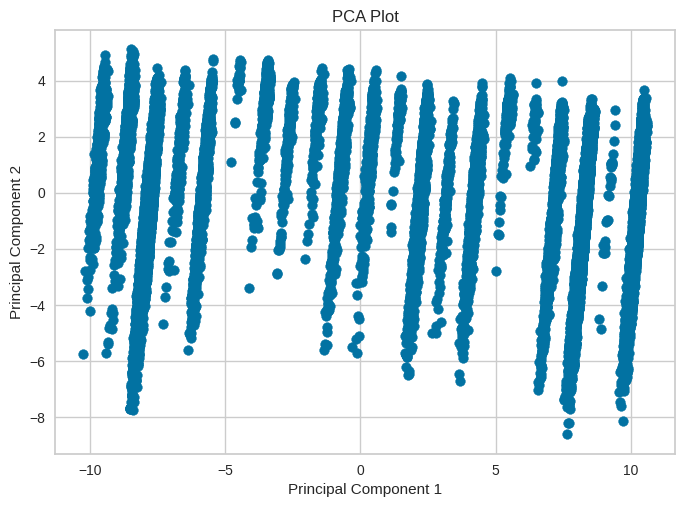

In [1812]:
# Plot PCA
plt.scatter(df_orig_feature_pca[:, 0], df_orig_feature_pca[:, 1])
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA Plot')
plt.show()

For cluster = 1, SSE/WCSS is 2800511.5913108108
For cluster = 2, SSE/WCSS is 692920.9709289871
For cluster = 3, SSE/WCSS is 518968.75909103215
For cluster = 4, SSE/WCSS is 457008.34674620815
For cluster = 5, SSE/WCSS is 412328.97042283555
For cluster = 6, SSE/WCSS is 370257.6770324489
For cluster = 7, SSE/WCSS is 338162.01239050785
For cluster = 8, SSE/WCSS is 314677.98803775443
For cluster = 9, SSE/WCSS is 288168.3452458335
For cluster = 10, SSE/WCSS is 267375.0953152689


Text(0, 0.5, 'WCSS')

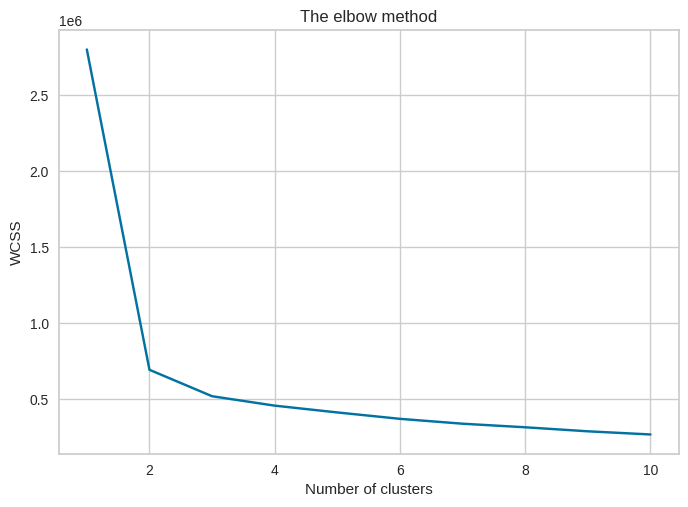

In [1814]:
# Use df_pca for K_Means
from sklearn.cluster import KMeans

wcss=[]
sse = {}
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300,
                    n_init = 10, random_state = 0)
    kmeans.fit(df_orig_feature_pca)
    wcss.append(kmeans.inertia_)
    sse[i] = kmeans.inertia_
    print("For cluster = {}, SSE/WCSS is {}".format(i, sse[i]))

plt.plot(range(1, 11), wcss)
plt.title('The elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')

In [1815]:
from sklearn.metrics import silhouette_score
wcss = []

for k in range(2, 10):
  kmeans = KMeans(n_clusters= k,max_iter=100).fit(df_orig_feature_pca)
  label = kmeans.labels_
  sil_coeff = silhouette_score(df_orig_feature_pca,label,metric = 'euclidean')
  print('For cluster= {}, Silhouette Coefficient is {}'.format(k,sil_coeff))

For cluster= 2, Silhouette Coefficient is 0.6285325990177041
For cluster= 3, Silhouette Coefficient is 0.48686453751174147
For cluster= 4, Silhouette Coefficient is 0.42174755014224596
For cluster= 5, Silhouette Coefficient is 0.30579811404471074
For cluster= 6, Silhouette Coefficient is 0.2725649116787732
For cluster= 7, Silhouette Coefficient is 0.26622191889554847
For cluster= 8, Silhouette Coefficient is 0.257083809457783
For cluster= 9, Silhouette Coefficient is 0.27310700997256315


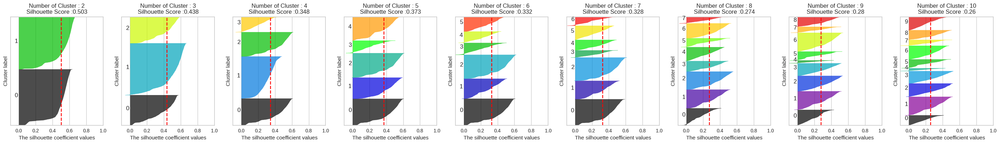

In [1297]:
visualize_silhouette([2, 3, 4, 5, 6, 7, 8, 9, 10], df_orig_pca)

In [1816]:
# Train Kmeans model with 4 Clusters using df_orig_pca
kmeans = KMeans(n_clusters=2, max_iter=100)
kmeans.fit(df_orig_feature_pca)

KMeans(max_iter=100, n_clusters=2)

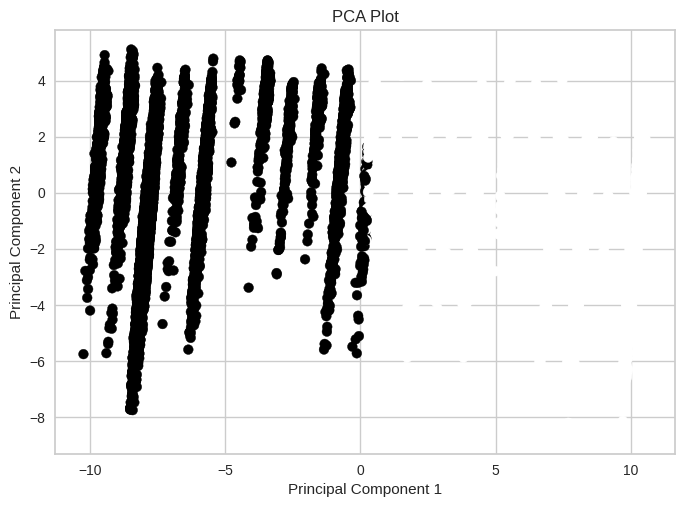

In [1818]:
# Plot PCA Model using Generated clusters
plt.scatter(df_orig_feature_pca[:, 0], df_orig_feature_pca[:, 1], c=kmeans.labels_)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA Plot')
plt.show()

# Profiling / Describing the Clusters

In [1819]:
# Fetch the K-means cluster labels
cluster_labels = kmeans.labels_

In [1820]:
# Locate indices from df_non_outliers and store created clusters
df['Cluster'] = cluster_labels

In [1821]:
# Profiling columns
expenditure_columns = ['Total Food Expenditure', 'Restaurant and hotels Expenditure',
                                'Housing and water Expenditure', 'Alcoholic Beverages Expenditure',
                                'Tobacco Expenditure', 'Clothing, Footwear and Other Wear Expenditure',
                                'Miscellaneous Goods and Services Expenditure', 'Special Occasions Expenditure', 'Medical Care Expenditure',
                                'Education Expenditure', 'Communication Expenditure', 'Transportation Expenditure', 'Crop Farming and Gardening expenses',
                                'Total_Essential_Spending', 'Total_NonEssential_Spending', 'Total Expenditure']

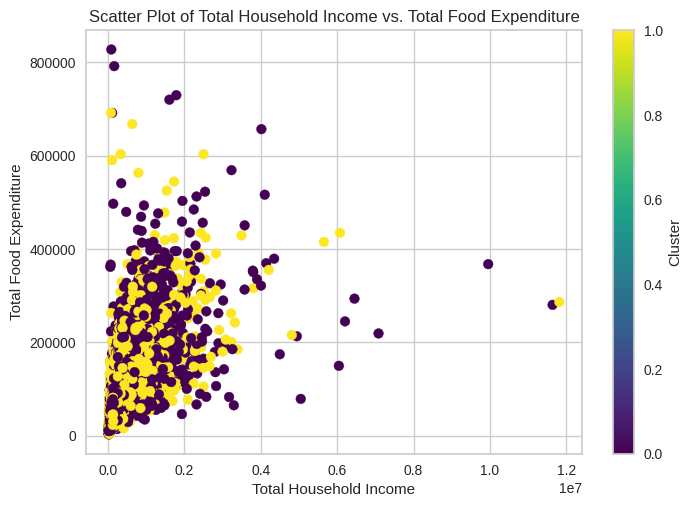

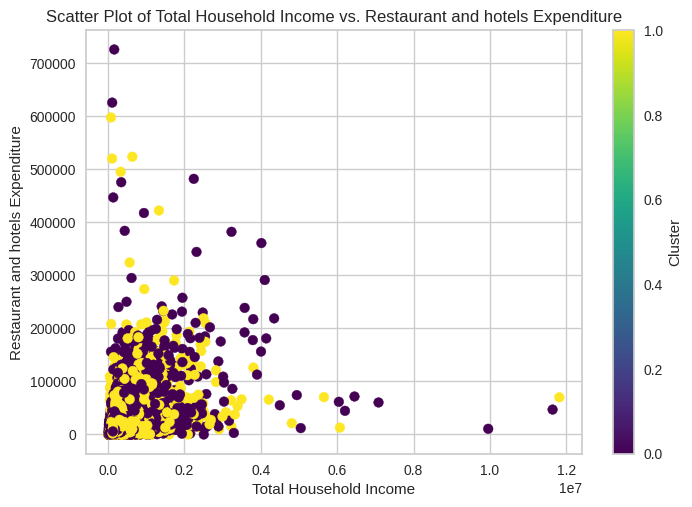

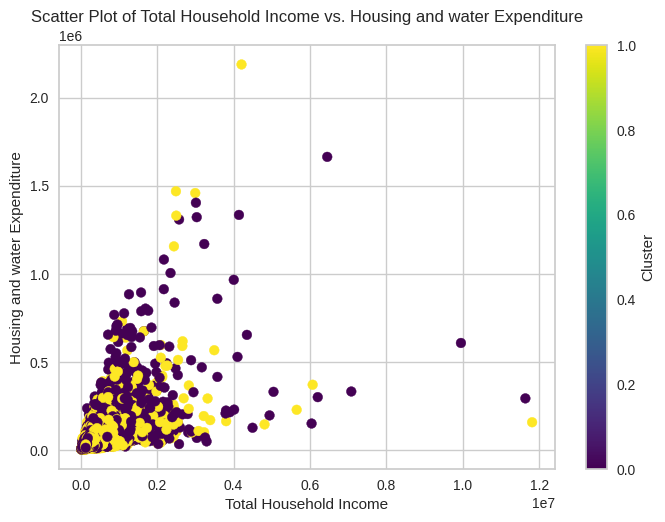

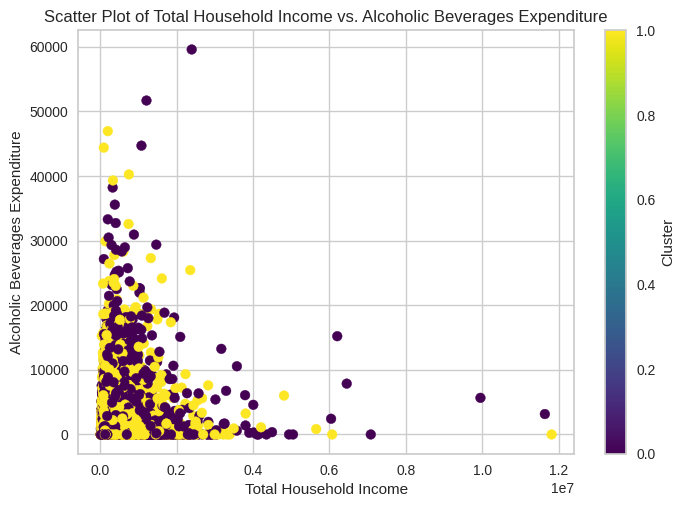

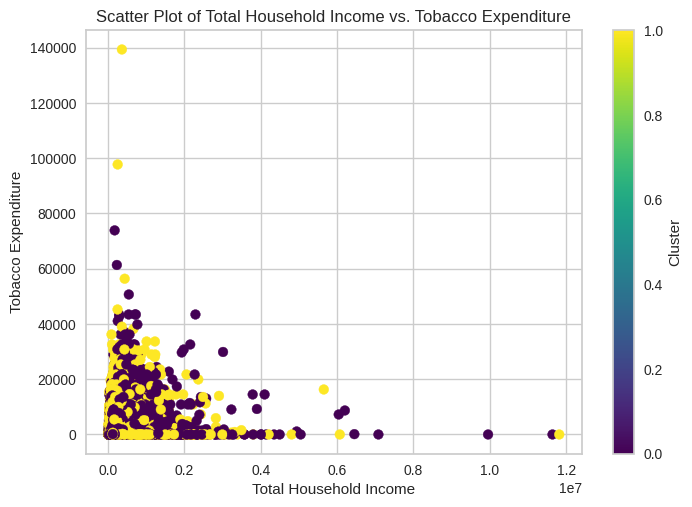

...

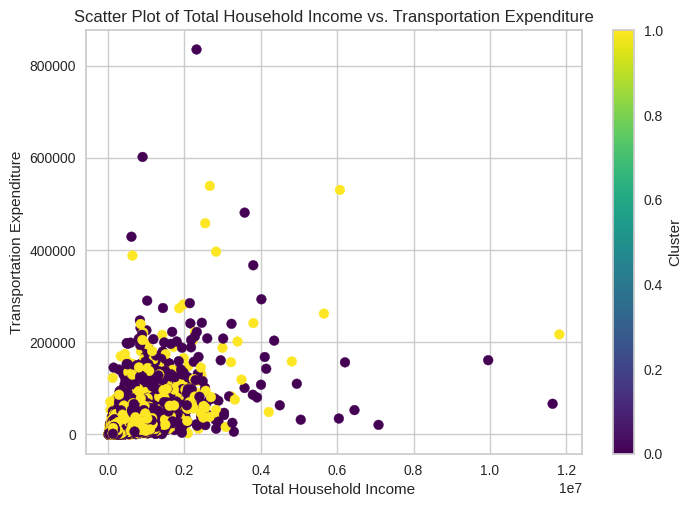

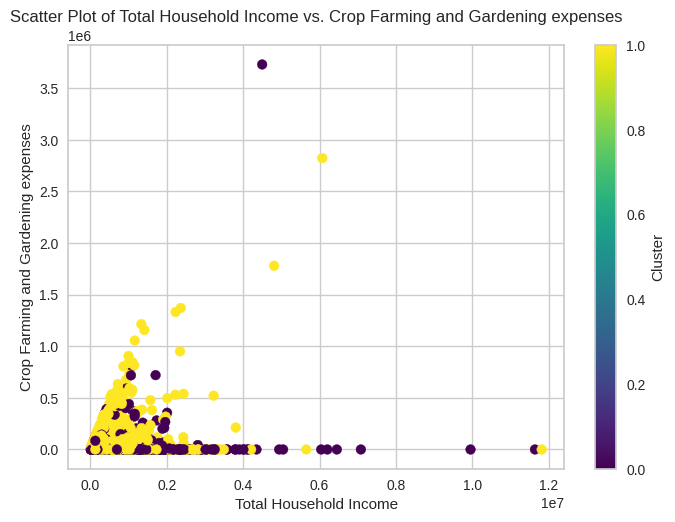

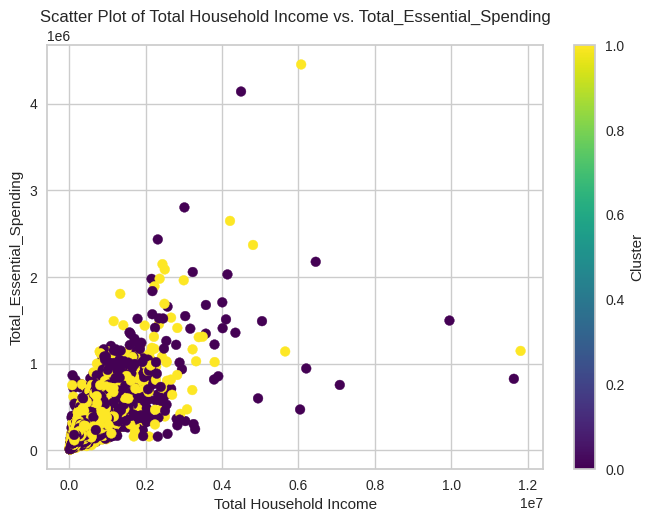

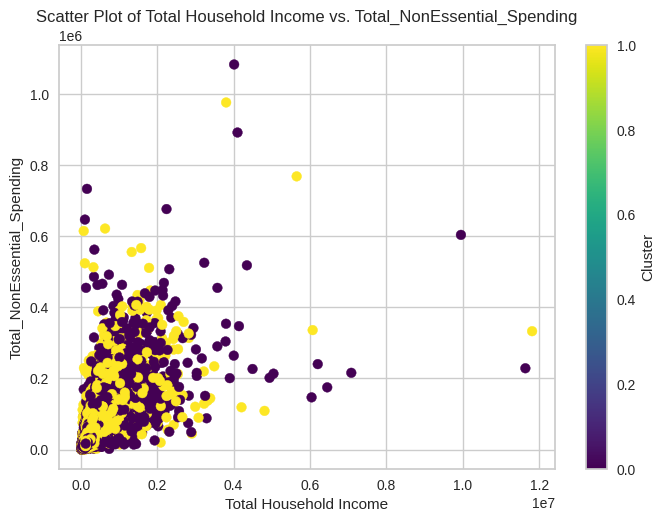

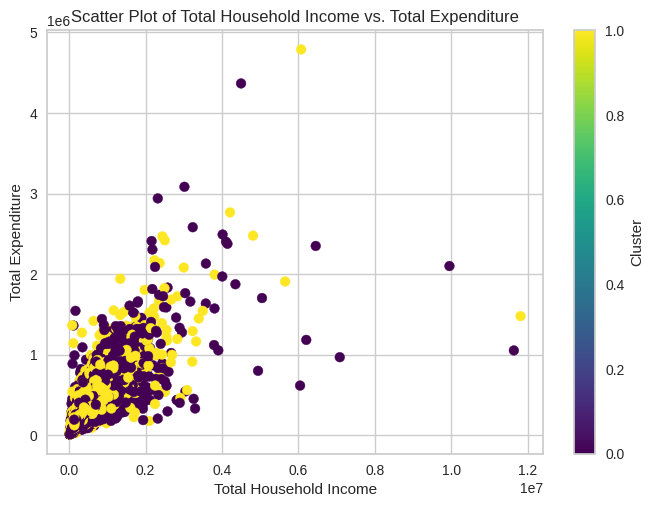

In [1822]:
# Scatter plot of Total Household Income versus each column in expenditure columns. Color code and label the dots based on 'Cluster' column
for column in expenditure_columns:
    plt.scatter(df['Total Household Income'], df[column], c=df['Cluster'], cmap='viridis')
    plt.xlabel('Total Household Income')
    plt.ylabel(column)
    plt.title(f'Scatter Plot of Total Household Income vs. {column}')
    plt.colorbar(label='Cluster')
    plt.show()

In [1823]:
# Display Mean values for each expenditure column, group by cluster
df.groupby('Cluster')[expenditure_columns].mean()

,Total Food Expenditure,Restaurant and hotels Expenditure,Housing and water Expenditure,Alcoholic Beverages Expenditure,Tobacco Expenditure,"Clothing, Footwear and Other Wear Expenditure",Miscellaneous Goods and Services Expenditure,Special Occasions Expenditure,Medical Care Expenditure,Education Expenditure,Communication Expenditure,Transportation Expenditure,Crop Farming and Gardening expenses,Total_Essential_Spending,Total_NonEssential_Spending,Total Expenditure
Cluster,,,,,,,,,,,,,,,,
0,92095.422353,18906.127639,47345.230869,1048.898817,2194.836220,5486.215295,14217.780662,5818.931563,9303.720561,8543.273449,5176.426696,13686.412719,3850.754355,180001.241002,47672.790196,227674.031199
1,78600.636998,12202.478354,30029.529932,1118.926543,2387.208547,4462.312029,10950.994042,4754.020296,5168.672796,6485.425100,3091.817987,10062.912485,23128.456289,156567.451587,35875.939810,192443.391397


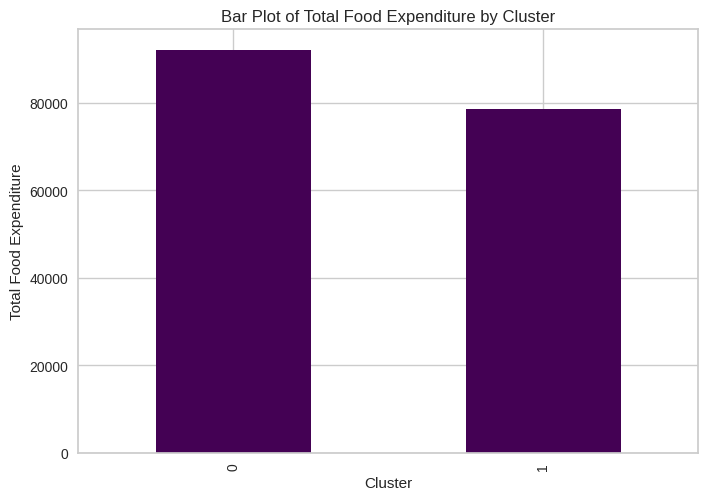

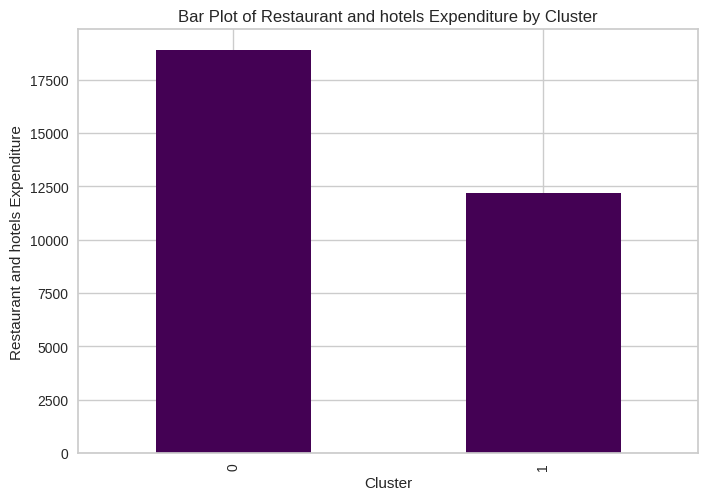

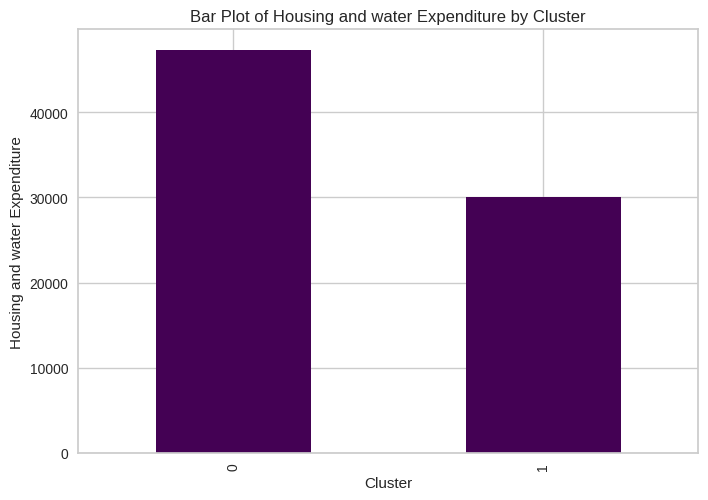

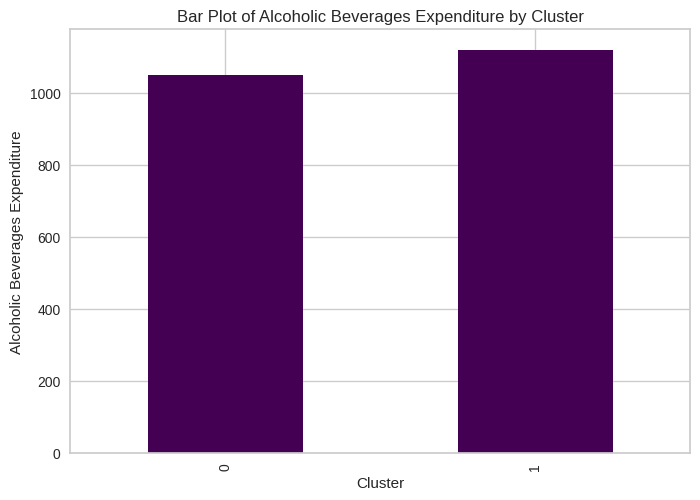

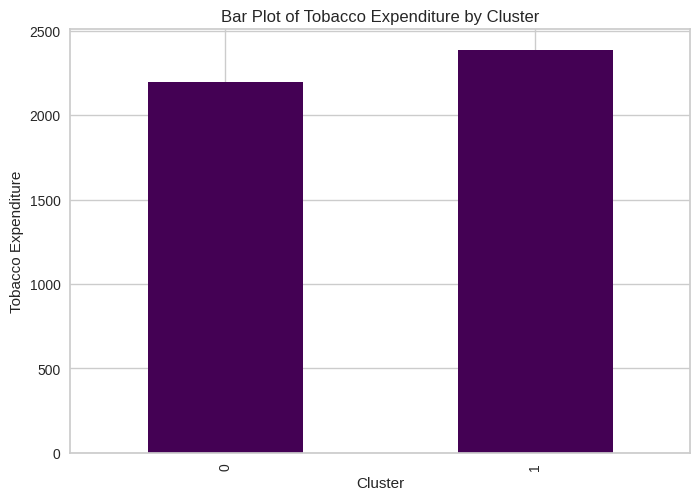

...

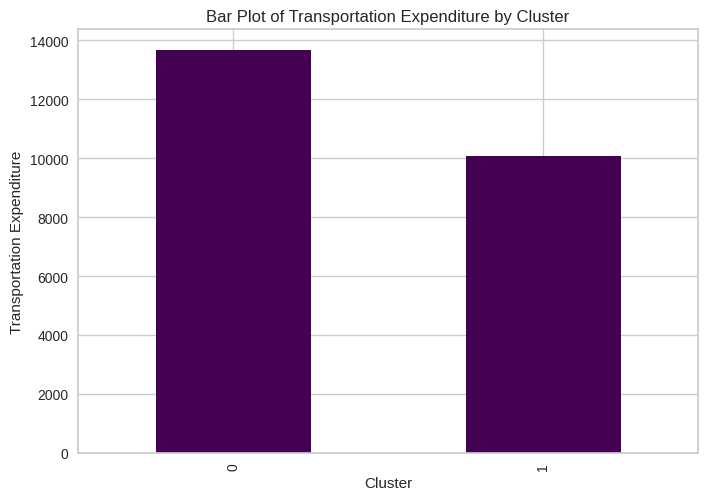

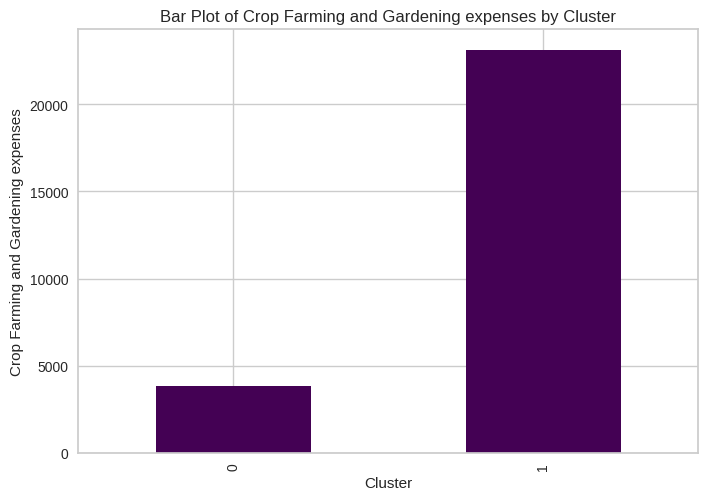

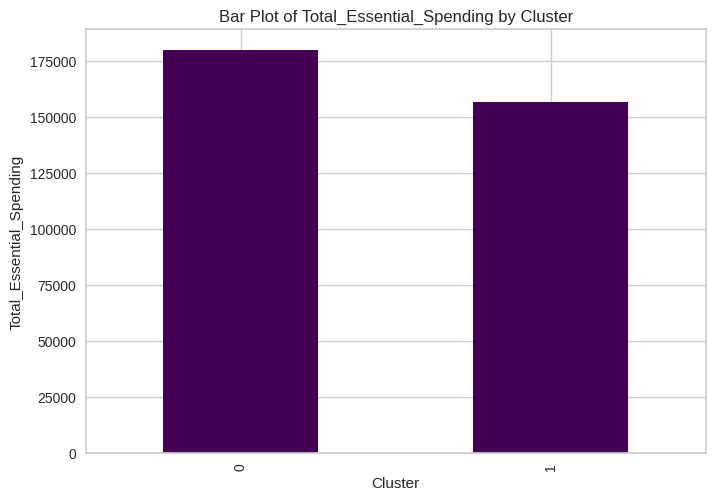

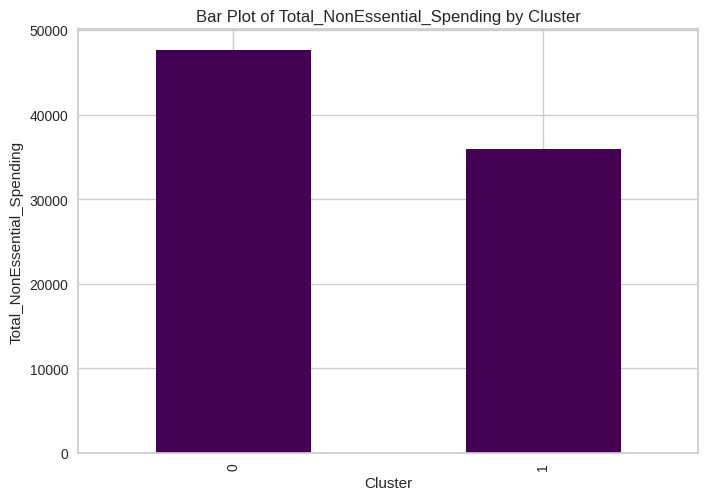

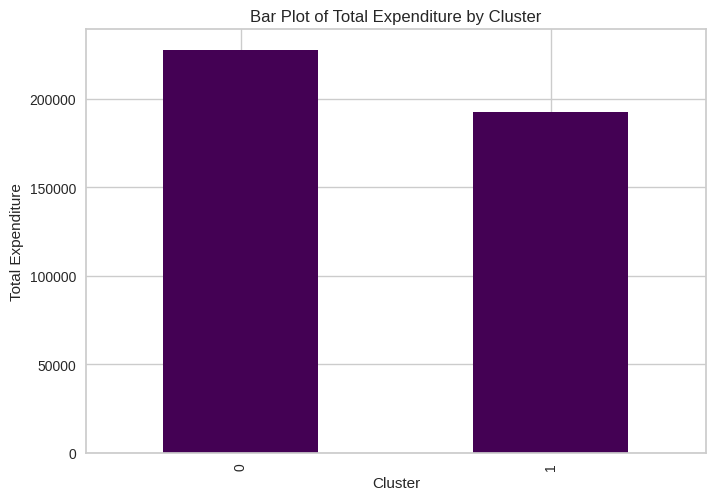

In [1824]:
# Bar Plot for Expenditure Columns, based on Cluster and color coded
for column in expenditure_columns:
    df.groupby('Cluster')[column].mean().plot(kind='bar', colormap='viridis')
    plt.xlabel('Cluster')
    plt.ylabel(column)
    plt.title(f'Bar Plot of {column} by Cluster')
    plt.show()

In [1825]:
# Display Mean values for each income column, group by cluster
df.groupby('Cluster')[income_columns].mean()

,Total Household Income,Total Income from Entrepreneurial Acitivites,Remaining_Income,Amount_Outside_Income
Cluster,,,,
0,282099.593571,56485.744422,64312.307942,9886.745570
1,215511.243273,52419.814030,41447.372219,18379.520343


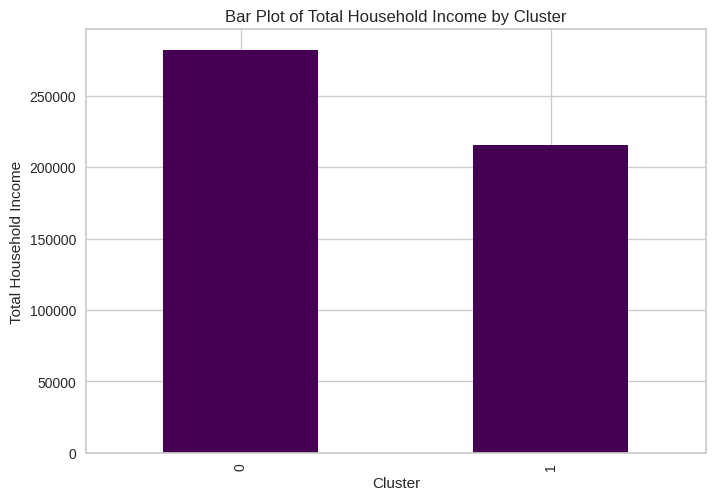

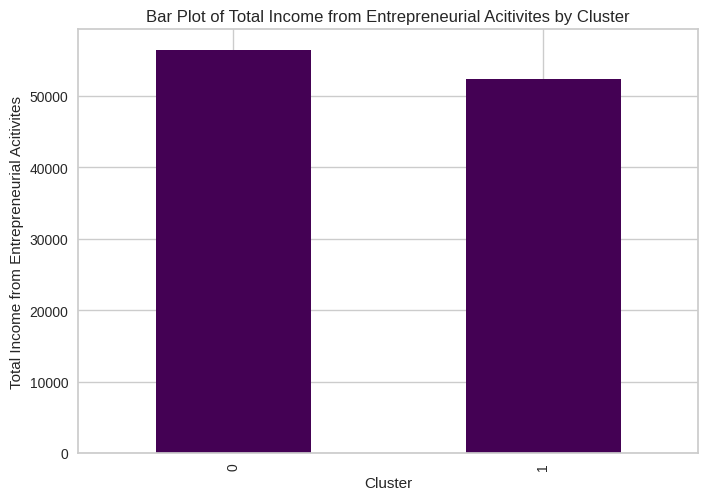

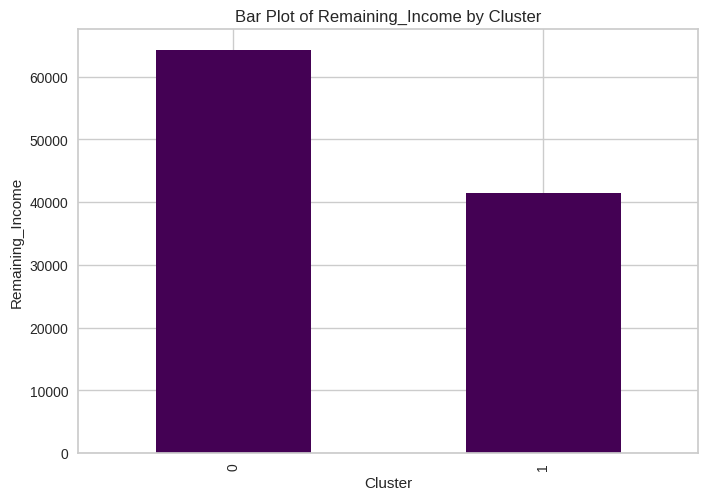

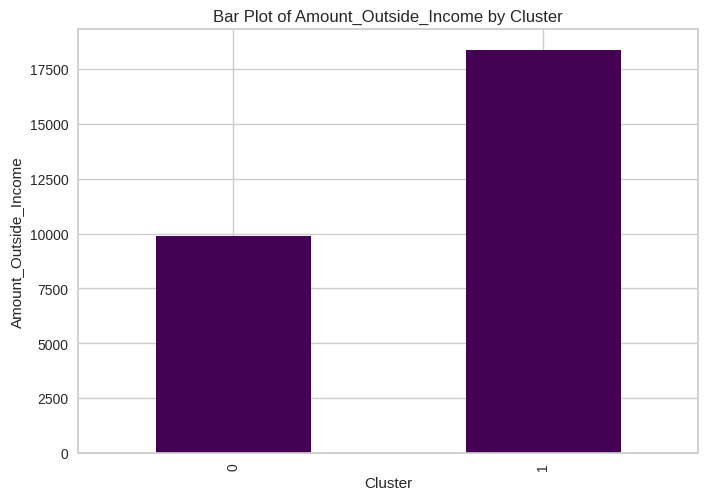

In [1826]:
# Bar Plot for Income Columns, based on Cluster and color coded
for column in income_columns:
    df.groupby('Cluster')[column].mean().plot(kind='bar', colormap='viridis')
    plt.xlabel('Cluster')
    plt.ylabel(column)
    plt.title(f'Bar Plot of {column} by Cluster')
    plt.show()

<Figure size 1400x800 with 0 Axes>

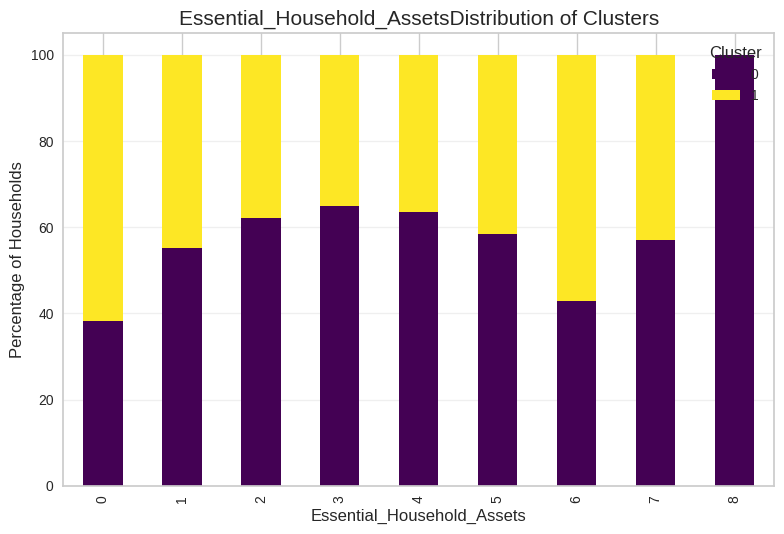

<Figure size 1400x800 with 0 Axes>

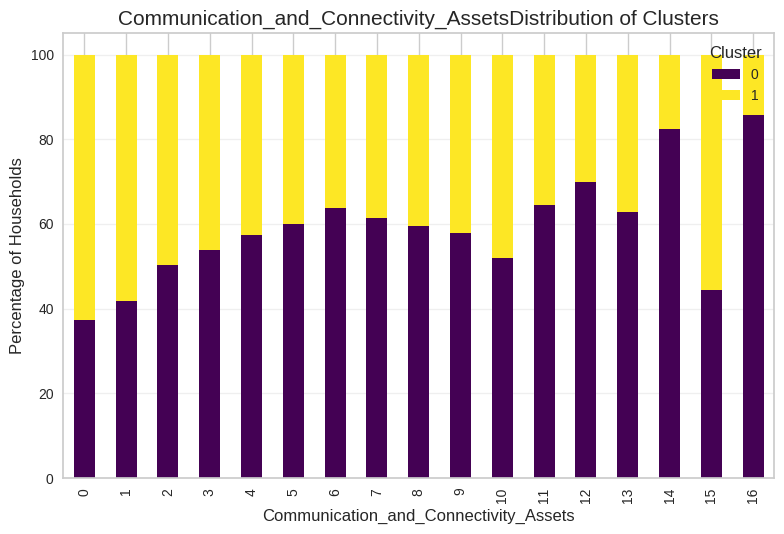

<Figure size 1400x800 with 0 Axes>

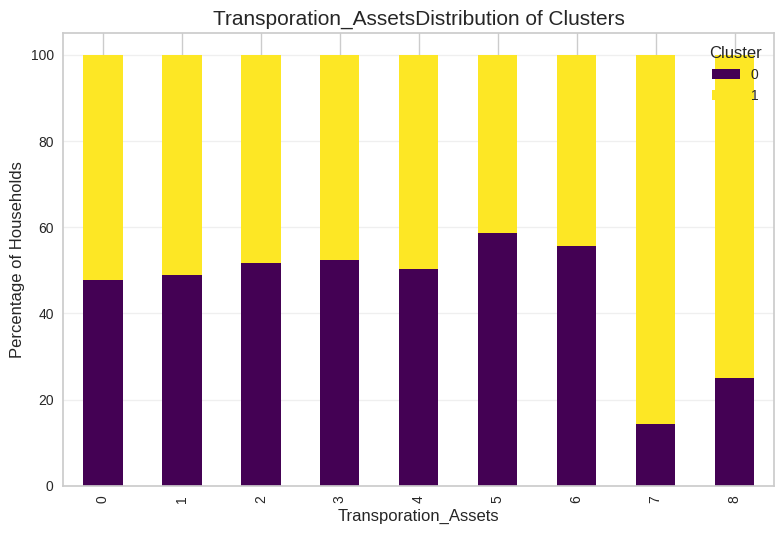

<Figure size 1400x800 with 0 Axes>

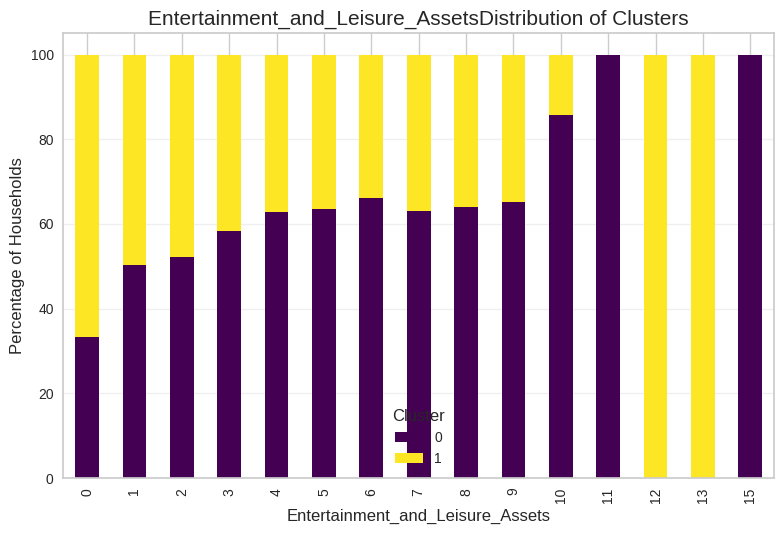

<Figure size 1400x800 with 0 Axes>

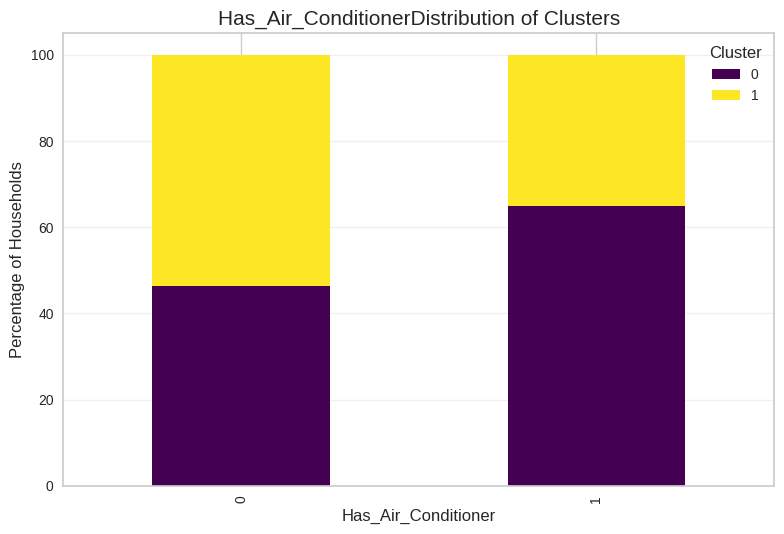

In [1827]:
# Show Distribution of columns per Household Assets per Cluster
for col in household_assets:
  region_cluster_distribution = pd.crosstab(
      df[col],
      df['Cluster'],
      normalize='index'
  ) * 100

  plt.figure(figsize=(14, 8))
  region_cluster_distribution.plot(kind='bar', stacked=True, colormap='viridis')
  plt.title(f'{col}Distribution of Clusters', fontsize=15)
  plt.xlabel(col, fontsize=12)
  plt.ylabel('Percentage of Households', fontsize=12)
  plt.legend(title='Cluster')
  plt.grid(True, alpha=0.3, axis='y')
  plt.tight_layout()
  plt.show()


In [1828]:
# Display Counts per Region, group by cluster
df.groupby('Cluster')['Region'].value_counts()

Cluster  Region                   
0        NCR                          2867
         IVA - CALABARZON             2550
         III - Central Luzon          1968
         VI - Western Visayas         1317
         VII - Central Visayas        1266
         I - Ilocos Region            1213
         XI - Davao Region            1120
         V - Bicol Region             1059
         VIII - Eastern Visayas       1015
         XII - SOCCSKSARGEN            871
         X - Northern Mindanao         824
         Caraga                        779
         II - Cagayan Valley           774
         IX - Zasmboanga Peninsula     713
         CAR                           629
          ARMM                         603
         IVB - MIMAROPA                465
1         ARMM                        1643
         IVA - CALABARZON             1609
         VI - Western Visayas         1532
         II - Cagayan Valley          1445
         V - Bicol Region             1412
         XI - Davao Region            1324
         VIII - Eastern Visayas       1321
         VII - Central Visayas        1275
         III - Central Luzon          1268
         NCR                          1252
         XII - SOCCSKSARGEN           1248
         I - Ilocos Region            1133
         CAR                          1096
         IX - Zasmboanga Peninsula    1074
         X - Northern Mindanao        1063
         Caraga                       1003
         IVB - MIMAROPA                784
Name: count, dtype: int64

<Figure size 1400x800 with 0 Axes>

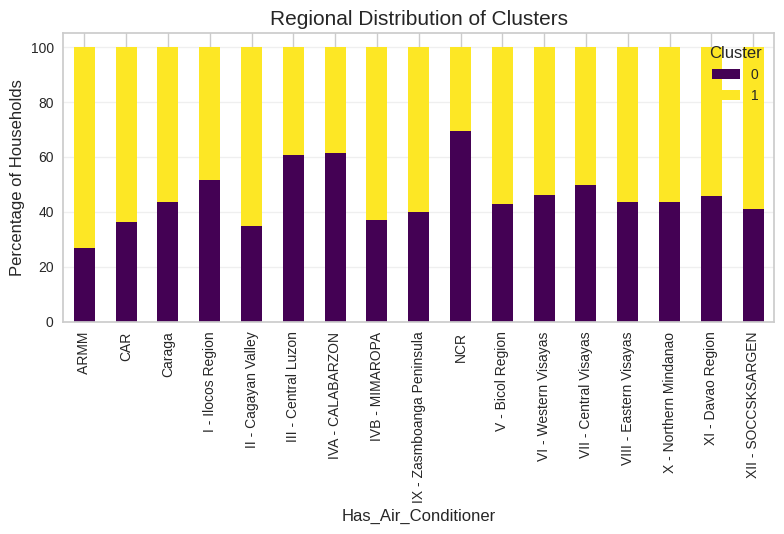

In [1829]:
region_cluster_distribution = pd.crosstab(
    df['Region'],
    df['Cluster'],
    normalize='index'
) * 100

plt.figure(figsize=(14, 8))
region_cluster_distribution.plot(kind='bar', stacked=True, colormap='viridis')
plt.title('Regional Distribution of Clusters', fontsize=15)
plt.xlabel(col, fontsize=12)
plt.ylabel('Percentage of Households', fontsize=12)
plt.legend(title='Cluster')
plt.grid(True, alpha=0.3, axis='y')
plt.tight_layout()
plt.show()


In [1830]:
df.groupby('Cluster')['Household Head Highest Grade Completed'].value_counts()

Cluster  Household Head Highest Grade Completed
0        5                                         5313
         3                                         3329
         2                                         3171
         7                                         3137
         4                                         2381
         6                                         2238
         0                                          369
         8                                           92
         1                                            3
1        2                                         5643
         5                                         4309
         3                                         4306
         4                                         2508
         7                                         2303
         6                                         1389
         0                                          857
         8                                          155
         1                                           12
Name: count, dtype: int64

<Figure size 1400x800 with 0 Axes>

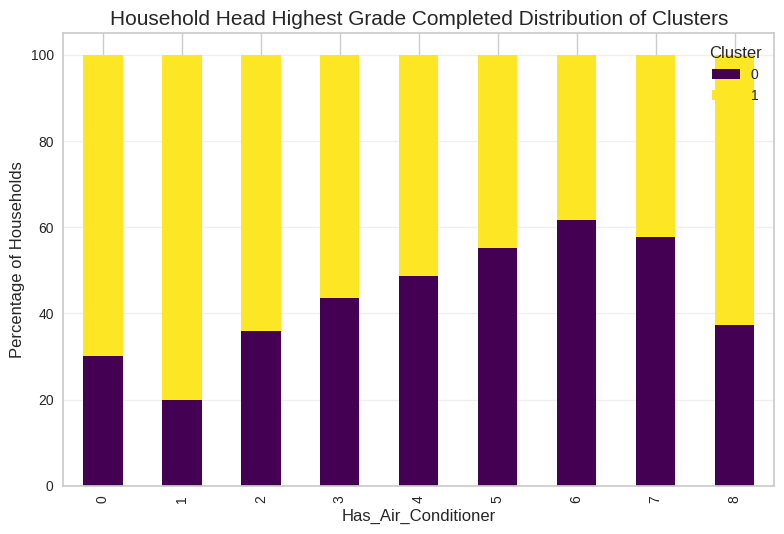

In [1831]:
region_cluster_distribution = pd.crosstab(
    df['Household Head Highest Grade Completed'],
    df['Cluster'],
    normalize='index'
) * 100

plt.figure(figsize=(14, 8))
region_cluster_distribution.plot(kind='bar', stacked=True, colormap='viridis')
plt.title('Household Head Highest Grade Completed Distribution of Clusters', fontsize=15)
plt.xlabel(col, fontsize=12)
plt.ylabel('Percentage of Households', fontsize=12)
plt.legend(title='Cluster')
plt.grid(True, alpha=0.3, axis='y')
plt.tight_layout()
plt.show()


In [1832]:
df.groupby('Cluster')['Household Head Occupation'].value_counts()

Cluster  Household Head Occupation                                           
0        Uncategorized                                                            7536
         Wholesale and retail trade; repair of motor vehicles and motorcycles     4188
         Transportation and storage                                               4170
         Manufacturing                                                            2010
         Other service activities                                                 1227
         Professional, Scientific and Technical Activities                         279
         Human Health and Social Work Activities                                   276
         Mining and quarrying                                                      183
         Information and communication                                              92
         Real estate activities                                                     39
         Water supply, sewerage, waste management and remediation activities        33
1        Agriculture, forestry, and fishing                                      13543
         Construction                                                             2962
         Government and Public Service                                            1521
         Administrative and Support Service Activities                            1470
         Accommodation and food service activities                                 594
         Education                                                                 501
         Financial and insurance activities                                        300
         Electricity, gas, steam and air conditioning supply                       256
         Arts, Entertainment and Recreation                                        217
         Human Health and Social Work Activities                                    91
         Directors and chief executives of corporations                             27
Name: count, dtype: int64

In [1833]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 41515 entries, 0 to 41543
Data columns (total 77 columns):
 #   Column                                         Non-Null Count  Dtype 
---  ------                                         --------------  ----- 
 0   Total Household Income                         41515 non-null  int64 
 1   Region                                         41515 non-null  object
 2   Total Food Expenditure                         41515 non-null  int64 
 3   Main Source of Income                          41515 non-null  object
 4   Agricultural Household indicator               41515 non-null  int64 
 5   Bread and Cereals Expenditure                  41515 non-null  int64 
 6   Total Rice Expenditure                         41515 non-null  int64 
 7   Meat Expenditure                               41515 non-null  int64 
 8   Total Fish and  marine products Expenditure    41515 non-null  int64 
 9   Fruit Expenditure                              41515 non-null  int

In [1834]:
# Family Columns
family_size_columns = ['Total Number of Family members', 'Members with age less than 5 year old',
                       'Members with age 5 - 17 years old', 'Total number of family members employed', 'Number of bedrooms',
                       'Number of Unemployed', 'Number of Kids', 'Number of Dependencies']

In [1835]:
# Facilities and House Desc
household_categorical_desc = ['Toilet Facilities', 'Tenure Status', 'Electricity', 'Main Source of Water Supply', 'Type of Walls',
                       'Type of Roof', 'Type of Building/House', 'Type of Household', 'Household Head Class of Worker',
                              'Household Head Highest Grade Completed', 'Household Head Occupation']

In [1836]:
house_numerical_columns = ['House Floor Area', 'House Age']

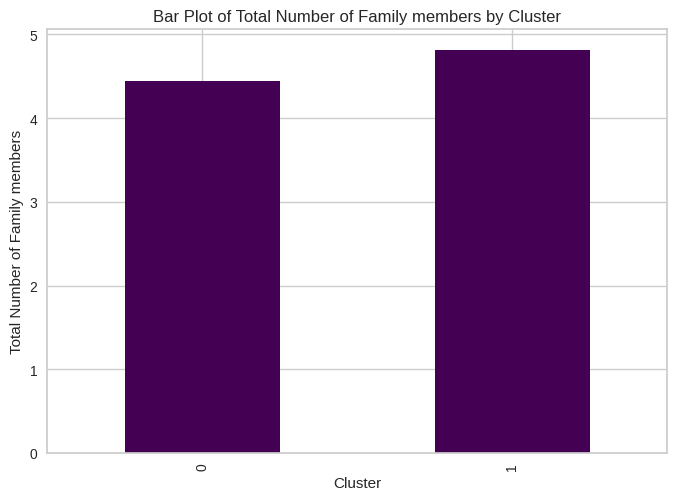

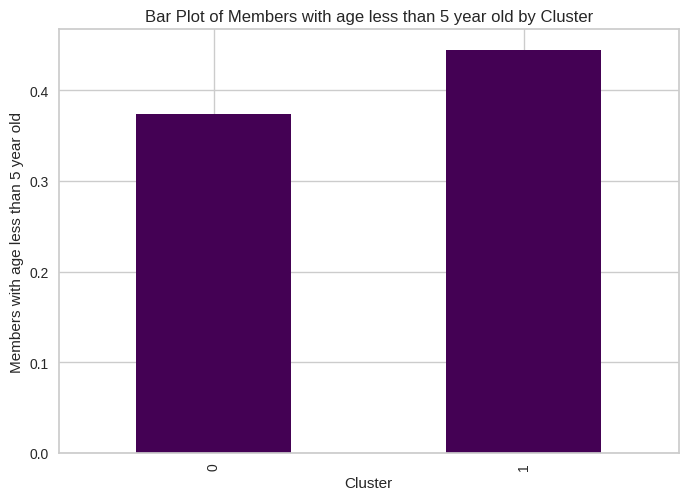

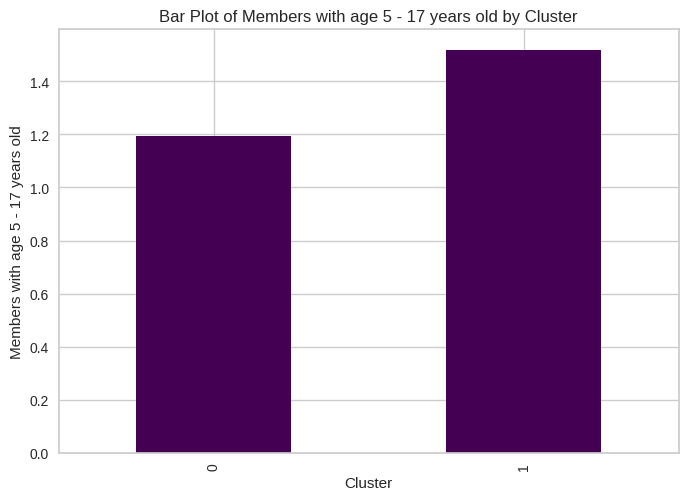

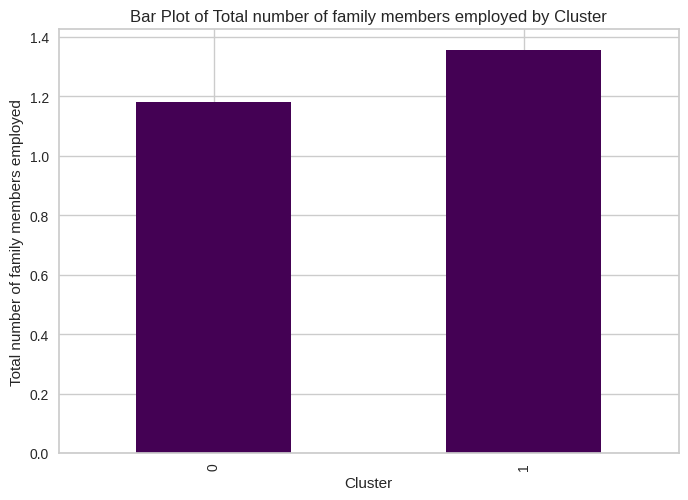

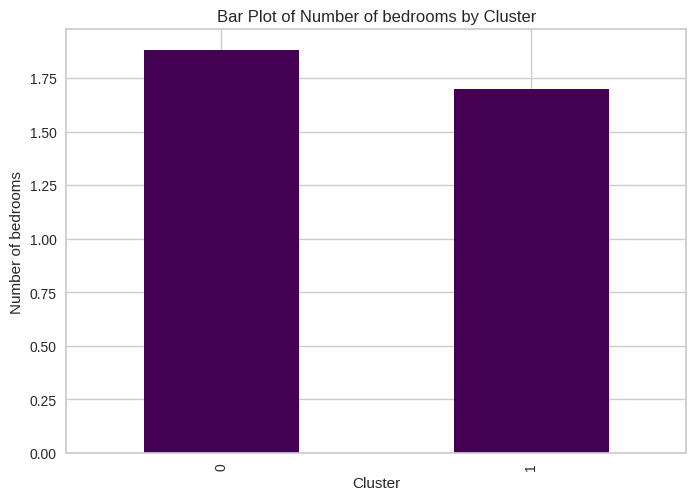

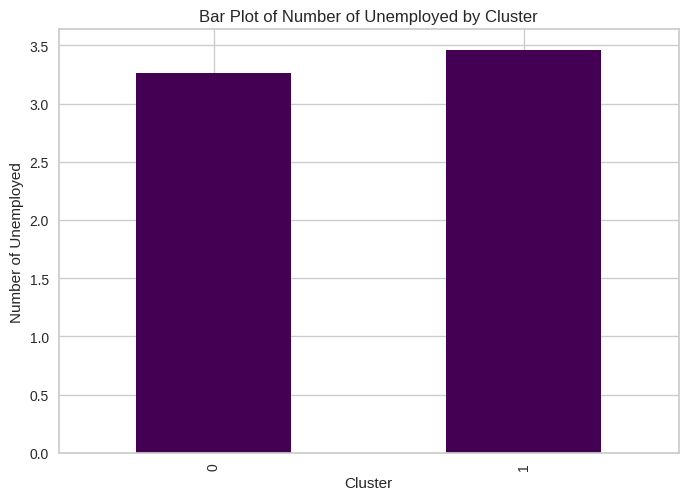

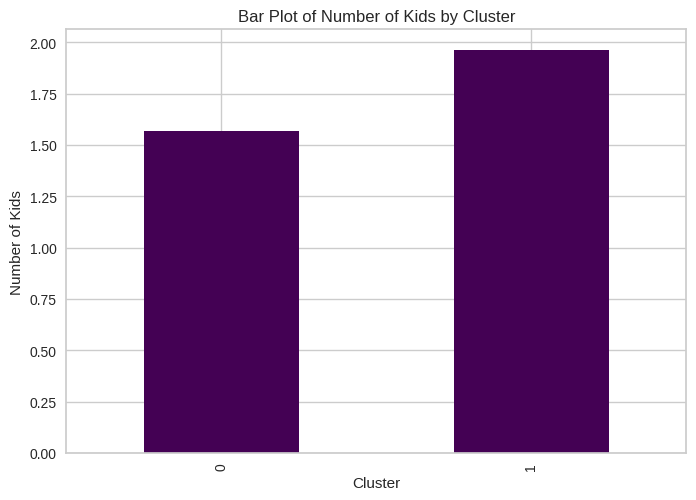

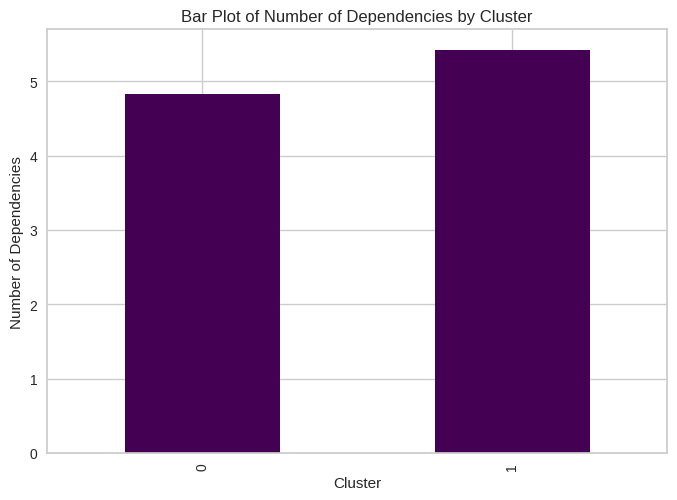

In [1837]:
# Bar Plot for family composition, based on Cluster and color coded
for column in family_size_columns:
    df.groupby('Cluster')[column].mean().plot(kind='bar', colormap='viridis')
    plt.xlabel('Cluster')
    plt.ylabel(column)
    plt.title(f'Bar Plot of {column} by Cluster')
    plt.show()

<Figure size 1400x800 with 0 Axes>

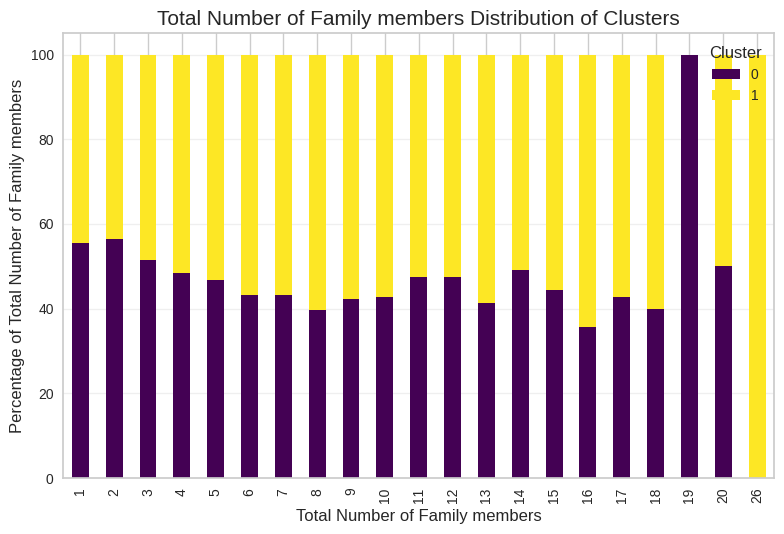

<Figure size 1400x800 with 0 Axes>

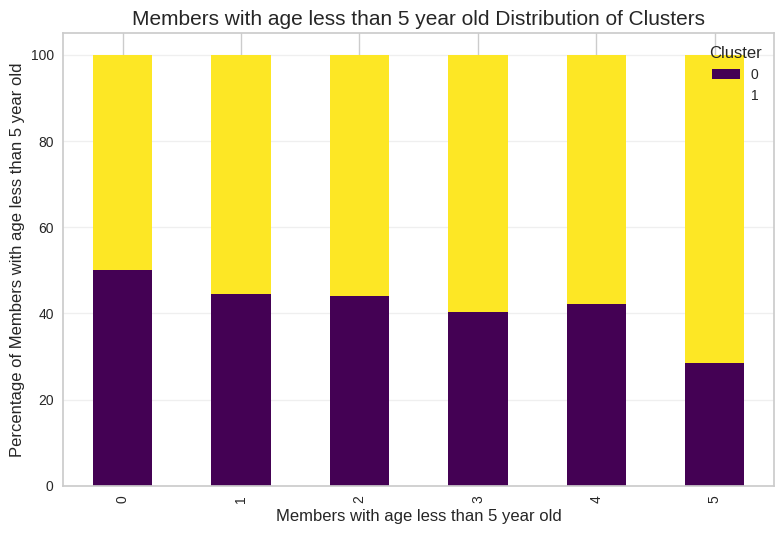

<Figure size 1400x800 with 0 Axes>

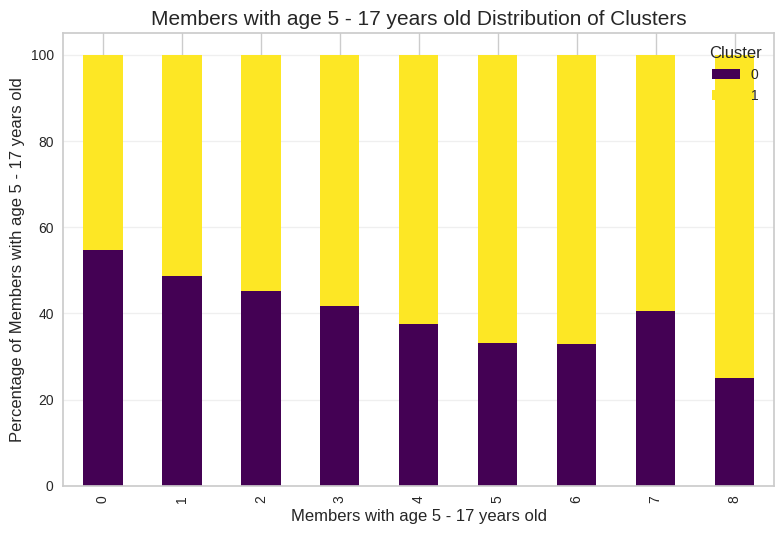

<Figure size 1400x800 with 0 Axes>

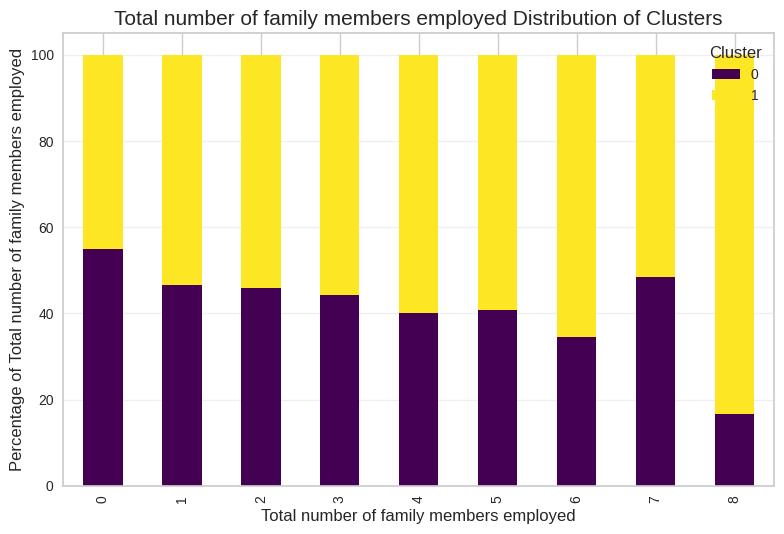

<Figure size 1400x800 with 0 Axes>

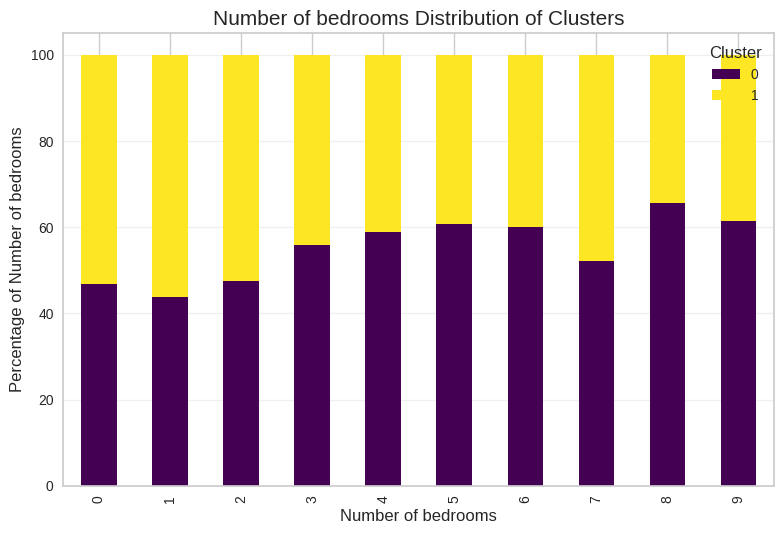

<Figure size 1400x800 with 0 Axes>

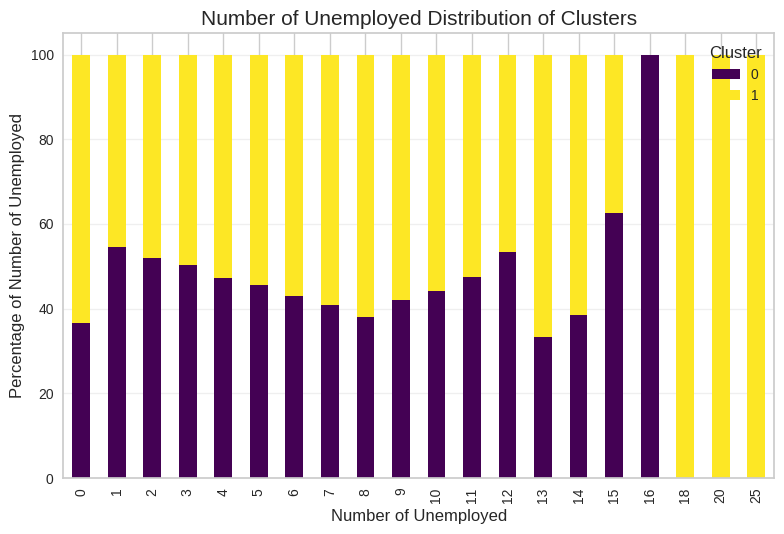

<Figure size 1400x800 with 0 Axes>

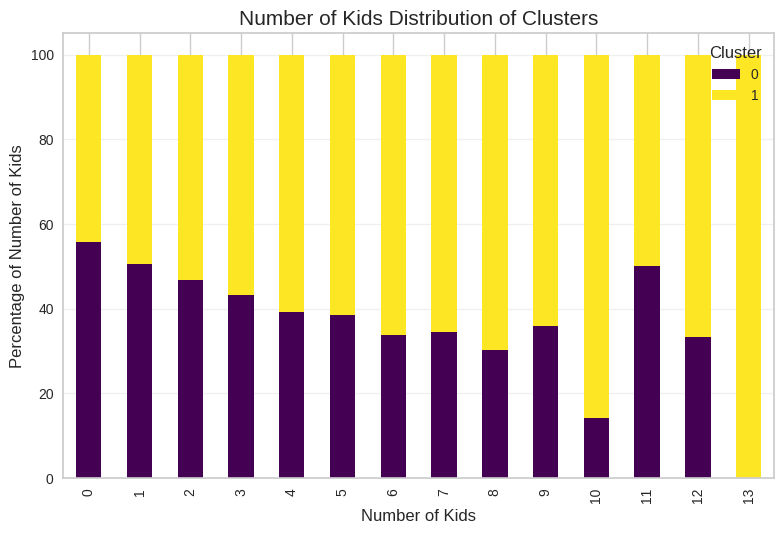

<Figure size 1400x800 with 0 Axes>

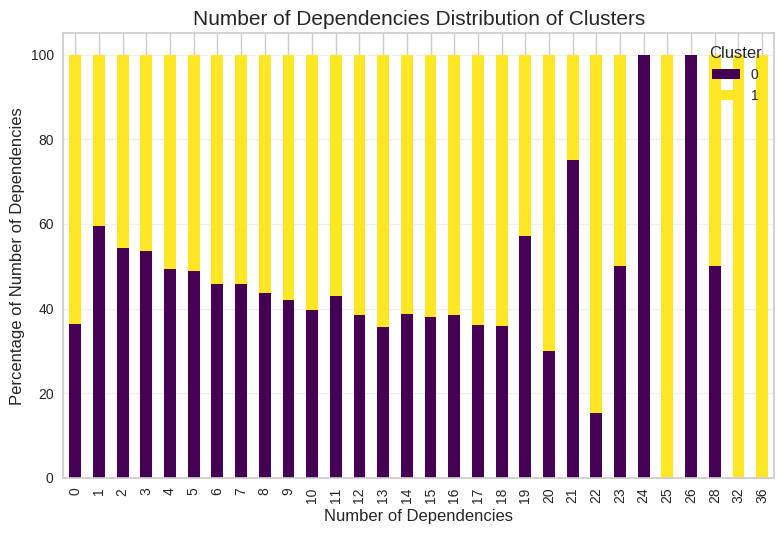

In [1838]:
for col in family_size_columns:
  region_cluster_distribution = pd.crosstab(
    df[col],
    df['Cluster'],
    normalize='index'
  ) * 100

  plt.figure(figsize=(14, 8))
  region_cluster_distribution.plot(kind='bar', stacked=True, colormap='viridis')
  plt.title(f'{col} Distribution of Clusters', fontsize=15)
  plt.xlabel(col, fontsize=12)
  plt.ylabel(f'Percentage of {col}', fontsize=12)
  plt.legend(title='Cluster')
  plt.grid(True, alpha=0.3, axis='y')
  plt.tight_layout()
  plt.show()

<Figure size 1400x800 with 0 Axes>

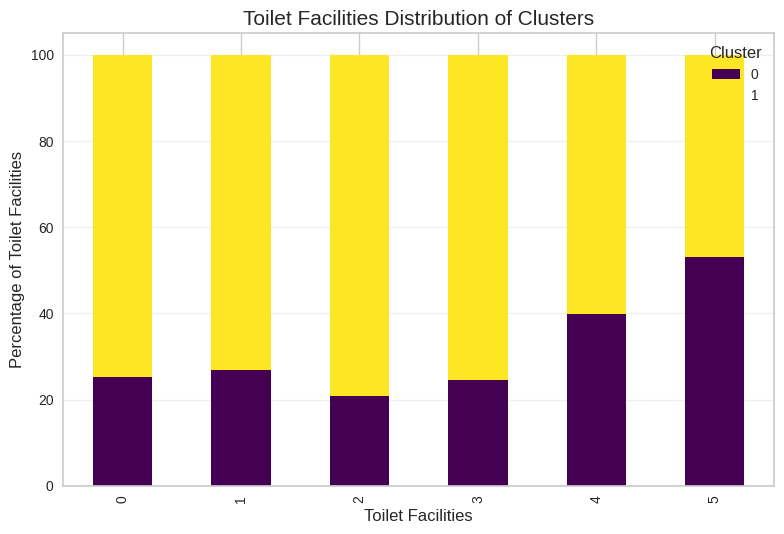

<Figure size 1400x800 with 0 Axes>

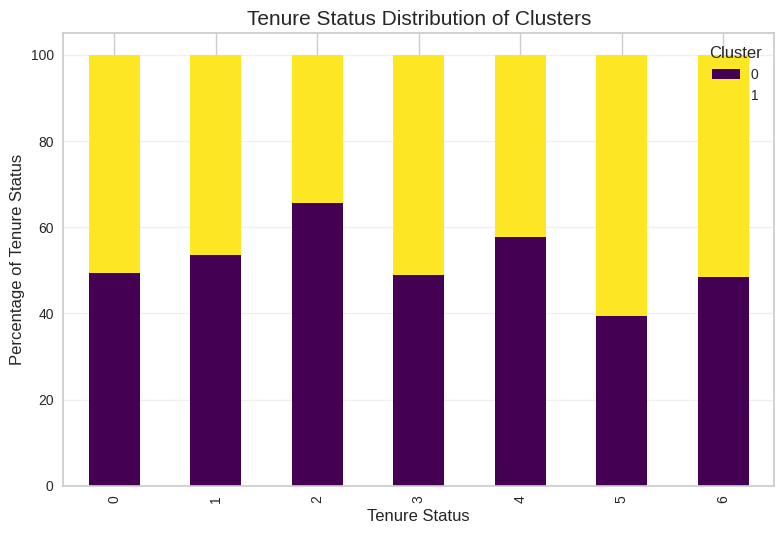

<Figure size 1400x800 with 0 Axes>

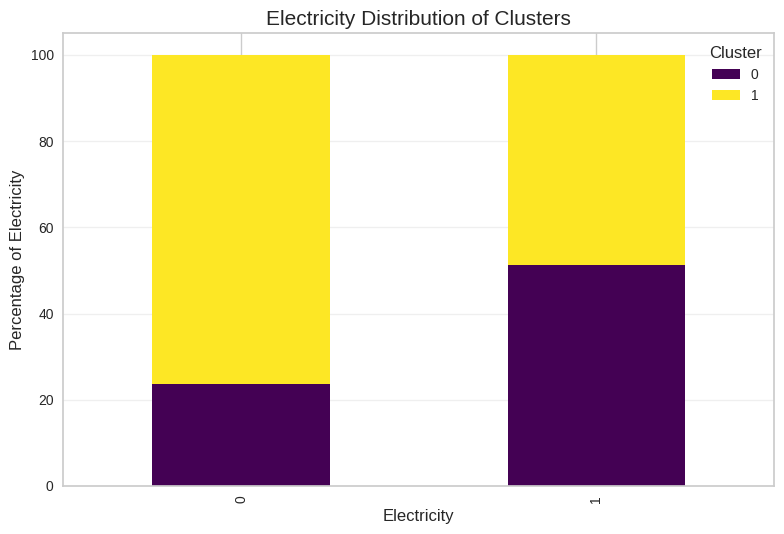

<Figure size 1400x800 with 0 Axes>

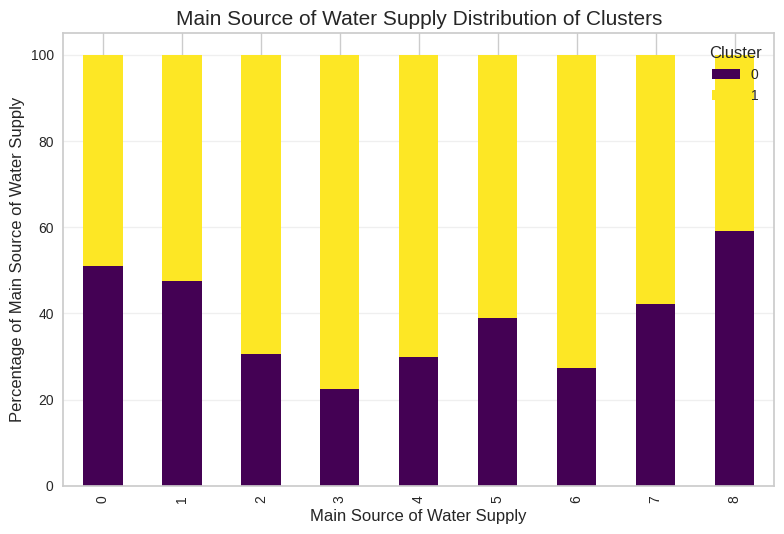

<Figure size 1400x800 with 0 Axes>

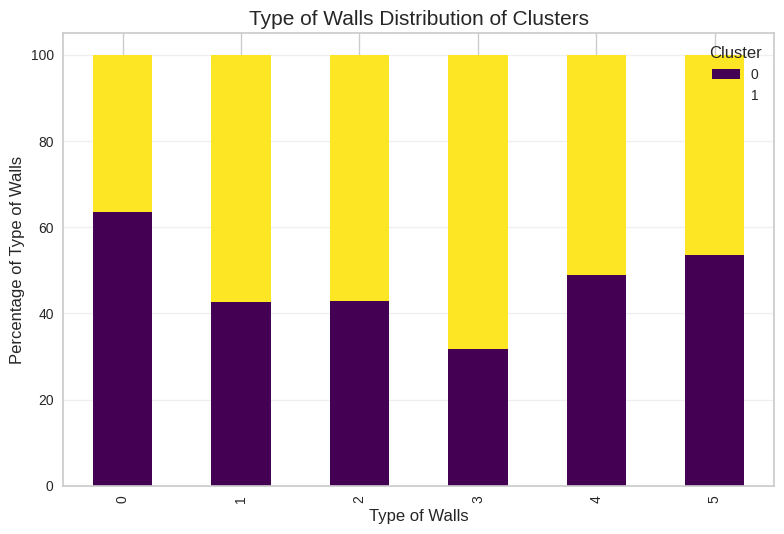

<Figure size 1400x800 with 0 Axes>

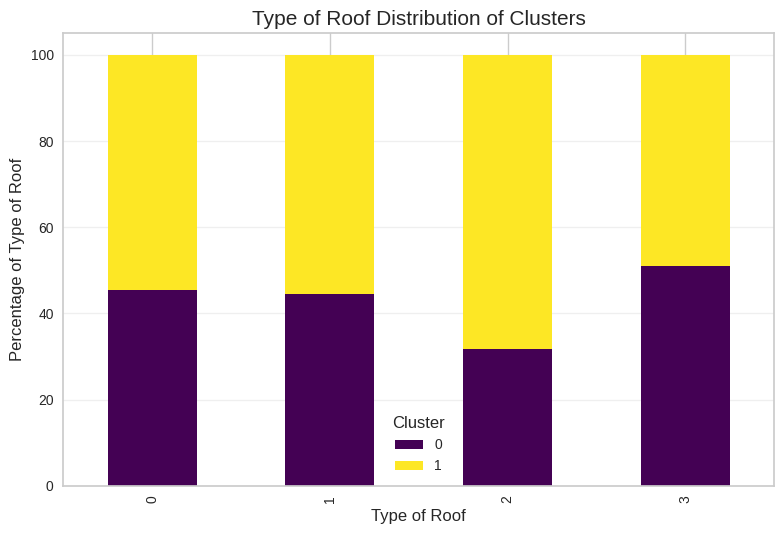

<Figure size 1400x800 with 0 Axes>

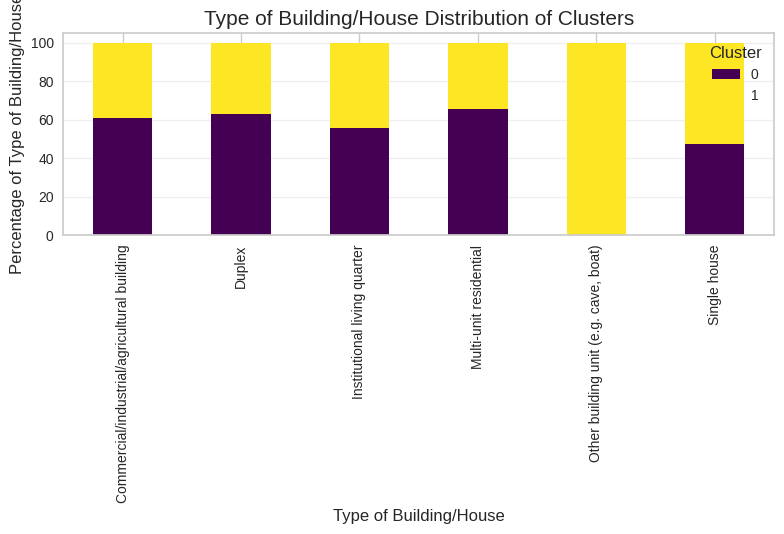

<Figure size 1400x800 with 0 Axes>

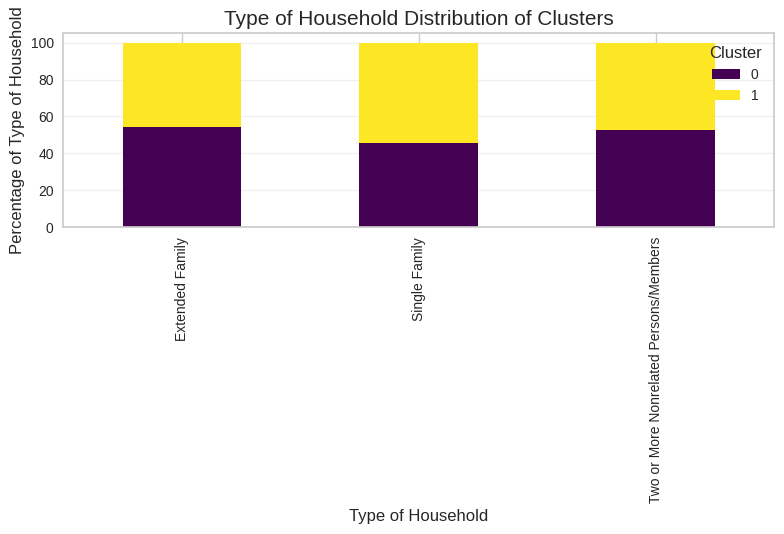

<Figure size 1400x800 with 0 Axes>

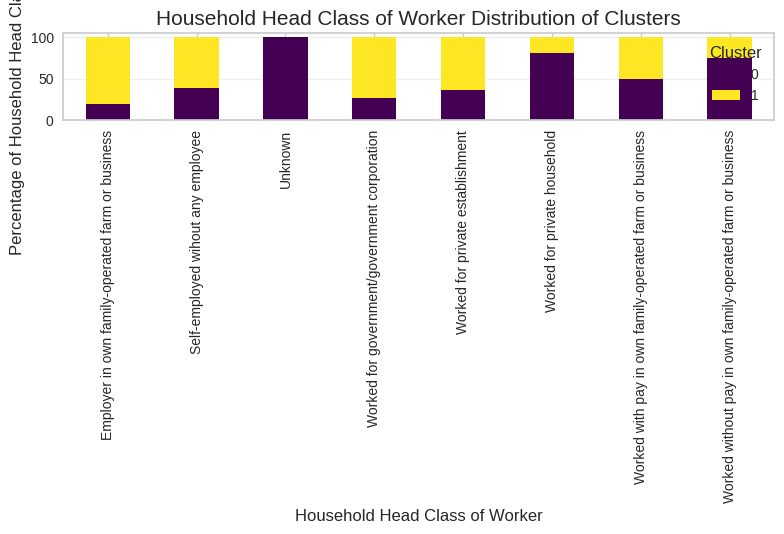

<Figure size 1400x800 with 0 Axes>

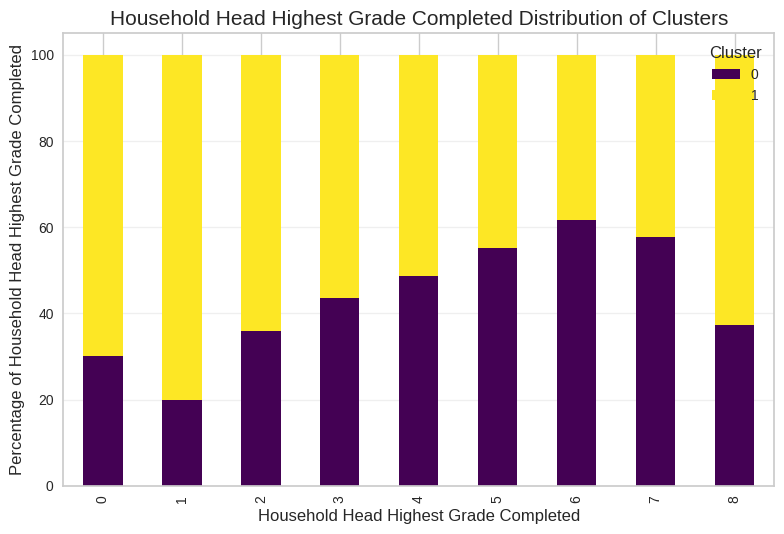

<Figure size 1400x800 with 0 Axes>

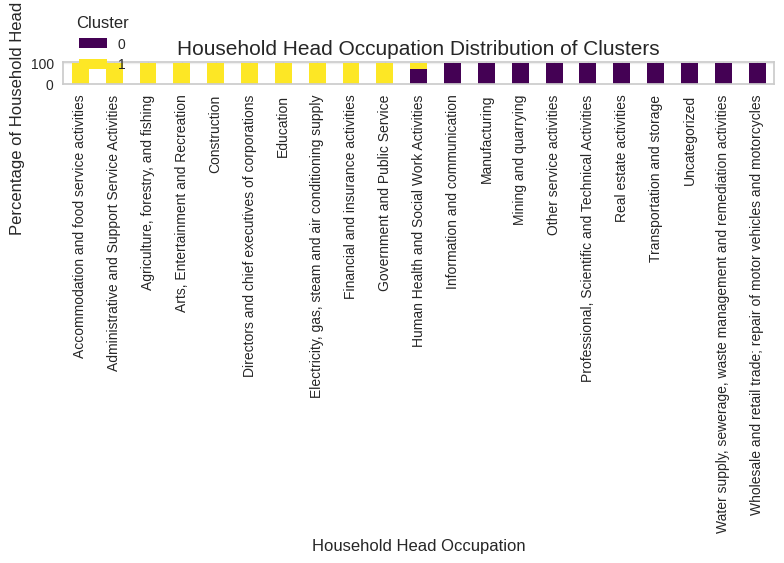

In [1839]:
for col in household_categorical_desc:
  region_cluster_distribution = pd.crosstab(
    df[col],
    df['Cluster'],
    normalize='index'
  ) * 100

  plt.figure(figsize=(14, 8))
  region_cluster_distribution.plot(kind='bar', stacked=True, colormap='viridis')
  plt.title(f'{col} Distribution of Clusters', fontsize=15)
  plt.xlabel(col, fontsize=12)
  plt.ylabel(f'Percentage of {col}', fontsize=12)
  plt.legend(title='Cluster')
  plt.grid(True, alpha=0.3, axis='y')
  plt.tight_layout()
  plt.show()